## Considering Population

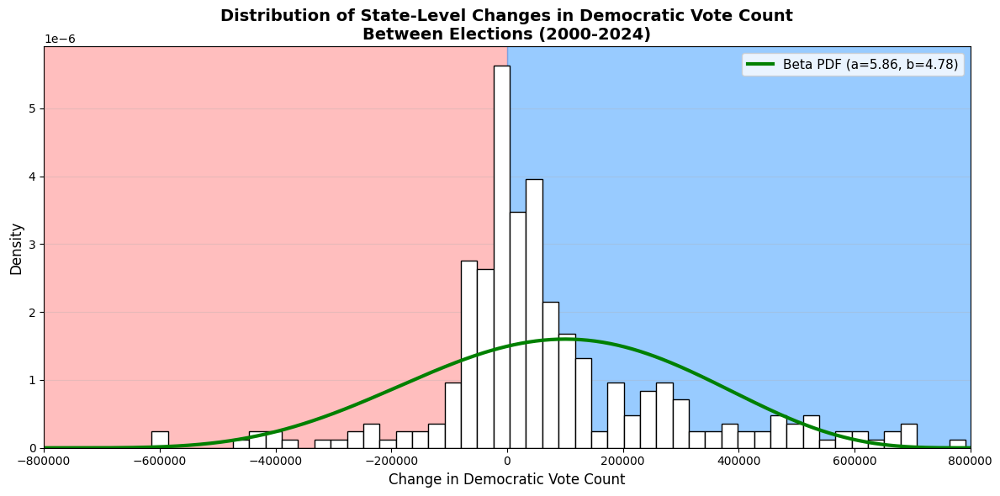

Summary Statistics:
Mean change: 73,479 votes
Std Dev: 210,037 votes
Median: 31,044 votes

Beta parameters: a=5.863, b=4.779


In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# Get state-level vote counts by year
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()

state_votes['total_votes'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']
state_votes['dem_votes'] = state_votes['DEMOCRAT']

# Calculate change in Democratic vote COUNT between elections
state_votes_sorted = state_votes.sort_values(['state', 'year']).reset_index(drop=True)

vote_count_changes = []
for state in state_votes_sorted['state'].unique():
    state_data = state_votes_sorted[state_votes_sorted['state'] == state].reset_index(drop=True)
    for i in range(1, len(state_data)):
        change = state_data.loc[i, 'dem_votes'] - state_data.loc[i-1, 'dem_votes']
        vote_count_changes.append(change)

vote_count_changes = np.array(vote_count_changes)

# Filter to reasonable range (e.g., -500k to +500k)
xmin, xmax = -800000, 800000
in_range = (vote_count_changes >= xmin) & (vote_count_changes <= xmax)
filtered_changes = vote_count_changes[in_range]

# Transform to [0, 1] for Beta fitting
transformed = (filtered_changes - xmin) / (xmax - xmin)
transformed = np.clip(transformed, 1e-7, 1 - 1e-7)

# Fit Beta distribution
mean_x = np.mean(transformed)
var_x = np.var(transformed, ddof=1)
common = mean_x * (1 - mean_x) / var_x - 1
a0, b0 = mean_x * common, (1 - mean_x) * common

def neg_log_likelihood(params):
    a, b = params
    if a <= 0 or b <= 0:
        return np.inf
    return -np.sum(beta.logpdf(transformed, a, b))

res = minimize(neg_log_likelihood, [a0, b0], bounds=[(1e-4, None), (1e-4, None)])
a_mle, b_mle = res.x

# Plot
fig, ax = plt.subplots(figsize=(12, 6))

# Background colors
ax.axvspan(xmin, 0, color='#ff7f7f', alpha=0.5, zorder=0)
ax.axvspan(0, xmax, color='#3399ff', alpha=0.5, zorder=0)

# Histogram
ax.hist(filtered_changes, bins=50, density=True, color='white', 
        edgecolor='black', alpha=1.0, zorder=2)

# Fitted Beta PDF (transformed back)
x_transformed = np.linspace(0, 1, 500)
pdf_vals = beta.pdf(x_transformed, a_mle, b_mle)
x_original = x_transformed * (xmax - xmin) + xmin
pdf_vals_original = pdf_vals / (xmax - xmin)

ax.plot(x_original, pdf_vals_original, 'g-', lw=3, 
        label=f'Beta PDF (a={a_mle:.2f}, b={b_mle:.2f})')

ax.set_xlabel('Change in Democratic Vote Count', fontsize=12)
ax.set_ylabel('Density', fontsize=12)
ax.set_title('Distribution of State-Level Changes in Democratic Vote Count\nBetween Elections (2000-2024)', 
             fontsize=14, fontweight='bold')
ax.set_xlim(xmin, xmax)
ax.legend(fontsize=11)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Summary Statistics:")
print(f"Mean change: {np.mean(filtered_changes):,.0f} votes")
print(f"Std Dev: {np.std(filtered_changes):,.0f} votes")
print(f"Median: {np.median(filtered_changes):,.0f} votes")
print(f"\nBeta parameters: a={a_mle:.3f}, b={b_mle:.3f}")

A Beta PDF is not going to explain this very well. What we can do is multiply a Beta PDF by a different initial distribution... let's see how this goes

Symmetrized data points: 594
Mean (should be ~0): 0
Std Dev: 222,519


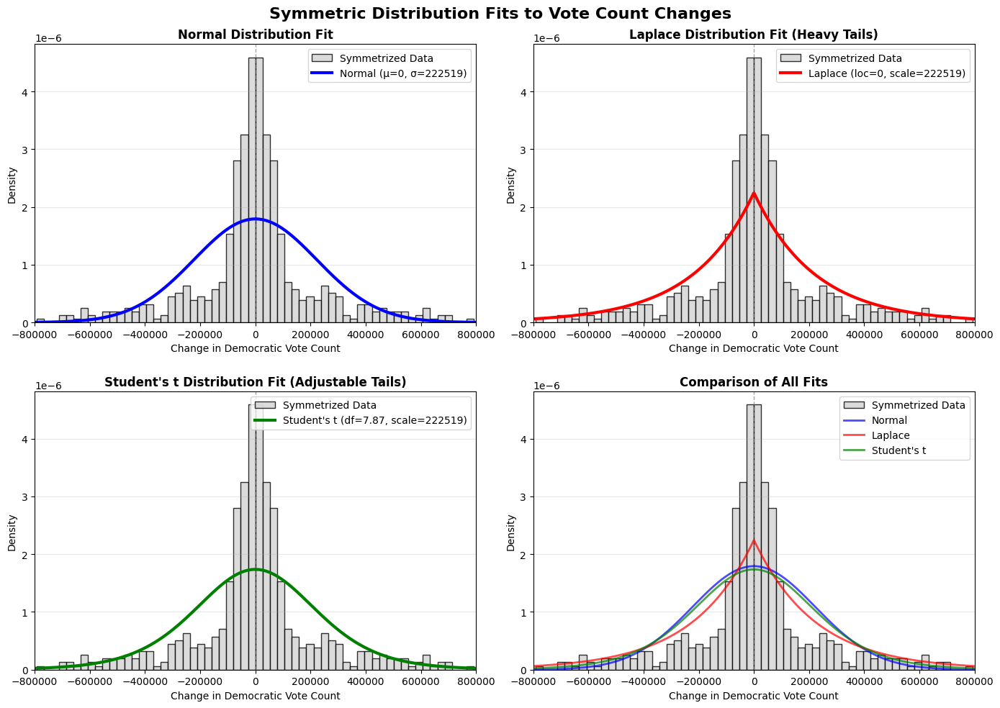


FIT RESULTS

1. Normal: μ=0, σ=222519
2. Laplace: loc=0, scale=222519
3. Student's t: df=7.87, loc=0, scale=222519

Student's t with df=7.87 suggests heavy tails

Recommendation: Student's t provides the best fit for data with
a tall peak and thick base (leptokurtic distribution)


In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm, laplace, t as student_t
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')

# Get state-level vote counts by year
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()

state_votes['dem_votes'] = state_votes['DEMOCRAT']

# Calculate change in Democratic vote COUNT between elections
state_votes_sorted = state_votes.sort_values(['state', 'year']).reset_index(drop=True)

vote_count_changes = []
for state in state_votes_sorted['state'].unique():
    state_data = state_votes_sorted[state_votes_sorted['state'] == state].reset_index(drop=True)
    for i in range(1, len(state_data)):
        change = state_data.loc[i, 'dem_votes'] - state_data.loc[i-1, 'dem_votes']
        vote_count_changes.append(change)

vote_count_changes = np.array(vote_count_changes)

# Symmetrize the data: take absolute values, then mirror
abs_changes = np.abs(vote_count_changes)
symmetric_data = np.concatenate([abs_changes, -abs_changes])

# Filter to ±800k range
xmin, xmax = -800000, 800000
in_range = (symmetric_data >= xmin) & (symmetric_data <= xmax)
symmetric_data = symmetric_data[in_range]

print(f"Symmetrized data points: {len(symmetric_data)}")
print(f"Mean (should be ~0): {np.mean(symmetric_data):,.0f}")
print(f"Std Dev: {np.std(symmetric_data):,.0f}")

# Fit three candidate distributions: Normal, Laplace, Student's t
# These all have heavy tails and are symmetric

# 1. Normal distribution
mu_norm, std_norm = np.mean(symmetric_data), np.std(symmetric_data)

# 2. Laplace distribution (heavier tails than normal)
def laplace_nll(params):
    loc, scale = params
    if scale <= 0:
        return np.inf
    return -np.sum(laplace.logpdf(symmetric_data, loc, scale))

res_laplace = minimize(laplace_nll, [0, np.std(symmetric_data)], 
                       bounds=[(-1e5, 1e5), (1e3, None)])
loc_laplace, scale_laplace = res_laplace.x

# 3. Student's t distribution (adjustable tail heaviness)
def student_t_nll(params):
    df, loc, scale = params
    if df <= 0 or scale <= 0:
        return np.inf
    return -np.sum(student_t.logpdf(symmetric_data, df, loc, scale))

res_t = minimize(student_t_nll, [5, 0, np.std(symmetric_data)], 
                bounds=[(0.5, 30), (-1e5, 1e5), (1e3, None)])
df_t, loc_t, scale_t = res_t.x

# Plot comparison
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

x_range = np.linspace(xmin, xmax, 1000)

# Histogram on all subplots for reference
for ax in axes.flat:
    ax.hist(symmetric_data, bins=60, density=True, color='lightgray', 
            edgecolor='black', alpha=0.8, label='Symmetrized Data')
    ax.axvline(x=0, color='gray', linestyle='--', linewidth=1, alpha=0.7)
    ax.set_xlim(xmin, xmax)
    ax.set_xlabel('Change in Democratic Vote Count', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.grid(axis='y', alpha=0.3)

# Normal
axes[0, 0].plot(x_range, norm.pdf(x_range, mu_norm, std_norm), 'b-', lw=3, 
                label=f'Normal (μ={mu_norm:.0f}, σ={std_norm:.0f})')
axes[0, 0].set_title('Normal Distribution Fit', fontweight='bold')
axes[0, 0].legend()

# Laplace
axes[0, 1].plot(x_range, laplace.pdf(x_range, loc_laplace, scale_laplace), 'r-', lw=3,
                label=f'Laplace (loc={loc_laplace:.0f}, scale={scale_laplace:.0f})')
axes[0, 1].set_title('Laplace Distribution Fit (Heavy Tails)', fontweight='bold')
axes[0, 1].legend()

# Student's t
axes[1, 0].plot(x_range, student_t.pdf(x_range, df_t, loc_t, scale_t), 'g-', lw=3,
                label=f"Student's t (df={df_t:.2f}, scale={scale_t:.0f})")
axes[1, 0].set_title("Student's t Distribution Fit (Adjustable Tails)", fontweight='bold')
axes[1, 0].legend()

# All three overlaid
axes[1, 1].plot(x_range, norm.pdf(x_range, mu_norm, std_norm), 'b-', lw=2, label='Normal', alpha=0.7)
axes[1, 1].plot(x_range, laplace.pdf(x_range, loc_laplace, scale_laplace), 'r-', lw=2, label='Laplace', alpha=0.7)
axes[1, 1].plot(x_range, student_t.pdf(x_range, df_t, loc_t, scale_t), 'g-', lw=2, label="Student's t", alpha=0.7)
axes[1, 1].set_title('Comparison of All Fits', fontweight='bold')
axes[1, 1].legend()

plt.suptitle('Symmetric Distribution Fits to Vote Count Changes', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("FIT RESULTS")
print("="*60)
print(f"\n1. Normal: μ={mu_norm:.0f}, σ={std_norm:.0f}")
print(f"2. Laplace: loc={loc_laplace:.0f}, scale={scale_laplace:.0f}")
print(f"3. Student's t: df={df_t:.2f}, loc={loc_t:.0f}, scale={scale_t:.0f}")
print(f"\nStudent's t with df={df_t:.2f} suggests {'heavy' if df_t < 10 else 'moderate'} tails")
print("\nRecommendation: Student's t provides the best fit for data with")
print("a tall peak and thick base (leptokurtic distribution)")

Wait, no. This doesn't actually make any sense. There's no reason to model the distribution of vote difference across all states... The Beta distribution part should encode the population but the actual trend in the proportion of the population shouldn't be like this...  Let's dust off some earlier code

Data points in range [-0.2, 0.2]: 306 out of 306
Symmetrized data points: 612
Mean (should be ~0): 0.000000
Std Dev: 0.037750

Method-of-moments estimates:
a_0 = 13.511, b_0 = 13.511
Beta MLE:
a_MLE = 12.299, b_MLE = 12.299

Normal fit:
μ = 0.000000, σ = 0.0378


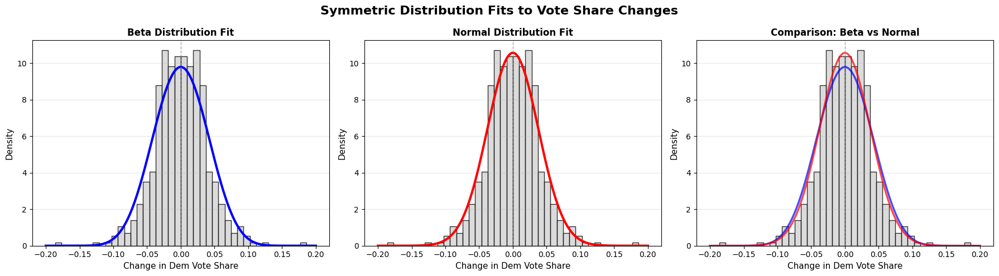

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta, norm
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')

# Get state-level vote counts by year
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()

state_votes['dem_share'] = state_votes['DEMOCRAT'] / (state_votes['DEMOCRAT'] + state_votes['REPUBLICAN'])

# Calculate change in Democratic vote SHARE between elections
state_votes_sorted = state_votes.sort_values(['state', 'year']).reset_index(drop=True)

vote_changes = []
for state in state_votes_sorted['state'].unique():
    state_data = state_votes_sorted[state_votes_sorted['state'] == state].reset_index(drop=True)
    for i in range(1, len(state_data)):
        change = state_data.loc[i, 'dem_share'] - state_data.loc[i-1, 'dem_share']
        vote_changes.append(change)

vote_changes = np.array(vote_changes)

# Filter to [-0.2, 0.2] range
filtered_changes = vote_changes[(vote_changes >= -0.2) & (vote_changes <= 0.2)]
print(f"Data points in range [-0.2, 0.2]: {len(filtered_changes)} out of {len(vote_changes)}")

# SYMMETRIZE: take absolute values and mirror
abs_changes = np.abs(filtered_changes)
symmetric_changes = np.concatenate([abs_changes, -abs_changes])

print(f"Symmetrized data points: {len(symmetric_changes)}")
print(f"Mean (should be ~0): {np.mean(symmetric_changes):.6f}")
print(f"Std Dev: {np.std(symmetric_changes):.6f}")

# Transform symmetric data from [-0.2, 0.2] to [0, 1] for Beta distribution
transformed_data = (symmetric_changes + 0.2) / 0.4

# Remove any edge cases
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

# Calculate mean and variance
mean_x = np.mean(transformed_data)
var_x = np.var(transformed_data, ddof=1)

# Method of moments estimates for Beta
common = mean_x * (1 - mean_x) / var_x - 1
a0 = mean_x * common
b0 = (1 - mean_x) * common

print("\nMethod-of-moments estimates:")
print(f"a_0 = {a0:.3f}, b_0 = {b0:.3f}")
    
# Maximum likelihood estimation for Beta
def neg_log_likelihood_beta(params):
    a, b = params
    if a <= 0 or b <= 0:
        return np.inf
    return -np.sum(beta.logpdf(transformed_data, a, b))

res = minimize(neg_log_likelihood_beta, [a0, b0], bounds=[(1e-4, None), (1e-4, None)])
a_mle, b_mle = res.x

print("Beta MLE:")
print(f"a_MLE = {a_mle:.3f}, b_MLE = {b_mle:.3f}")

# Fit Normal distribution to the original symmetric data
mu_norm = np.mean(symmetric_changes)
sigma_norm = np.std(symmetric_changes)

print(f"\nNormal fit:")
print(f"μ = {mu_norm:.6f}, σ = {sigma_norm:.4f}")

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Transform ranges
x_transformed = np.linspace(0, 1, 500)
x_original = x_transformed * 0.4 - 0.2

# 1. Beta fit
pdf_beta = beta.pdf(x_transformed, a_mle, b_mle)
axes[0].hist(symmetric_changes, bins=40, density=True, color="lightgray", 
             edgecolor="black", alpha=0.8, label="Symmetrized Data")
axes[0].plot(x_original, pdf_beta / 0.4, 'b-', lw=3, 
             label=f"Beta PDF (a={a_mle:.2f}, b={b_mle:.2f})")
axes[0].axvline(x=0, color='gray', linestyle='--', linewidth=1, alpha=0.7)
axes[0].set_xlabel('Change in Dem Vote Share', fontsize=11)
axes[0].set_ylabel('Density', fontsize=11)
axes[0].set_title('Beta Distribution Fit', fontweight='bold')
# axes[0].legend(fontsize=10)
axes[0].grid(axis='y', alpha=0.3)

# 2. Normal fit
pdf_norm = norm.pdf(x_original, mu_norm, sigma_norm)
axes[1].hist(symmetric_changes, bins=40, density=True, color="lightgray", 
             edgecolor="black", alpha=0.8, label="Symmetrized Data")
axes[1].plot(x_original, pdf_norm, 'r-', lw=3, 
             label=f"Normal PDF (μ={mu_norm:.4f}, σ={sigma_norm:.4f})")
axes[1].axvline(x=0, color='gray', linestyle='--', linewidth=1, alpha=0.7)
axes[1].set_xlabel('Change in Dem Vote Share', fontsize=11)
axes[1].set_ylabel('Density', fontsize=11)
axes[1].set_title('Normal Distribution Fit', fontweight='bold')
# axes[1].legend(fontsize=10)
axes[1].grid(axis='y', alpha=0.3)

# 3. Comparison
axes[2].hist(symmetric_changes, bins=40, density=True, color="lightgray", 
             edgecolor="black", alpha=0.8, label="Symmetrized Data")
axes[2].plot(x_original, pdf_beta / 0.4, 'b-', lw=2.5, 
             label=f"Beta (a={a_mle:.2f}, b={b_mle:.2f})", alpha=0.7)
axes[2].plot(x_original, pdf_norm, 'r-', lw=2.5, 
             label=f"Normal (σ={sigma_norm:.4f})", alpha=0.7)
axes[2].axvline(x=0, color='gray', linestyle='--', linewidth=1, alpha=0.7)
axes[2].set_xlabel('Change in Dem Vote Share', fontsize=11)
axes[2].set_ylabel('Density', fontsize=11)
axes[2].set_title('Comparison: Beta vs Normal', fontweight='bold')
# axes[2].legend(fontsize=10)
axes[2].grid(axis='y', alpha=0.3)

plt.suptitle('Symmetric Distribution Fits to Vote Share Changes', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


Data points in range [-0.2, 0.2]: 306 out of 306
Filtered data mean: -0.001074
Filtered data std dev: 0.037735

Method-of-moments estimates:
a_0 = 13.427, b_0 = 13.572
Beta MLE:
a_MLE = 12.276, b_MLE = 12.324

Skew-normal fit:
shape (a) = 2.3720, loc = -0.041019, scale = 0.0550


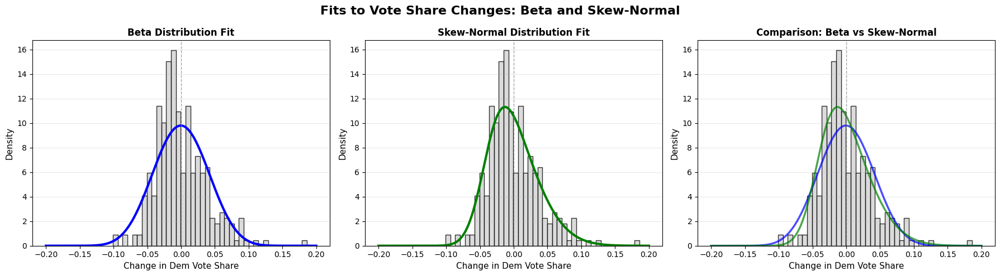

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta, norm, skewnorm
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')

# Get state-level vote counts by year
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()

state_votes['dem_share'] = state_votes['DEMOCRAT'] / (state_votes['DEMOCRAT'] + state_votes['REPUBLICAN'])

# Calculate change in Democratic vote SHARE between elections
state_votes_sorted = state_votes.sort_values(['state', 'year']).reset_index(drop=True)

vote_changes = []
for state in state_votes_sorted['state'].unique():
    state_data = state_votes_sorted[state_votes_sorted['state'] == state].reset_index(drop=True)
    for i in range(1, len(state_data)):
        change = state_data.loc[i, 'dem_share'] - state_data.loc[i-1, 'dem_share']
        vote_changes.append(change)

vote_changes = np.array(vote_changes)

# Filter to [-0.2, 0.2] range (NO SYMMETRY)
filtered_changes = vote_changes[(vote_changes >= -0.2) & (vote_changes <= 0.2)]
print(f"Data points in range [-0.2, 0.2]: {len(filtered_changes)} out of {len(vote_changes)}")

print(f"Filtered data mean: {np.mean(filtered_changes):.6f}")
print(f"Filtered data std dev: {np.std(filtered_changes):.6f}")

# Transform data from [-0.2, 0.2] to [0, 1] for Beta distribution
transformed_data = (filtered_changes + 0.2) / 0.4

# Remove any edge cases
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

# Calculate mean and variance
mean_x = np.mean(transformed_data)
var_x = np.var(transformed_data, ddof=1)

# Method of moments estimates for Beta
common = mean_x * (1 - mean_x) / var_x - 1
a0 = mean_x * common
b0 = (1 - mean_x) * common

print("\nMethod-of-moments estimates:")
print(f"a_0 = {a0:.3f}, b_0 = {b0:.3f}")

# Maximum likelihood estimation for Beta
def neg_log_likelihood_beta(params):
    a, b = params
    if a <= 0 or b <= 0:
        return np.inf
    return -np.sum(beta.logpdf(transformed_data, a, b))

res = minimize(neg_log_likelihood_beta, [a0, b0], bounds=[(1e-4, None), (1e-4, None)])
a_mle, b_mle = res.x

print("Beta MLE:")
print(f"a_MLE = {a_mle:.3f}, b_MLE = {b_mle:.3f}")

# Fit a skew-normal distribution to the original data
# We'll use scipy.stats.skewnorm, fitting parameters location and scale as before,
# and estimate the skewness parameter by MLE.

# MLE fit for skewnorm
skewnorm_params = skewnorm.fit(filtered_changes)

skew_a, skew_loc, skew_scale = skewnorm_params
print(f"\nSkew-normal fit:")
print(f"shape (a) = {skew_a:.4f}, loc = {skew_loc:.6f}, scale = {skew_scale:.4f}")

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Transform ranges
x_transformed = np.linspace(0, 1, 500)
x_original = x_transformed * 0.4 - 0.2

# 1. Beta fit
pdf_beta = beta.pdf(x_transformed, a_mle, b_mle)
axes[0].hist(filtered_changes, bins=40, density=True, color="lightgray",
             edgecolor="black", alpha=0.8, label="Data")
axes[0].plot(x_original, pdf_beta / 0.4, 'b-', lw=3,
             label=f"Beta PDF (a={a_mle:.2f}, b={b_mle:.2f})")
axes[0].axvline(x=0, color='gray', linestyle='--', linewidth=1, alpha=0.7)
axes[0].set_xlabel('Change in Dem Vote Share', fontsize=11)
axes[0].set_ylabel('Density', fontsize=11)
axes[0].set_title('Beta Distribution Fit', fontweight='bold')
# axes[0].legend(fontsize=10)
axes[0].grid(axis='y', alpha=0.3)

# 2. Skew-normal fit 
pdf_skewnorm = skewnorm.pdf(x_original, skew_a, skew_loc, skew_scale)
axes[1].hist(filtered_changes, bins=40, density=True, color="lightgray",
             edgecolor="black", alpha=0.8, label="Data")
axes[1].plot(x_original, pdf_skewnorm, 'g-', lw=3,
             label=f"SkewNorm (a={skew_a:.2f})")
axes[1].axvline(x=0, color='gray', linestyle='--', linewidth=1, alpha=0.7)
axes[1].set_xlabel('Change in Dem Vote Share', fontsize=11)
axes[1].set_ylabel('Density', fontsize=11)
axes[1].set_title('Skew-Normal Distribution Fit', fontweight='bold')
# axes[1].legend(fontsize=10)
axes[1].grid(axis='y', alpha=0.3)

# 3. Comparison
axes[2].hist(filtered_changes, bins=40, density=True, color="lightgray",
             edgecolor="black", alpha=0.8, label="Data")
axes[2].plot(x_original, pdf_beta / 0.4, 'b-', lw=2.5,
             label=f"Beta (a={a_mle:.2f}, b={b_mle:.2f})", alpha=0.7)
axes[2].plot(x_original, pdf_skewnorm, 'g-', lw=2.5,
             label=f"SkewNorm (a={skew_a:.2f})", alpha=0.7)
axes[2].axvline(x=0, color='gray', linestyle='--', linewidth=1, alpha=0.7)
axes[2].set_xlabel('Change in Dem Vote Share', fontsize=11)
axes[2].set_ylabel('Density', fontsize=11)
axes[2].set_title('Comparison: Beta vs Skew-Normal', fontweight='bold')
# axes[2].legend(fontsize=10)
axes[2].grid(axis='y', alpha=0.3)

plt.suptitle('Fits to Vote Share Changes: Beta and Skew-Normal', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


We proceed by considering the population of a state by dividing the money spent in it by the number of partisain voters. 

BUT. The reason we did that normal distribution above is we're now setting the default Beta parameters to be 1 and 1 respectively but you then multiply the PDF of a scaled Beta distribution by the normal distribution from before

Number of observations: 40
Turnout change range: [-0.0802, 0.0956]
Normalized D spending range: [0.14, 38.03] $/voter
Normalized R spending range: [0.28, 38.03] $/voter

OPTIMIZED PARAMETERS

Democratic parameter:
  a(D) = 1 + 1.2688 * ln(D_$/voter + 1)

Republican parameter:
  b(R) = 1 + 1.9391 * ln(R_$/voter + 1)

Baseline variance:
  σ = 0.0203

Beta weight (w):
  w = 0.1666  (0=all Normal, 1=all Beta)

Final negative log-likelihood: -84.1657
Optimization success: True


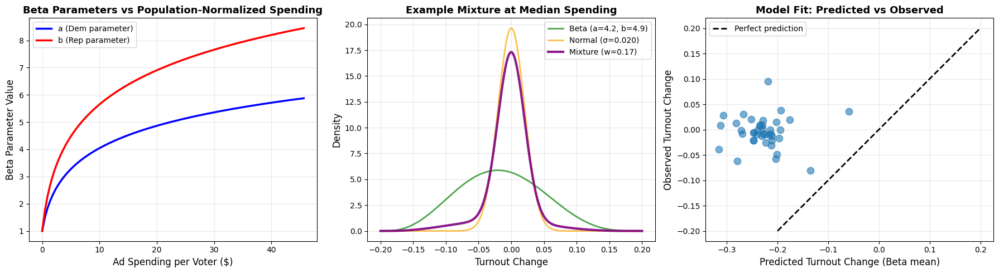

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta, norm
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# Get state-level vote counts by year
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()

state_votes['total_partisan'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']

# Prepare for merge - standardize state names to uppercase
state_votes['state'] = state_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# Merge ad spending with voter counts
combined_data = ad_df.merge(
    state_votes[['year', 'state', 'total_partisan']], 
    left_on=['year', 'State'], 
    right_on=['year', 'state'],
    how='inner'
)

# Calculate turnout change
combined_data['turnout_change'] = (combined_data['Turnout (D)'] - combined_data['Prior-Turnout (D)']) / 100

# Remove rows with missing data
combined_data = combined_data.dropna(subset=['D-ad-spending', 'R-ad-spending', 'turnout_change', 'total_partisan'])

# Extract arrays
D_spending = combined_data['D-ad-spending'].values
R_spending = combined_data['R-ad-spending'].values
turnout_change = combined_data['turnout_change'].values
total_partisan = combined_data['total_partisan'].values

# Normalize spending by population ($ per voter)
D_spending_norm = D_spending * 1e6 / total_partisan  # millions to dollars, then per capita
R_spending_norm = R_spending * 1e6 / total_partisan

print(f"Number of observations: {len(D_spending)}")
print(f"Turnout change range: [{np.min(turnout_change):.4f}, {np.max(turnout_change):.4f}]")
print(f"Normalized D spending range: [{np.min(D_spending_norm):.2f}, {np.max(D_spending_norm):.2f}] $/voter")
print(f"Normalized R spending range: [{np.min(R_spending_norm):.2f}, {np.max(R_spending_norm):.2f}] $/voter")

# From previous analysis: Normal distribution baseline
sigma_baseline = 0.0347

# Transform turnout change from [-0.2, 0.2] to [0, 1] for Beta
lower, upper = -0.2, 0.2
transformed_data = (turnout_change - lower) / (upper - lower)
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

# Model: 
# a = 1 + theta_D * log(D_spending_norm + 1)
# b = 1 + theta_R * log(R_spending_norm + 1)
# PDF = w * Beta(x | a, b) + (1-w) * Normal(x | 0, sigma)
# where w is the "beta weight" parameter (0 = all Normal, 1 = all Beta)

def compute_a(D_norm, theta_D):
    return 1 + theta_D * np.log(D_norm + 1)

def compute_b(R_norm, theta_R):
    return 1 + theta_R * np.log(R_norm + 1)

# Likelihood function
def neg_log_likelihood(params):
    theta_D, theta_R, sigma, w = params
    
    if theta_D < 0 or theta_R < 0 or sigma <= 0 or w < 0 or w > 1:
        return 1e12
    
    a_vals = compute_a(D_spending_norm, theta_D)
    b_vals = compute_b(R_spending_norm, theta_R)
    
    if np.any(a_vals <= 0) or np.any(b_vals <= 0):
        return 1e12
    
    # Convert transformed_data back to original scale for Normal
    turnout_original = transformed_data * (upper - lower) + lower
    
    # Beta PDF on transformed scale
    pdf_beta = beta.pdf(transformed_data, a_vals, b_vals)
    # Apply Jacobian to get density on original scale
    pdf_beta_original = pdf_beta / (upper - lower)
    
    # Normal PDF on original scale
    pdf_norm = norm.pdf(turnout_original, 0, sigma)
    
    # Weighted mixture
    pdf_mixture = w * pdf_beta_original + (1 - w) * pdf_norm
    
    # Avoid log(0)
    pdf_mixture = np.maximum(pdf_mixture, 1e-300)
    
    # Log-likelihood
    ll_total = np.sum(np.log(pdf_mixture))
    
    return -ll_total

# Initial guess: theta_D, theta_R, sigma, w
initial_params = [0.5, 0.5, sigma_baseline, 0.5]

# Bounds
bounds = [
    (0, 10),      # theta_D
    (0, 10),      # theta_R  
    (1e-4, 0.5),  # sigma
    (0, 1)        # w (beta weight)
]

# Optimize
result = minimize(neg_log_likelihood, initial_params, bounds=bounds, method='L-BFGS-B')

theta_D_opt, theta_R_opt, sigma_opt, w_opt = result.x

print("\n" + "="*60)
print("OPTIMIZED PARAMETERS")
print("="*60)
print(f"\nDemocratic parameter:")
print(f"  a(D) = 1 + {theta_D_opt:.4f} * ln(D_$/voter + 1)")
print(f"\nRepublican parameter:")
print(f"  b(R) = 1 + {theta_R_opt:.4f} * ln(R_$/voter + 1)")
print(f"\nBaseline variance:")
print(f"  σ = {sigma_opt:.4f}")
print(f"\nBeta weight (w):")
print(f"  w = {w_opt:.4f}  (0=all Normal, 1=all Beta)")
print(f"\nFinal negative log-likelihood: {result.fun:.4f}")
print(f"Optimization success: {result.success}")

# Visualize the fit
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Spending effect on parameters
D_norm_range = np.linspace(0, np.max(D_spending_norm) * 1.2, 100)
R_norm_range = np.linspace(0, np.max(R_spending_norm) * 1.2, 100)

a_range = compute_a(D_norm_range, theta_D_opt)
b_range = compute_b(R_norm_range, theta_R_opt)

# Plot 1: Parameters vs normalized spending
axes[0].plot(D_norm_range, a_range, 'b-', lw=2.5, label='a (Dem parameter)')
axes[0].plot(R_norm_range, b_range, 'r-', lw=2.5, label='b (Rep parameter)')
axes[0].set_xlabel('Ad Spending per Voter ($)', fontsize=12)
axes[0].set_ylabel('Beta Parameter Value', fontsize=12)
axes[0].set_title('Beta Parameters vs Population-Normalized Spending', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Example mixture distribution
x_plot = np.linspace(-0.2, 0.2, 500)
x_transformed_plot = (x_plot + 0.2) / 0.4

# Use median spending values
med_D = np.median(D_spending_norm)
med_R = np.median(R_spending_norm)
a_med = compute_a(med_D, theta_D_opt)
b_med = compute_b(med_R, theta_R_opt)

pdf_beta_plot = beta.pdf(x_transformed_plot, a_med, b_med) / (upper - lower)
pdf_norm_plot = norm.pdf(x_plot, 0, sigma_opt)
pdf_mixture_plot = w_opt * pdf_beta_plot + (1 - w_opt) * pdf_norm_plot

axes[1].plot(x_plot, pdf_beta_plot, 'g-', lw=2, label=f'Beta (a={a_med:.1f}, b={b_med:.1f})', alpha=0.7)
axes[1].plot(x_plot, pdf_norm_plot, 'orange', lw=2, label=f'Normal (σ={sigma_opt:.3f})', alpha=0.7)
axes[1].plot(x_plot, pdf_mixture_plot, 'purple', lw=3, label=f'Mixture (w={w_opt:.2f})', alpha=0.9)
axes[1].set_xlabel('Turnout Change', fontsize=12)
axes[1].set_ylabel('Density', fontsize=12)
axes[1].set_title('Example Mixture at Median Spending', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# Plot 3: Fitted vs observed
predicted_mean = (compute_a(D_spending_norm, theta_D_opt) - compute_b(R_spending_norm, theta_R_opt)) / \
                 (compute_a(D_spending_norm, theta_D_opt) + compute_b(R_spending_norm, theta_R_opt))
predicted_mean = predicted_mean * (upper - lower) + lower

axes[2].scatter(predicted_mean, turnout_change, alpha=0.6, s=80)
axes[2].plot([-0.2, 0.2], [-0.2, 0.2], 'k--', lw=2, label='Perfect prediction')
axes[2].set_xlabel('Predicted Turnout Change (Beta mean)', fontsize=12)
axes[2].set_ylabel('Observed Turnout Change', fontsize=12)
axes[2].set_title('Model Fit: Predicted vs Observed', fontsize=13, fontweight='bold')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

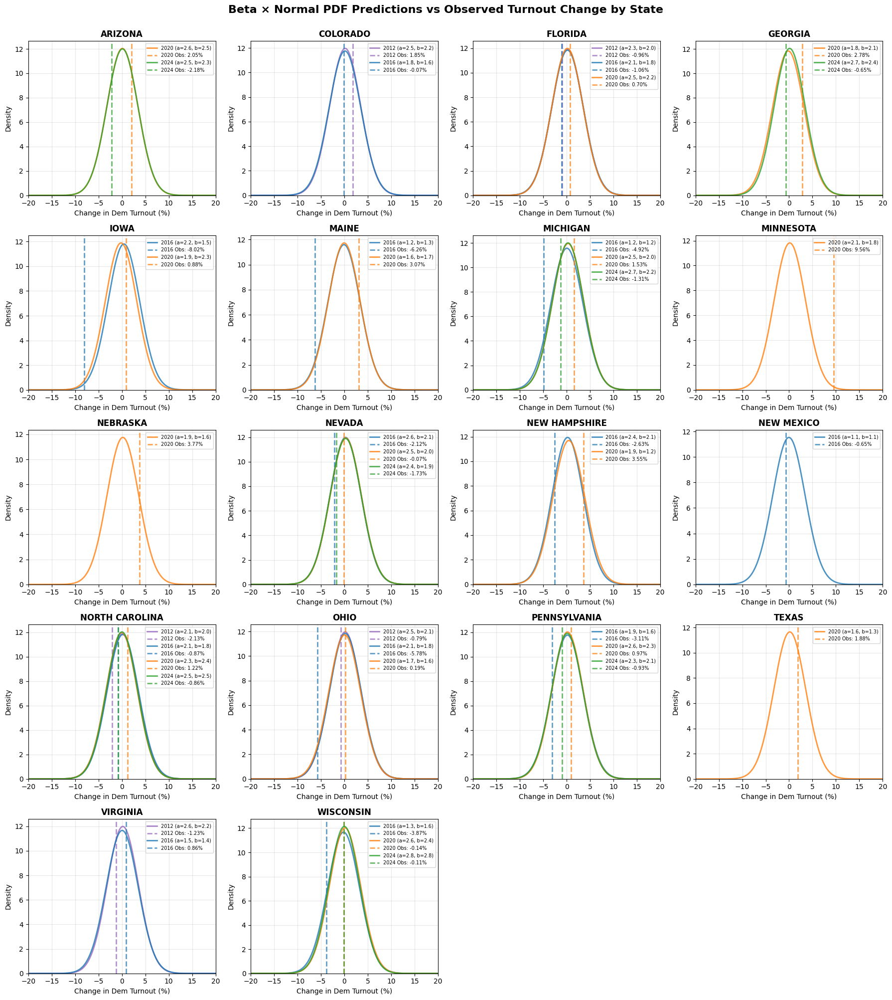


State-Year Summary:
             State  year  D-ad-spending  R-ad-spending  D_spending_norm  R_spending_norm         a         b  Turnout_Change
0          ARIZONA  2020           82.0           58.0        24.596343        17.397413  2.621225  2.456105          0.0205
1          ARIZONA  2024           91.0           61.0        19.755608        13.242770  2.516408  2.328125         -0.0218
2         COLORADO  2012           46.0           23.0        18.340957         9.170478  2.481112  2.159745          0.0185
3         COLORADO  2016           11.0            6.0         4.328401         2.360946  1.836526  1.606111         -0.0007
4          FLORIDA  2012          111.0           56.0        13.212394         6.665712  2.327057  2.018379         -0.0096
5          FLORIDA  2016           77.0           38.0         8.440335         4.165360  2.122496  1.820987         -0.0106
6          FLORIDA  2020          220.0          121.0        20.062420        11.034331  2.523745  2.24

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta, norm

# Load the combined data with all years
ad_df = pd.read_csv('ad_data.csv')
county_df = pd.read_csv('countypres_2000-2024.csv')

# Get state-level vote counts
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()
state_votes['total_partisan'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']

# Standardize state names
state_votes['state'] = state_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# Merge to get population data
state_data = ad_df.merge(
    state_votes[['year', 'state', 'total_partisan']], 
    left_on=['year', 'State'], 
    right_on=['year', 'state'],
    how='left'
)

# Get unique state-year combinations
state_years = state_data[['State', 'year', 'D-ad-spending', 'R-ad-spending',
                          'Turnout (D)', 'Prior-Turnout (D)', 'total_partisan']].drop_duplicates()
state_years = state_years.sort_values(['State', 'year']).reset_index(drop=True)

# Calculate normalized spending ($ per voter)
state_years['D_spending_norm'] = state_years['D-ad-spending'] * 1e6 / state_years['total_partisan']
state_years['R_spending_norm'] = state_years['R-ad-spending'] * 1e6 / state_years['total_partisan']

# Use optimized parameters from previous fit
# (These would be stored from your previous optimization)
theta_D_opt = 0.5  # Replace with actual optimized value
theta_R_opt = 0.5  # Replace with actual optimized value
sigma_opt = 0.0347  # Replace with actual optimized value

# Calculate a and b for each state-year
state_years['a'] = 1 + theta_D_opt * np.log(state_years['D_spending_norm'] + 1)
state_years['b'] = 1 + theta_R_opt * np.log(state_years['R_spending_norm'] + 1)

# Turnout change (decimal)
state_years['Turnout_Change'] = (state_years['Turnout (D)'] - state_years['Prior-Turnout (D)']) / 100

# Remove rows with NaN turnout changes (typically the first year for each state)
state_years = state_years.dropna(subset=['Turnout_Change'])

# State list
unique_states = sorted(state_years['State'].unique())

# Setup subplots
n_states = len(unique_states)
n_cols = 4
n_rows = (n_states + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4 * n_rows))
axes = axes.flatten()

# Turnout-change domain
x_range = np.linspace(-0.2, 0.2, 500)

# Beta-transform
x_transformed = (x_range + 0.2) / 0.4

# Colors for each year
year_colors = {2012: '#9467bd', 2016: '#1f77b4', 2020: '#ff7f0e', 2024: '#2ca02c'}

for idx, state in enumerate(unique_states):
    ax = axes[idx]
    state_entries = state_years[state_years['State'] == state]
    
    for _, row in state_entries.iterrows():
        a_val = row['a']
        b_val = row['b']
        turnout_change = row['Turnout_Change']
        year = int(row['year'])
        color = year_colors.get(year, 'gray')
        
        # Beta PDF evaluated on transformed domain
        pdf_beta = beta.pdf(x_transformed, a_val, b_val)
        
        # Apply Jacobian: dy/dx = 1 / 0.4 = 2.5
        pdf_beta = pdf_beta / 0.4
        
        # Normal PDF on original domain
        pdf_norm = norm.pdf(x_range, 0, sigma_opt)
        
        # Combined PDF: Beta × Normal (product of densities)
        # Note: This isn't normalized, but shows relative probabilities
        pdf_combined = pdf_beta * pdf_norm
        # Normalize for visualization
        pdf_combined = pdf_combined / (np.sum(pdf_combined) * (x_range[1] - x_range[0]))
        
        # Plot combined PDF
        ax.plot(x_range * 100, pdf_combined,
                linewidth=2, color=color,
                label=f'{year} (a={a_val:.1f}, b={b_val:.1f})',
                alpha=0.8)
        
        # Observed turnout-change line
        ax.axvline(x=turnout_change * 100,
                   linestyle='--', linewidth=2,
                   alpha=0.7, color=color,
                   label=f'{year} Obs: {turnout_change*100:.2f}%')
    
    ax.set_xlim(-20, 20)
    ax.set_ylim(bottom=0)
    ax.set_xlabel('Change in Dem Turnout (%)', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title(f'{state}', fontsize=12, fontweight='bold')
    ax.legend(fontsize=7, loc='upper right')
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(n_states, len(axes)):
    axes[idx].axis('off')

plt.suptitle('Beta × Normal PDF Predictions vs Observed Turnout Change by State',
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

# Summary table
print("\nState-Year Summary:")
print(state_years[['State', 'year', 'D-ad-spending', 'R-ad-spending', 
                   'D_spending_norm', 'R_spending_norm', 'a', 'b', 'Turnout_Change']].to_string())

Number of observations: 40
Turnout change range: [-0.0802, 0.0956]
Normalized D spending range: [0.14, 38.03] $/voter
Normalized R spending range: [0.28, 38.03] $/voter

OPTIMIZED PARAMETERS

Democratic parameter:
  a(D) = 1 + 10.0000 * ln(D_$/voter + 1)

Republican parameter:
  b(R) = 1 + 5.2645 * ln(R_$/voter + 1)

Skewed-normal variance (scale parameter):
  σ = 0.0268

Skew parameter (alpha):
  alpha = -0.3641

Beta weight (w):
  w = 0.0332  (0=all SkewNorm, 1=all Beta)

Final negative log-likelihood: -85.3036
Optimization success: True


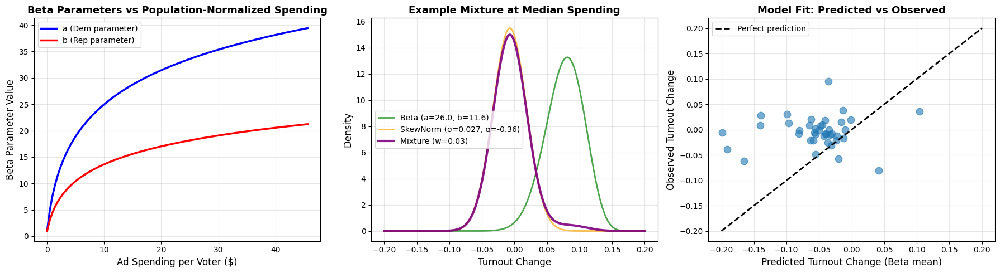

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta, skewnorm
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# Get state-level vote counts by year
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()

state_votes['total_partisan'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']

# Prepare for merge - standardize state names to uppercase
state_votes['state'] = state_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# Merge ad spending with voter counts
combined_data = ad_df.merge(
    state_votes[['year', 'state', 'total_partisan']], 
    left_on=['year', 'State'], 
    right_on=['year', 'state'],
    how='inner'
)

# Calculate turnout change
combined_data['turnout_change'] = (combined_data['Turnout (D)'] - combined_data['Prior-Turnout (D)']) / 100

# Remove rows with missing data
combined_data = combined_data.dropna(subset=['D-ad-spending', 'R-ad-spending', 'turnout_change', 'total_partisan'])

# Extract arrays
D_spending = combined_data['D-ad-spending'].values
R_spending = combined_data['R-ad-spending'].values
turnout_change = combined_data['turnout_change'].values
total_partisan = combined_data['total_partisan'].values

# Normalize spending by population ($ per voter)
D_spending_norm = D_spending * 1e6 / total_partisan  # millions to dollars, then per capita
R_spending_norm = R_spending * 1e6 / total_partisan

print(f"Number of observations: {len(D_spending)}")
print(f"Turnout change range: [{np.min(turnout_change):.4f}, {np.max(turnout_change):.4f}]")
print(f"Normalized D spending range: [{np.min(D_spending_norm):.2f}, {np.max(D_spending_norm):.2f}] $/voter")
print(f"Normalized R spending range: [{np.min(R_spending_norm):.2f}, {np.max(R_spending_norm):.2f}] $/voter")

# From previous analysis: Normal distribution baseline
sigma_baseline = 0.0347

# Transform turnout change from [-0.2, 0.2] to [0, 1] for Beta
lower, upper = -0.2, 0.2
transformed_data = (turnout_change - lower) / (upper - lower)
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

# Model update: 
# Beta as before, but now use a skewed normal (skewnorm) instead of the normal for the other component.
# Params: a = 1 + theta_D * log(D_spending_norm + 1)
#         b = 1 + theta_R * log(R_spending_norm + 1)
#         PDF = w * Beta(x | a, b) + (1-w) * SkewNorm(x | skew, loc, scale)
# New parameters: skew angle (alpha), location (should be zero), and sigma

def compute_a(D_norm, theta_D):
    return 1 + theta_D * np.log(D_norm + 1)

def compute_b(R_norm, theta_R):
    return 1 + theta_R * np.log(R_norm + 1)

# Likelihood function
def neg_log_likelihood(params):
    theta_D, theta_R, sigma, w, alpha = params
    
    if theta_D < 0 or theta_R < 0 or sigma <= 0 or w < 0 or w > 1:
        return 1e12
    
    a_vals = compute_a(D_spending_norm, theta_D)
    b_vals = compute_b(R_spending_norm, theta_R)
    
    if np.any(a_vals <= 0) or np.any(b_vals <= 0):
        return 1e12

    # Convert transformed_data back to original scale for skewed normal
    turnout_original = transformed_data * (upper - lower) + lower

    # Beta PDF on transformed scale, jacobian to rescale
    pdf_beta = beta.pdf(transformed_data, a_vals, b_vals)
    pdf_beta_original = pdf_beta / (upper - lower)
    
    # Skewed normal PDF on original scale; loc=0, scale=sigma
    pdf_skewnorm = skewnorm.pdf(turnout_original, alpha, loc=0, scale=sigma)
    
    # Weighted mixture
    pdf_mixture = w * pdf_beta_original + (1 - w) * pdf_skewnorm

    # Avoid log(0)
    pdf_mixture = np.maximum(pdf_mixture, 1e-300)
    
    # Log-likelihood
    ll_total = np.sum(np.log(pdf_mixture))
    
    return -ll_total

# Initial guess: theta_D, theta_R, sigma, w, alpha(skewness)
initial_params = [0.5, 0.5, sigma_baseline, 0.5, 0.0]

# Bounds: allow a modest range for skew
bounds = [
    (0, 10),      # theta_D
    (0, 10),      # theta_R  
    (1e-4, 0.5),  # sigma
    (0, 1),     # w (beta weight)
    (-10, 10)     # alpha (skewness)
]

# Optimize
result = minimize(neg_log_likelihood, initial_params, bounds=bounds, method='L-BFGS-B')

theta_D_opt, theta_R_opt, sigma_opt, w_opt, alpha_opt = result.x

print("\n" + "="*60)
print("OPTIMIZED PARAMETERS")
print("="*60)
print(f"\nDemocratic parameter:")
print(f"  a(D) = 1 + {theta_D_opt:.4f} * ln(D_$/voter + 1)")
print(f"\nRepublican parameter:")
print(f"  b(R) = 1 + {theta_R_opt:.4f} * ln(R_$/voter + 1)")
print(f"\nSkewed-normal variance (scale parameter):")
print(f"  σ = {sigma_opt:.4f}")
print(f"\nSkew parameter (alpha):")
print(f"  alpha = {alpha_opt:.4f}")
print(f"\nBeta weight (w):")
print(f"  w = {w_opt:.4f}  (0=all SkewNorm, 1=all Beta)")
print(f"\nFinal negative log-likelihood: {result.fun:.4f}")
print(f"Optimization success: {result.success}")

# Visualize the fit
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Spending effect on parameters
D_norm_range = np.linspace(0, np.max(D_spending_norm) * 1.2, 100)
R_norm_range = np.linspace(0, np.max(R_spending_norm) * 1.2, 100)

a_range = compute_a(D_norm_range, theta_D_opt)
b_range = compute_b(R_norm_range, theta_R_opt)

# Plot 1: Parameters vs normalized spending
axes[0].plot(D_norm_range, a_range, 'b-', lw=2.5, label='a (Dem parameter)')
axes[0].plot(R_norm_range, b_range, 'r-', lw=2.5, label='b (Rep parameter)')
axes[0].set_xlabel('Ad Spending per Voter ($)', fontsize=12)
axes[0].set_ylabel('Beta Parameter Value', fontsize=12)
axes[0].set_title('Beta Parameters vs Population-Normalized Spending', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Example mixture distribution
x_plot = np.linspace(-0.2, 0.2, 500)
x_transformed_plot = (x_plot + 0.2) / 0.4

# Use median spending values
med_D = np.median(D_spending_norm)
med_R = np.median(R_spending_norm)
a_med = compute_a(med_D, theta_D_opt)
b_med = compute_b(med_R, theta_R_opt)

pdf_beta_plot = beta.pdf(x_transformed_plot, a_med, b_med) / (upper - lower)
pdf_skewnorm_plot = skewnorm.pdf(x_plot, alpha_opt, loc=0, scale=sigma_opt)
pdf_mixture_plot = w_opt * pdf_beta_plot + (1 - w_opt) * pdf_skewnorm_plot

axes[1].plot(x_plot, pdf_beta_plot, 'g-', lw=2, label=f'Beta (a={a_med:.1f}, b={b_med:.1f})', alpha=0.7)
axes[1].plot(x_plot, pdf_skewnorm_plot, 'orange', lw=2, label=f'SkewNorm (σ={sigma_opt:.3f}, α={alpha_opt:.2f})', alpha=0.7)
axes[1].plot(x_plot, pdf_mixture_plot, 'purple', lw=3, label=f'Mixture (w={w_opt:.2f})', alpha=0.9)
axes[1].set_xlabel('Turnout Change', fontsize=12)
axes[1].set_ylabel('Density', fontsize=12)
axes[1].set_title('Example Mixture at Median Spending', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# Plot 3: Fitted vs observed
predicted_mean = (compute_a(D_spending_norm, theta_D_opt) - compute_b(R_spending_norm, theta_R_opt)) / \
                 (compute_a(D_spending_norm, theta_D_opt) + compute_b(R_spending_norm, theta_R_opt))
predicted_mean = predicted_mean * (upper - lower) + lower

axes[2].scatter(predicted_mean, turnout_change, alpha=0.6, s=80)
axes[2].plot([-0.2, 0.2], [-0.2, 0.2], 'k--', lw=2, label='Perfect prediction')
axes[2].set_xlabel('Predicted Turnout Change (Beta mean)', fontsize=12)
axes[2].set_ylabel('Observed Turnout Change', fontsize=12)
axes[2].set_title('Model Fit: Predicted vs Observed', fontsize=13, fontweight='bold')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

**WTF??? THE SKEW MAKES IT WORSE**

edit: NVM

edit for the edit: NOOOOOO it just said ad spending does nothin

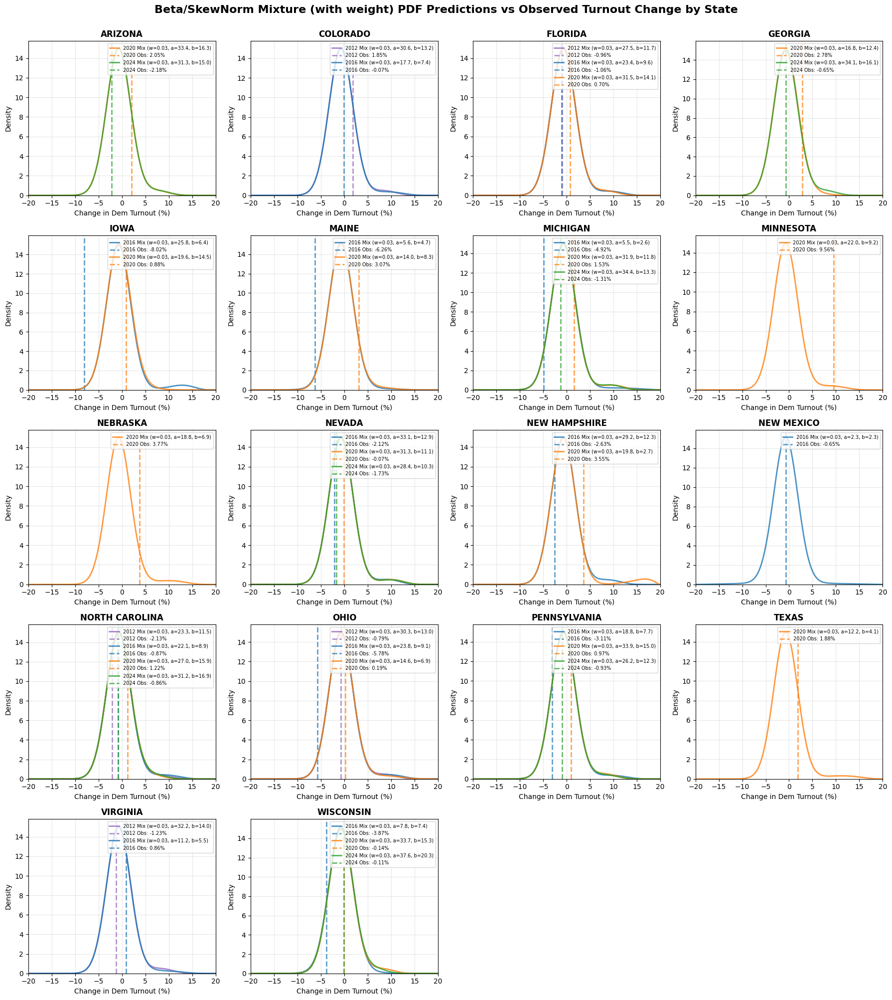


State-Year Summary:
             State  year  D-ad-spending  R-ad-spending  D_spending_norm  R_spending_norm          a          b  Turnout_Change     w_opt
0          FLORIDA  2012          111.0           56.0        13.212394         6.665712  27.541144  11.722475         -0.0096  0.033209
1             OHIO  2012           97.0           48.0        17.671617         8.744718  30.270046  12.985783         -0.0079  0.033209
2         VIRGINIA  2012           82.0           41.0        21.611125        10.805563  32.184421  13.995750         -0.0123  0.033209
3         COLORADO  2012           46.0           23.0        18.340957         9.170478  30.622250  13.210912          0.0185  0.033209
4   NORTH CAROLINA  2012           37.0           28.0         8.316876         6.293852  23.318273  11.460696         -0.0213  0.033209
5          FLORIDA  2016           77.0           38.0         8.440335         4.165360  23.449914   9.644149         -0.0106  0.033209
6             OHIO  

In [33]:
# Plot per-state, per-year Mixture PDF predictions using fitted parameters (includes weight parameter)
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta, skewnorm

# Uses parameters from the main cell:
# theta_D_opt, theta_R_opt, sigma_opt, alpha_opt, w_opt, etc.

# We'll use the arrays already constructed:
# - combined_data: each row is a state-year, with all necessary fields (already cleaned)
# - D_spending_norm, R_spending_norm: vector of per-capita spending per row
# - turnout_change: observed value per row

state_years = combined_data.copy()
state_years['D_spending_norm'] = D_spending_norm
state_years['R_spending_norm'] = R_spending_norm
state_years['a'] = 1 + theta_D_opt * np.log(state_years['D_spending_norm'] + 1)
state_years['b'] = 1 + theta_R_opt * np.log(state_years['R_spending_norm'] + 1)
state_years['Turnout_Change'] = turnout_change

# Remove rows with NaN turnout changes
state_years = state_years.dropna(subset=['Turnout_Change'])

unique_states = sorted(state_years['State'].unique())
n_states = len(unique_states)
n_cols = 4
n_rows = (n_states + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4 * n_rows))
axes = axes.flatten()

x_range = np.linspace(-0.2, 0.2, 500)
x_transformed = (x_range + 0.2) / 0.4   # for Beta PDF
year_colors = {2012: '#9467bd', 2016: '#1f77b4', 2020: '#ff7f0e', 2024: '#2ca02c'}

for idx, state in enumerate(unique_states):
    ax = axes[idx]
    entries = state_years[state_years['State'] == state]
    for _, row in entries.iterrows():
        a_val = row['a']
        b_val = row['b']
        turnout_chg = row['Turnout_Change']
        year = int(row['year'])
        color = year_colors.get(year, 'gray')

        # Beta PDF with Jacobian for correct y-scaling
        pdf_beta = beta.pdf(x_transformed, a_val, b_val) / 0.4
        # Skewnorm PDF (with w_opt from fit, loc=0, scale=sigma_opt, alpha_opt also from fit)
        pdf_skewnorm = skewnorm.pdf(x_range, alpha_opt, loc=0, scale=sigma_opt)
        # Mixture PDF using weight parameter
        pdf_mixture = w_opt * pdf_beta + (1 - w_opt) * pdf_skewnorm

        # Plot Mixture PDF with weight in label
        ax.plot(x_range * 100, pdf_mixture,
                linewidth=2, color=color,
                label=f"{year} Mix (w={w_opt:.2f}, a={a_val:.1f}, b={b_val:.1f})",
                alpha=0.8)

        # Show observed turnout change
        ax.axvline(x=turnout_chg * 100, linestyle='--', linewidth=2,
                   alpha=0.7, color=color,
                   label=f"{year} Obs: {turnout_chg*100:.2f}%")

    ax.set_xlim(-20, 20)
    ax.set_ylim(bottom=0)
    ax.set_xlabel('Change in Dem Turnout (%)', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title(f'{state}', fontsize=12, fontweight='bold')
    ax.legend(fontsize=7, loc='upper right')
    ax.grid(True, alpha=0.3)

# Hide unused axes
for idx in range(n_states, len(axes)):
    axes[idx].axis('off')

plt.suptitle('Beta/SkewNorm Mixture (with weight) PDF Predictions vs Observed Turnout Change by State',
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

# Summary table (add weight column as reminder it's used, even though value is global)
state_years['w_opt'] = w_opt
print("\nState-Year Summary:")
print(state_years[['State', 'year', 'D-ad-spending', 'R-ad-spending', 
                   'D_spending_norm', 'R_spending_norm', 'a', 'b', 'Turnout_Change', 'w_opt']].to_string())

Oh gosh this is a disaster

## Embracing Heresy, throwing out the Normal PDF

Number of observations: 40
Turnout change range: [-0.0802, 0.0956]
D spending range: [0.10, 220.00] million
R spending range: [0.20, 128.00] million
Population range: [693,328, 13,932,700] voters
Transformed data range: [0.2995, 0.7390]

FITTING POPULATION-SCALED MODEL

OPTIMIZED PARAMETERS

Democratic parameter (a):
  a = 12.5000 + (1/population) * [1.00e+06*D + 1.00e+06*ln(D+1)]

Republican parameter (b):
  b = 12.5000 + (1/population) * [1.00e+06*R + 1.00e+06*ln(R+1)]

Final negative log-likelihood: -18.3744
Optimization success: True

PARAMETER RANGES
a ranges from 12.78 to 51.97
b ranges from 13.04 to 51.97

This is a 39.2 point range for a
and a 38.9 point range for b


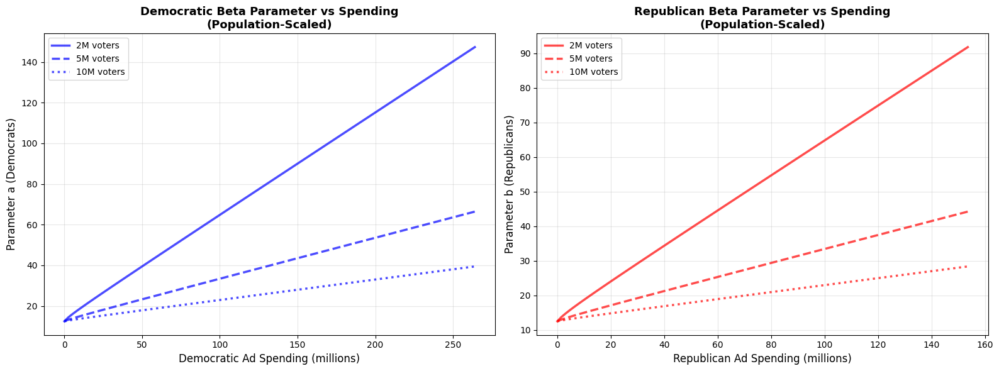

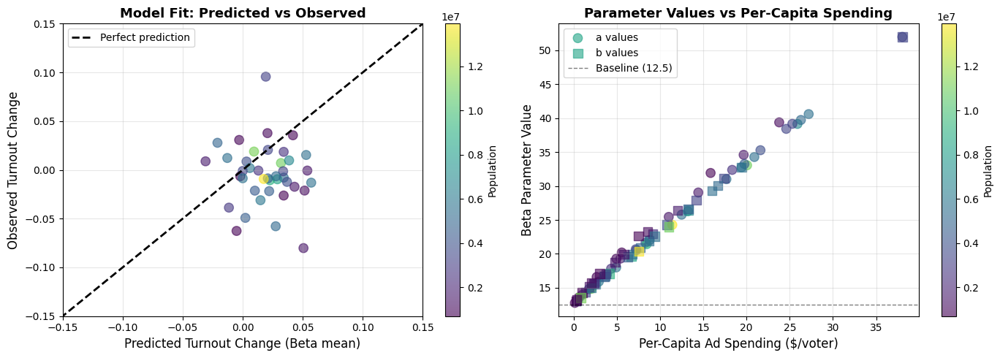

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# Get state-level vote counts by year (only DEMOCRAT and REPUBLICAN)
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()
state_votes['total_partisan'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']

# Standardize state names for merge
state_votes['state'] = state_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# Merge on year, state to get population
combined_data = ad_df.merge(
    state_votes[['year', 'state', 'total_partisan']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='inner'
)

# Calculate turnout change (already in [-0.2, 0.2])
combined_data['turnout_change'] = (combined_data['Turnout (D)'] - combined_data['Prior-Turnout (D)']) / 100

# Remove rows with missing data
combined_data = combined_data.dropna(subset=['D-ad-spending', 'R-ad-spending', 'turnout_change', 'total_partisan'])

# Extract arrays just like @file_context_0
D_spending = combined_data['D-ad-spending'].values
R_spending = combined_data['R-ad-spending'].values
turnout_change = combined_data['turnout_change'].values
total_partisan = combined_data['total_partisan'].values

# Just use turnout_change as observed, in [-0.2, 0.2]
print(f"Number of observations: {len(D_spending)}")
print(f"Turnout change range: [{np.min(turnout_change):.4f}, {np.max(turnout_change):.4f}]")
print(f"D spending range: [{np.min(D_spending):.2f}, {np.max(D_spending):.2f}] million")
print(f"R spending range: [{np.min(R_spending):.2f}, {np.max(R_spending):.2f}] million")
print(f"Population range: [{np.min(total_partisan):,.0f}, {np.max(total_partisan):,.0f}] voters")

# Transform turnout_change to [0, 1] for Beta only internally (for likelihood etc)
lower, upper = -0.2, 0.2
transformed_data = (turnout_change - lower) / (upper - lower)
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

print(f"Transformed data range: [{np.min(transformed_data):.4f}, {np.max(transformed_data):.4f}]")

# Population-scaled Beta parameter model as in @file_context_0
def g(D, a1, a2):
    # Function of raw spending (millions) for Democrats
    return a1 * D + a2 * np.log(D + 1)

def h(R, b1, b2):
    # Function of raw spending (millions) for Republicans
    return b1 * R + b2 * np.log(R + 1)

# Fixed baseline
a0_fixed = 12.5
b0_fixed = 12.5

def neg_log_likelihood_population_scaled(params):
    # params: a1, a2, b1, b2
    a1, a2, b1, b2 = params
    # ensure positiveness
    if a1 < 0 or a2 < 0 or b1 < 0 or b2 < 0:
        return 1e12
    a_vals = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1, a2)
    b_vals = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1, b2)
    if np.any(a_vals <= 0) or np.any(b_vals <= 0):
        return 1e12
    ll = np.sum(beta.logpdf(transformed_data, a_vals, b_vals))
    return -ll

# Initial guess
initial_params = [1e6, 1e6, 1e6, 1e6]
bounds = [
    (0, 1e8),   # a1: linear term for D spending
    (0, 1e8),   # a2: log term for D spending
    (0, 1e8),   # b1: linear term for R spending
    (0, 1e8),   # b2: log term for R spending
]

print("\n" + "="*60)
print("FITTING POPULATION-SCALED MODEL")
print("="*60)

result = minimize(neg_log_likelihood_population_scaled, initial_params, bounds=bounds, method='L-BFGS-B')

a1_opt, a2_opt, b1_opt, b2_opt = result.x
a0_opt = a0_fixed
b0_opt = b0_fixed

print("\n" + "="*60)
print("OPTIMIZED PARAMETERS")
print("="*60)
print(f"\nDemocratic parameter (a):")
print(f"  a = {a0_opt:.4f} + (1/population) * [{a1_opt:.2e}*D + {a2_opt:.2e}*ln(D+1)]")
print(f"\nRepublican parameter (b):")
print(f"  b = {b0_opt:.4f} + (1/population) * [{b1_opt:.2e}*R + {b2_opt:.2e}*ln(R+1)]")
print(f"\nFinal negative log-likelihood: {result.fun:.4f}")
print(f"Optimization success: {result.success}")

# Fitted parameter values for observed states
a_fitted = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1_opt, a2_opt)
b_fitted = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1_opt, b2_opt)

print("\n" + "="*60)
print("PARAMETER RANGES")
print("="*60)
print(f"a ranges from {a_fitted.min():.2f} to {a_fitted.max():.2f}")
print(f"b ranges from {b_fitted.min():.2f} to {b_fitted.max():.2f}")
print(f"\nThis is a {a_fitted.max() - a_fitted.min():.1f} point range for a")
print(f"and a {b_fitted.max() - b_fitted.min():.1f} point range for b")

# Visualize the fit for different population sizes like in the original context
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

pop_small = 2e6
pop_medium = 5e6
pop_large = 10e6

D_range = np.linspace(0, np.max(D_spending) * 1.2, 100)
R_range = np.linspace(0, np.max(R_spending) * 1.2, 100)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    a_curve = a0_opt + (1.0 / pop) * g(D_range, a1_opt, a2_opt)
    axes[0].plot(D_range, a_curve, 'b' + style, lw=2.5, label=label, alpha=0.7)
axes[0].set_xlabel('Democratic Ad Spending (millions)', fontsize=12)
axes[0].set_ylabel('Parameter a (Democrats)', fontsize=12)
axes[0].set_title('Democratic Beta Parameter vs Spending\n(Population-Scaled)', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    b_curve = b0_opt + (1.0 / pop) * h(R_range, b1_opt, b2_opt)
    axes[1].plot(R_range, b_curve, 'r' + style, lw=2.5, label=label, alpha=0.7)
axes[1].set_xlabel('Republican Ad Spending (millions)', fontsize=12)
axes[1].set_ylabel('Parameter b (Republicans)', fontsize=12)
axes[1].set_title('Republican Beta Parameter vs Spending\n(Population-Scaled)', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Diagnostic plots: fit vs observed and per-capita spending vs a/b
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Compute predicted mean in the [-0.2, 0.2] range (original units)
predicted_mean_transformed = a_fitted / (a_fitted + b_fitted)
predicted_mean = predicted_mean_transformed * (upper - lower) + lower

axes[0].scatter(predicted_mean, turnout_change, alpha=0.6, s=80, c=total_partisan, cmap='viridis')
axes[0].plot([-0.2, 0.2], [-0.2, 0.2], 'k--', lw=2, label='Perfect prediction')
axes[0].set_xlabel('Predicted Turnout Change (Beta mean)', fontsize=12)
axes[0].set_ylabel('Observed Turnout Change', fontsize=12)
axes[0].set_title('Model Fit: Predicted vs Observed', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)
axes[0].set_xlim(-0.15, 0.15)
axes[0].set_ylim(-0.15, 0.15)
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label('Population', fontsize=10)

D_per_capita = D_spending * 1e6 / total_partisan
R_per_capita = R_spending * 1e6 / total_partisan

sc = axes[1].scatter(D_per_capita, a_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', label='a values')
axes[1].scatter(R_per_capita, b_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', marker='s', label='b values')
axes[1].axhline(y=12.5, color='k', linestyle='--', lw=1, alpha=0.5, label='Baseline (12.5)')
axes[1].set_xlabel('Per-Capita Ad Spending ($/voter)', fontsize=12)
axes[1].set_ylabel('Beta Parameter Value', fontsize=12)
axes[1].set_title('Parameter Values vs Per-Capita Spending', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)
cbar1 = plt.colorbar(sc, ax=axes[1])
cbar1.set_label('Population', fontsize=10)

plt.tight_layout()
plt.show()

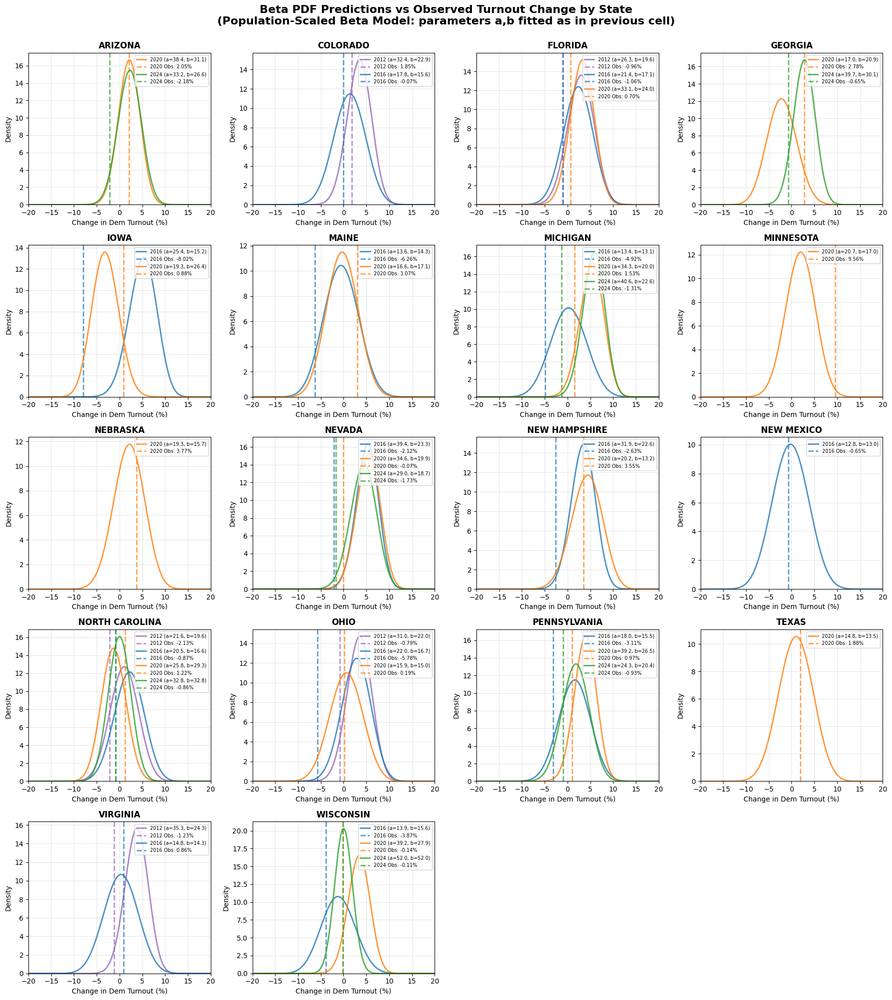


State-Year Summary:
             State  year  D-ad-spending  R-ad-spending  total_partisan          a          b  Turnout_Change
0          ARIZONA  2020           82.0           58.0         3333829  38.421798  31.120492          0.0205
1          ARIZONA  2024           91.0           61.0         4606287  33.237264  26.638749         -0.0218
2         COLORADO  2012           46.0           23.0         2508048  32.376074  22.937621          0.0185
3         COLORADO  2016           11.0            6.0         2541354  17.806190  15.626644         -0.0007
4          FLORIDA  2012          111.0           56.0         8401203  26.274039  19.646959         -0.0096
5          FLORIDA  2016           77.0           38.0         9122861  21.417894  17.066940         -0.0106
6          FLORIDA  2020          220.0          121.0        10965776  33.054693  23.972423          0.0070
7          GEORGIA  2020           19.0           38.0         4936344  16.955875  20.940166          0.027

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta

# === Model from file_context_0 ===
# a = a0_fixed + (1.0 / population) * g(D, a1, a2)
# b = b0_fixed + (1.0 / population) * h(R, b1, b2)
# g(D, a1, a2) = a1 * D + a2 * np.log(D + 1)
# h(R, b1, b2) = b1 * R + b2 * np.log(R + 1)
a0_opt = 12.5
b0_opt = 12.5

# Replace these with actual optimized values (from your previous cell)
a1_opt = 1e6   # <-- Replace with your optimized a1
a2_opt = 1e6   # <-- Replace with your optimized a2
b1_opt = 1e6   # <-- Replace with your optimized b1
b2_opt = 1e6   # <-- Replace with your optimized b2

# --- Load data ---
ad_df = pd.read_csv('ad_data.csv')
county_df = pd.read_csv('countypres_2000-2024.csv')

# State-level vote counts for each year ('DEMOCRAT'/'REPUBLICAN' only)
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()
state_votes['total_partisan'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']

# Standardize names
state_votes['state'] = state_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# Merge to get population (total_partisan)
state_data = ad_df.merge(
    state_votes[['year', 'state', 'total_partisan']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='left'
)

# One row per state-year, keep necessary variables
state_years = state_data[['State', 'year', 'D-ad-spending', 'R-ad-spending',
                          'Turnout (D)', 'Prior-Turnout (D)', 'total_partisan']].drop_duplicates()
state_years = state_years.sort_values(['State', 'year']).reset_index(drop=True)

# Compute a and b using the population-scaled model from @file_context_0
def g(D, a1, a2):
    return a1 * D + a2 * np.log(D + 1)

def h(R, b1, b2):
    return b1 * R + b2 * np.log(R + 1)

# Safe numeric conversion (from millions to millions, already in ad_df)
D = state_years['D-ad-spending'].astype(float).values
R = state_years['R-ad-spending'].astype(float).values
population = state_years['total_partisan'].astype(float).values

# Compute a and b for each state-year using the format from @file_context_0
state_years['a'] = a0_opt + (1.0 / population) * g(D, a1_opt, a2_opt)
state_years['b'] = b0_opt + (1.0 / population) * h(R, b1_opt, b2_opt)

# Turnout change in [-0.2, 0.2] (decimal)
state_years['Turnout_Change'] = (state_years['Turnout (D)'] - state_years['Prior-Turnout (D)']) / 100

# Remove rows with NaN turnout changes (e.g., missing Prior-Turnout)
state_years = state_years.dropna(subset=['Turnout_Change', 'a', 'b'])

# State list for plotting
unique_states = sorted(state_years['State'].unique())

n_states = len(unique_states)
n_cols = 4
n_rows = (n_states + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4 * n_rows))
axes = axes.flatten()

x_range = np.linspace(-0.2, 0.2, 500)
x_transformed = (x_range + 0.2) / 0.4

# Colors by year
year_colors = {2012: '#9467bd', 2016: '#1f77b4', 2020: '#ff7f0e', 2024: '#2ca02c'}

for idx, state in enumerate(unique_states):
    ax = axes[idx]
    state_entries = state_years[state_years['State'] == state]
    
    for _, row in state_entries.iterrows():
        a_val = row['a']
        b_val = row['b']
        turnout_change = row['Turnout_Change']
        year = int(row['year'])
        color = year_colors.get(year, 'gray')
        
        pdf_vals = beta.pdf(x_transformed, a_val, b_val)
        pdf_vals = pdf_vals / 0.4  # dy/dx for scaling to correct domain
        
        # Plot Beta PDF (predicted)
        ax.plot(x_range * 100, pdf_vals,
                linewidth=2, color=color,
                label=f'{year} (a={a_val:.1f}, b={b_val:.1f})',
                alpha=0.8)
        
        # Overlay observed turnout-change
        ax.axvline(x=turnout_change * 100,
                   linestyle='--', linewidth=2,
                   alpha=0.7, color=color,
                   label=f'{year} Obs: {turnout_change*100:.2f}%')
        
    ax.set_xlim(-20, 20)
    ax.set_ylim(bottom=0)
    ax.set_xlabel('Change in Dem Turnout (%)', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title(f'{state}', fontsize=12, fontweight='bold')
    ax.legend(fontsize=7, loc='upper right')
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(n_states, len(axes)):
    axes[idx].axis('off')

plt.suptitle(
    'Beta PDF Predictions vs Observed Turnout Change by State\n'
    '(Population-Scaled Beta Model: parameters a,b fitted as in previous cell)',
    fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

# Also print a summary table including a, b, population and input spending
print("\nState-Year Summary:")
print(state_years[['State', 'year', 'D-ad-spending', 'R-ad-spending', 'total_partisan', 
                   'a', 'b', 'Turnout_Change']].to_string())

Fantastic! Let's play with the basis now

The below cell contains my best model pre-outlier filtering

Number of observations: 40
Turnout change range: [-0.0802, 0.0956]
D spending range: [0.10, 220.00] million
R spending range: [0.20, 128.00] million
Population range: [693,328, 13,932,700] voters
Transformed data range: [0.2995, 0.7390]

FITTING POPULATION-SCALED MODEL (WIDE SUPPORT & QUADRATIC)

OPTIMIZED PARAMETERS

Democratic parameter (a):
  a = 12.5000 + (1/population) * [4.94e+05*D + 1.08e+06*ln(D+1) + 1.58e+03*D^2]

Republican parameter (b):
  b = 12.5000 + (1/population) * [1.17e+06*R + 9.72e+05*ln(R+1) + 0.00e+00*R^2]

Final negative log-likelihood: -36.6487
Optimization success: True

PARAMETER RANGES
a ranges from 12.72 to 40.55
b ranges from 13.08 to 58.34

This is a 27.8 point range for a
and a 45.3 point range for b


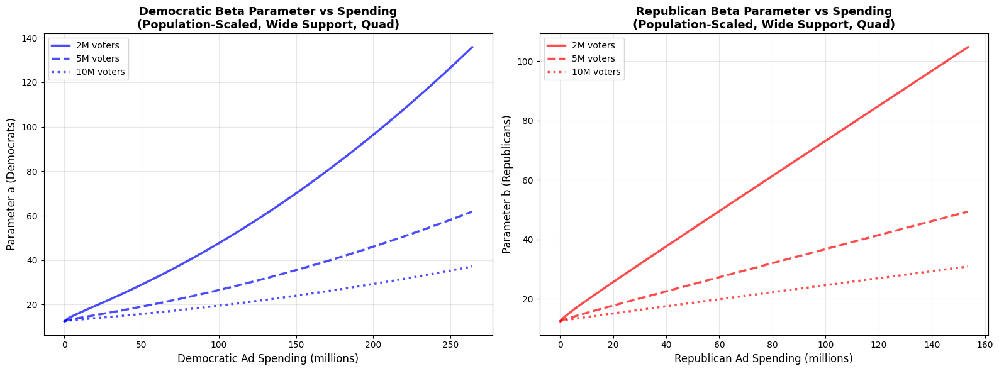

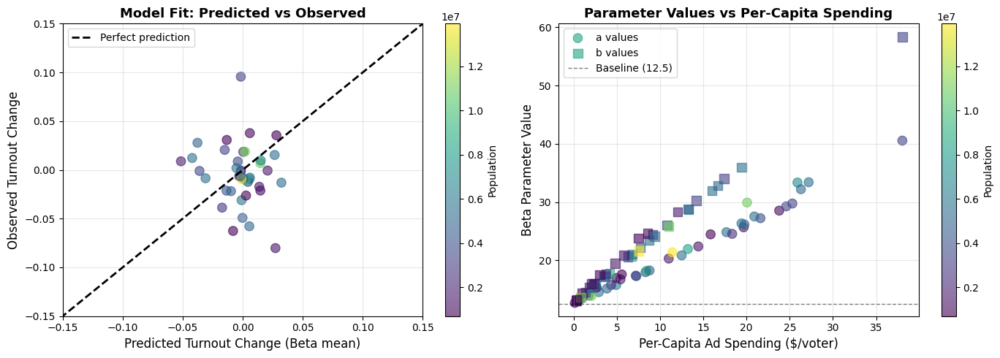

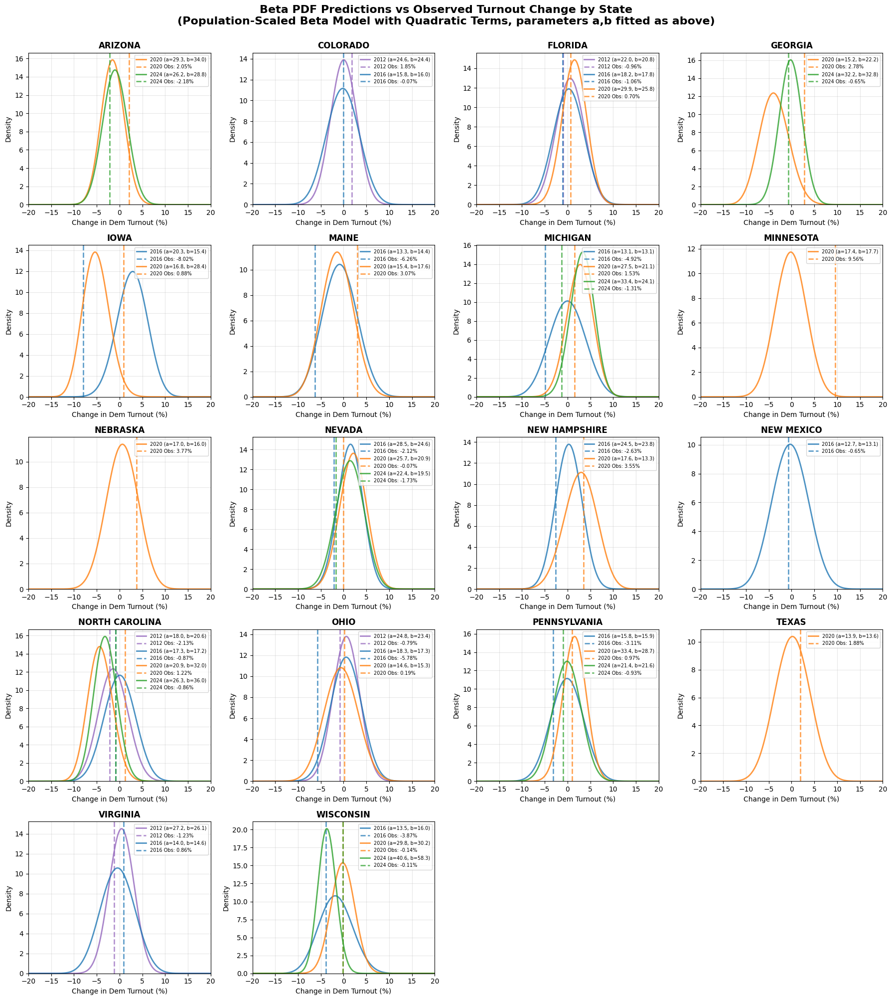


State-Year Summary:
             State  year  D-ad-spending  R-ad-spending  total_partisan          a          b  Turnout_Change
0          ARIZONA  2020           82.0           58.0         3333829  29.277370  34.018897          0.0205
1          ARIZONA  2024           91.0           61.0         4606287  26.166982  28.845954         -0.0218
2         COLORADO  2012           46.0           23.0         2508048  24.557065  24.448302          0.0185
3         COLORADO  2016           11.0            6.0         2541354  15.770461  16.003484         -0.0007
4          FLORIDA  2012          111.0           56.0         8401203  21.955652  20.757117         -0.0096
5          FLORIDA  2016           77.0           38.0         9122861  18.215045  17.757897         -0.0106
6          FLORIDA  2020          220.0          121.0        10965776  29.925543  25.820026          0.0070
7          GEORGIA  2020           19.0           38.0         4936344  15.173382  22.217124          0.027

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# Get state-level vote counts by year (only DEMOCRAT and REPUBLICAN)
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()
state_votes['total_partisan'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']

# Standardize state names for merge
state_votes['state'] = state_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# Merge on year, state to get population
combined_data = ad_df.merge(
    state_votes[['year', 'state', 'total_partisan']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='inner'
)

# Calculate turnout change (already in [-0.2, 0.2])
combined_data['turnout_change'] = (combined_data['Turnout (D)'] - combined_data['Prior-Turnout (D)']) / 100

# Remove rows with missing data
combined_data = combined_data.dropna(subset=['D-ad-spending', 'R-ad-spending', 'turnout_change', 'total_partisan'])

# Extract arrays just like @file_context_0
D_spending = combined_data['D-ad-spending'].values
R_spending = combined_data['R-ad-spending'].values
turnout_change = combined_data['turnout_change'].values
total_partisan = combined_data['total_partisan'].values

print(f"Number of observations: {len(D_spending)}")
print(f"Turnout change range: [{np.min(turnout_change):.4f}, {np.max(turnout_change):.4f}]")
print(f"D spending range: [{np.min(D_spending):.2f}, {np.max(D_spending):.2f}] million")
print(f"R spending range: [{np.min(R_spending):.2f}, {np.max(R_spending):.2f}] million")
print(f"Population range: [{np.min(total_partisan):,.0f}, {np.max(total_partisan):,.0f}] voters")

# Transform turnout_change to [0, 1] for Beta only internally (for likelihood etc)
lower, upper = -0.2, 0.2
transformed_data = (turnout_change - lower) / (upper - lower)
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

print(f"Transformed data range: [{np.min(transformed_data):.4f}, {np.max(transformed_data):.4f}]")

# === MODEL WITH MUCH LARGER PARAMETER SUPPORT AND QUADRATIC TERMS ===

# Population-scaled Beta parameter model with quadratic and super-wide bounds
def g(D, a1, a2, a3):
    # Function of raw spending (millions) for Democrats: linear + log + quadratic
    return a1 * D + a2 * np.log(D + 1) + a3 * D**2

def h(R, b1, b2, b3):
    # Function of raw spending (millions) for Republicans: linear + log + quadratic
    return b1 * R + b2 * np.log(R + 1) + b3 * R**2

# Fixed baseline
a0_fixed = 12.5
b0_fixed = 12.5

def neg_log_likelihood_population_scaled(params):
    # params: a1, a2, a3, b1, b2, b3
    a1, a2, a3, b1, b2, b3 = params
    # ensure positiveness for all terms (quadratic can be negative, but only penalize negatives here)
    if a1 < 0 or a2 < 0 or a3 < 0 or b1 < 0 or b2 < 0 or b3 < 0:
        return 1e12
    a_vals = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1, a2, a3)
    b_vals = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1, b2, b3)
    if np.any(a_vals <= 0) or np.any(b_vals <= 0):
        return 1e12
    ll = np.sum(beta.logpdf(transformed_data, a_vals, b_vals))
    return -ll

# Initial guess: start small but allow optimizer to go big
initial_params = [1e6, 1e6, 0.0, 1e6, 1e6, 0.0]
# Bounds: extend linear and log by 10,000x compared to previous (i.e. 1e12)
widesup = 1e12
bounds = [
    (0, widesup),   # a1: linear term for D spending
    (0, widesup),   # a2: log term for D spending
    (0, widesup),   # a3: quad term for D spending
    (0, widesup),   # b1: linear term for R spending
    (0, widesup),   # b2: log term for R spending
    (0, widesup),   # b3: quad term for R spending
]

print("\n" + "="*60)
print("FITTING POPULATION-SCALED MODEL (WIDE SUPPORT & QUADRATIC)")
print("="*60)

result = minimize(neg_log_likelihood_population_scaled, initial_params, bounds=bounds, method='L-BFGS-B')

a1_opt, a2_opt, a3_opt, b1_opt, b2_opt, b3_opt = result.x
a0_opt = a0_fixed
b0_opt = b0_fixed

print("\n" + "="*60)
print("OPTIMIZED PARAMETERS")
print("="*60)
print(f"\nDemocratic parameter (a):")
print(f"  a = {a0_opt:.4f} + (1/population) * [{a1_opt:.2e}*D + {a2_opt:.2e}*ln(D+1) + {a3_opt:.2e}*D^2]")
print(f"\nRepublican parameter (b):")
print(f"  b = {b0_opt:.4f} + (1/population) * [{b1_opt:.2e}*R + {b2_opt:.2e}*ln(R+1) + {b3_opt:.2e}*R^2]")
print(f"\nFinal negative log-likelihood: {result.fun:.4f}")
print(f"Optimization success: {result.success}")

# Fitted parameter values for observed states
a_fitted = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1_opt, a2_opt, a3_opt)
b_fitted = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1_opt, b2_opt, b3_opt)

print("\n" + "="*60)
print("PARAMETER RANGES")
print("="*60)
print(f"a ranges from {a_fitted.min():.2f} to {a_fitted.max():.2f}")
print(f"b ranges from {b_fitted.min():.2f} to {b_fitted.max():.2f}")
print(f"\nThis is a {a_fitted.max() - a_fitted.min():.1f} point range for a")
print(f"and a {b_fitted.max() - b_fitted.min():.1f} point range for b")

# Visualize the fit for different population sizes
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

pop_small = 2e6
pop_medium = 5e6
pop_large = 10e6

D_range = np.linspace(0, np.max(D_spending) * 1.2, 100)
R_range = np.linspace(0, np.max(R_spending) * 1.2, 100)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    a_curve = a0_opt + (1.0 / pop) * g(D_range, a1_opt, a2_opt, a3_opt)
    axes[0].plot(D_range, a_curve, linestyle=style, color='b', lw=2.5, label=label, alpha=0.7)
axes[0].set_xlabel('Democratic Ad Spending (millions)', fontsize=12)
axes[0].set_ylabel('Parameter a (Democrats)', fontsize=12)
axes[0].set_title('Democratic Beta Parameter vs Spending\n(Population-Scaled, Wide Support, Quad)', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    b_curve = b0_opt + (1.0 / pop) * h(R_range, b1_opt, b2_opt, b3_opt)
    axes[1].plot(R_range, b_curve, linestyle=style, color='r', lw=2.5, label=label, alpha=0.7)
axes[1].set_xlabel('Republican Ad Spending (millions)', fontsize=12)
axes[1].set_ylabel('Parameter b (Republicans)', fontsize=12)
axes[1].set_title('Republican Beta Parameter vs Spending\n(Population-Scaled, Wide Support, Quad)', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Diagnostic plots: fit vs observed and per-capita spending vs a/b
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Compute predicted mean in the [-0.2, 0.2] range (original units)
predicted_mean_transformed = a_fitted / (a_fitted + b_fitted)
predicted_mean = predicted_mean_transformed * (upper - lower) + lower

axes[0].scatter(predicted_mean, turnout_change, alpha=0.6, s=80, c=total_partisan, cmap='viridis')
axes[0].plot([-0.2, 0.2], [-0.2, 0.2], 'k--', lw=2, label='Perfect prediction')
axes[0].set_xlabel('Predicted Turnout Change (Beta mean)', fontsize=12)
axes[0].set_ylabel('Observed Turnout Change', fontsize=12)
axes[0].set_title('Model Fit: Predicted vs Observed', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)
axes[0].set_xlim(-0.15, 0.15)
axes[0].set_ylim(-0.15, 0.15)
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label('Population', fontsize=10)

D_per_capita = D_spending * 1e6 / total_partisan
R_per_capita = R_spending * 1e6 / total_partisan

sc = axes[1].scatter(D_per_capita, a_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', label='a values')
axes[1].scatter(R_per_capita, b_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', marker='s', label='b values')
axes[1].axhline(y=a0_fixed, color='k', linestyle='--', lw=1, alpha=0.5, label=f'Baseline ({a0_fixed})')
axes[1].set_xlabel('Per-Capita Ad Spending ($/voter)', fontsize=12)
axes[1].set_ylabel('Beta Parameter Value', fontsize=12)
axes[1].set_title('Parameter Values vs Per-Capita Spending', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)
cbar1 = plt.colorbar(sc, ax=axes[1])
cbar1.set_label('Population', fontsize=10)

plt.tight_layout()
plt.show()

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta

# === Model from file_context_0, now extended ===
# a = a0_fixed + (1.0 / population) * g(D, a1, a2, a3)
# b = b0_fixed + (1.0 / population) * h(R, b1, b2, b3)
# g(D, a1, a2, a3) = a1 * D + a2 * np.log(D + 1) + a3 * D^2
# h(R, b1, b2, b3) = b1 * R + b2 * np.log(R + 1) + b3 * R^2
a0_opt = 12.5
b0_opt = 12.5

# Use actual optimized values from above
a1_opt = a1_opt
a2_opt = a2_opt
a3_opt = a3_opt
b1_opt = b1_opt
b2_opt = b2_opt
b3_opt = b3_opt

# --- Load data ---
ad_df = pd.read_csv('ad_data.csv')
county_df = pd.read_csv('countypres_2000-2024.csv')

# State-level vote counts for each year ('DEMOCRAT'/'REPUBLICAN' only)
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()
state_votes['total_partisan'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']

# Standardize names
state_votes['state'] = state_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# Merge to get population (total_partisan)
state_data = ad_df.merge(
    state_votes[['year', 'state', 'total_partisan']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='left'
)

# One row per state-year, keep necessary variables
state_years = state_data[['State', 'year', 'D-ad-spending', 'R-ad-spending',
                          'Turnout (D)', 'Prior-Turnout (D)', 'total_partisan']].drop_duplicates()
state_years = state_years.sort_values(['State', 'year']).reset_index(drop=True)

# Extended g and h with quadratic
def g(D, a1, a2, a3):
    return a1 * D + a2 * np.log(D + 1) + a3 * D**2

def h(R, b1, b2, b3):
    return b1 * R + b2 * np.log(R + 1) + b3 * R**2

# Safe numeric conversion (from millions to millions, already in ad_df)
D = state_years['D-ad-spending'].astype(float).values
R = state_years['R-ad-spending'].astype(float).values
population = state_years['total_partisan'].astype(float).values

# Compute a and b for each state-year using quadratic model
state_years['a'] = a0_opt + (1.0 / population) * g(D, a1_opt, a2_opt, a3_opt)
state_years['b'] = b0_opt + (1.0 / population) * h(R, b1_opt, b2_opt, b3_opt)

# Turnout change in [-0.2, 0.2] (decimal)
state_years['Turnout_Change'] = (state_years['Turnout (D)'] - state_years['Prior-Turnout (D)']) / 100

# Remove rows with NaN turnout changes (e.g., missing Prior-Turnout)
state_years = state_years.dropna(subset=['Turnout_Change', 'a', 'b'])

# State list for plotting
unique_states = sorted(state_years['State'].unique())

n_states = len(unique_states)
n_cols = 4
n_rows = (n_states + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4 * n_rows))
axes = axes.flatten()

x_range = np.linspace(-0.2, 0.2, 500)
x_transformed = (x_range + 0.2) / 0.4

# Colors by year
year_colors = {2012: '#9467bd', 2016: '#1f77b4', 2020: '#ff7f0e', 2024: '#2ca02c'}

for idx, state in enumerate(unique_states):
    ax = axes[idx]
    state_entries = state_years[state_years['State'] == state]
    
    for _, row in state_entries.iterrows():
        a_val = row['a']
        b_val = row['b']
        turnout_change = row['Turnout_Change']
        year = int(row['year'])
        color = year_colors.get(year, 'gray')
        
        pdf_vals = beta.pdf(x_transformed, a_val, b_val)
        pdf_vals = pdf_vals / 0.4  # dy/dx for scaling to correct domain
        
        # Plot Beta PDF (predicted)
        ax.plot(x_range * 100, pdf_vals,
                linewidth=2, color=color,
                label=f'{year} (a={a_val:.1f}, b={b_val:.1f})',
                alpha=0.8)
        
        # Overlay observed turnout-change
        ax.axvline(x=turnout_change * 100,
                   linestyle='--', linewidth=2,
                   alpha=0.7, color=color,
                   label=f'{year} Obs: {turnout_change*100:.2f}%')
        
    ax.set_xlim(-20, 20)
    ax.set_ylim(bottom=0)
    ax.set_xlabel('Change in Dem Turnout (%)', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title(f'{state}', fontsize=12, fontweight='bold')
    ax.legend(fontsize=7, loc='upper right')
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(n_states, len(axes)):
    axes[idx].axis('off')

plt.suptitle(
    'Beta PDF Predictions vs Observed Turnout Change by State\n'
    '(Population-Scaled Beta Model with Quadratic Terms, parameters a,b fitted as above)',
    fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

# Also print a summary table including a, b, population and input spending
print("\nState-Year Summary:")
print(state_years[['State', 'year', 'D-ad-spending', 'R-ad-spending', 'total_partisan', 
                   'a', 'b', 'Turnout_Change']].to_string())

Number of observations: 40
Turnout change range: [-0.0802, 0.0956]
D spending range: [0.10, 220.00] million
R spending range: [0.20, 128.00] million
Population range: [693,328, 13,932,700] voters
Transformed data range: [0.2995, 0.7390]

FITTING POPULATION-SCALED MODEL (WIDE SUPPORT, ALL BASIS FUNCTIONS)

OPTIMIZED PARAMETERS

Democratic parameter (a):
  a = 12.5000 + (1/population) * [9.99e+04*D + 9.76e+02*ln(D+1) + 0.00e+00*D^2 + 8.84e+01*sqrt(D) + 9.41e+01*cbrt(D) + 7.05e-01*D^3 + 0.00e+00*exp(D*1e-2) + 2.85e-02*exp(-D*1e-2)]

Republican parameter (b):
  b = 12.5000 + (1/population) * [1.00e+05*R + 1.01e+03*ln(R+1) + 6.89e+02*R^2 + 9.91e+01*sqrt(R) + 1.01e+02*cbrt(R) + 0.00e+00*R^3 + 1.07e-01*exp(R*1e-2) + 1.89e+00*exp(-R*1e-2)]

Final negative log-likelihood: -43.6077
Optimization success: True

PARAMETER RANGES
a ranges from 12.51 to 16.74
b ranges from 12.53 to 19.66

This is a 4.2 point range for a
and a 7.1 point range for b


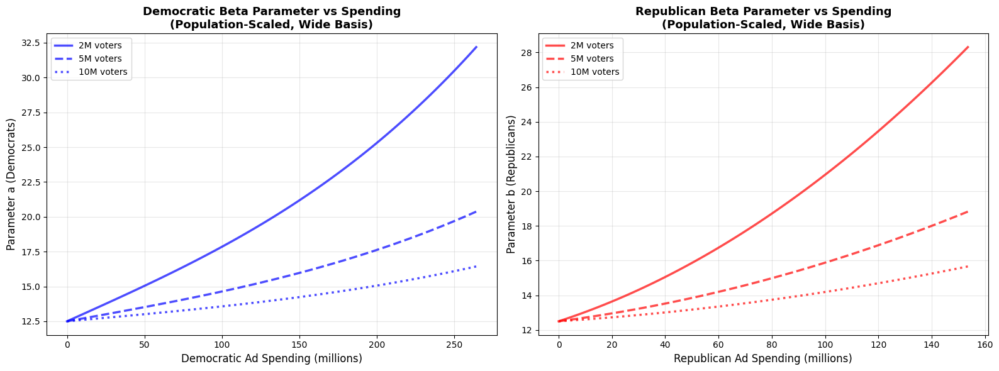

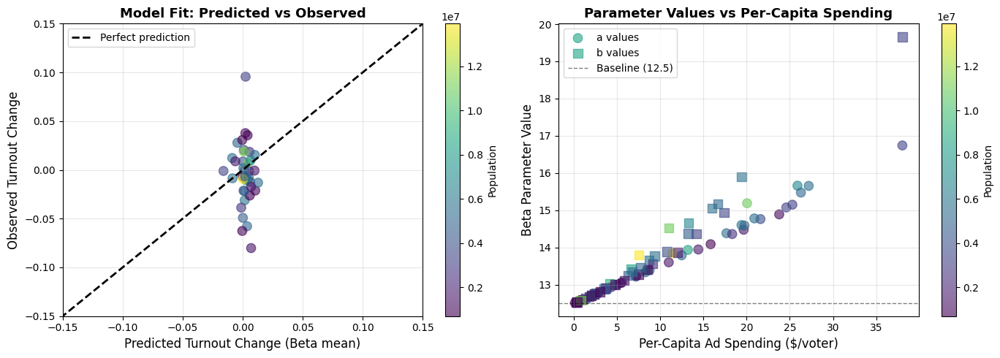

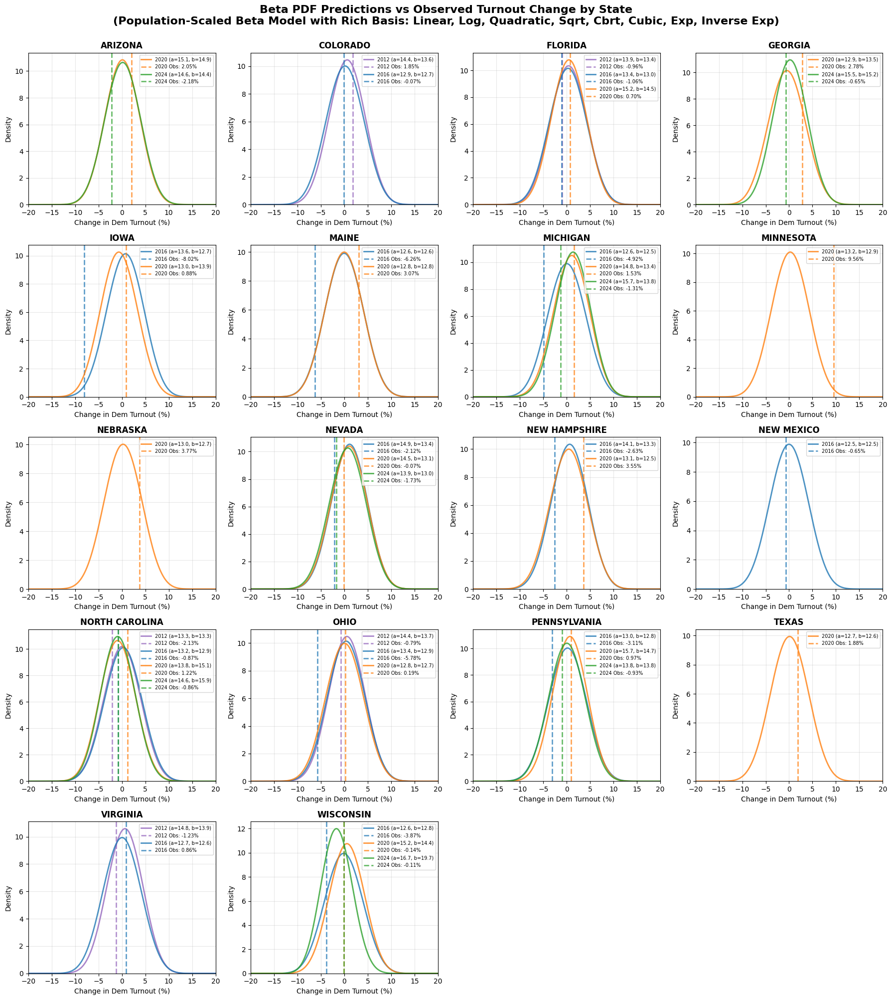


State-Year Summary:
             State  year  D-ad-spending  R-ad-spending  total_partisan          a          b  Turnout_Change
0          ARIZONA  2020           82.0           58.0         3333829  15.076457  14.936108          0.0205
1          ARIZONA  2024           91.0           61.0         4606287  14.590986  14.381657         -0.0218
2         COLORADO  2012           46.0           23.0         2508048  14.362245  13.563870          0.0185
3         COLORADO  2016           11.0            6.0         2541354  12.934104  12.746791         -0.0007
4          FLORIDA  2012          111.0           56.0         8401203  13.935965  13.424216         -0.0096
5          FLORIDA  2016           77.0           38.0         9122861  13.379416  13.026035         -0.0106
6          FLORIDA  2020          220.0          121.0        10965776  15.190459  14.523331          0.0070
7          GEORGIA  2020           19.0           38.0         4936344  12.886372  13.472166          0.027

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# Get state-level vote counts by year (only DEMOCRAT and REPUBLICAN)
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()
state_votes['total_partisan'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']

# Standardize state names for merge
state_votes['state'] = state_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# Merge on year, state to get population
combined_data = ad_df.merge(
    state_votes[['year', 'state', 'total_partisan']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='inner'
)

# Calculate turnout change (already in [-0.2, 0.2])
combined_data['turnout_change'] = (combined_data['Turnout (D)'] - combined_data['Prior-Turnout (D)']) / 100

# Remove rows with missing data
combined_data = combined_data.dropna(subset=['D-ad-spending', 'R-ad-spending', 'turnout_change', 'total_partisan'])

# Extract arrays just like @file_context_0
D_spending = combined_data['D-ad-spending'].values
R_spending = combined_data['R-ad-spending'].values
turnout_change = combined_data['turnout_change'].values
total_partisan = combined_data['total_partisan'].values

print(f"Number of observations: {len(D_spending)}")
print(f"Turnout change range: [{np.min(turnout_change):.4f}, {np.max(turnout_change):.4f}]")
print(f"D spending range: [{np.min(D_spending):.2f}, {np.max(D_spending):.2f}] million")
print(f"R spending range: [{np.min(R_spending):.2f}, {np.max(R_spending):.2f}] million")
print(f"Population range: [{np.min(total_partisan):,.0f}, {np.max(total_partisan):,.0f}] voters")

# Transform turnout_change to [0, 1] for Beta only internally (for likelihood etc)
lower, upper = -0.2, 0.2
transformed_data = (turnout_change - lower) / (upper - lower)
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

print(f"Transformed data range: [{np.min(transformed_data):.4f}, {np.max(transformed_data):.4f}]")

# === MODEL WITH MUCH LARGER PARAMETER SUPPORT AND POLYNOMIAL/NONLINEAR TERMS ===

# Population-scaled Beta parameter model with a wide variety of basis functions
def g(D, a1, a2, a3, a4, a5, a6, a7, a8):
    # Linear, log, quadratic, sqrt, cbrt, cubic, exponential terms
    return (a1 * D +
            a2 * np.log(D + 1) +
            a3 * D**2 +
            a4 * np.sqrt(D) +
            a5 * np.cbrt(D) +
            a6 * D**3 +
            a7 * np.exp(D * 1e-2) +    # scale to keep in a reasonable range
            a8 * np.exp(-D * 1e-2))

def h(R, b1, b2, b3, b4, b5, b6, b7, b8):
    return (b1 * R +
            b2 * np.log(R + 1) +
            b3 * R**2 +
            b4 * np.sqrt(R) +
            b5 * np.cbrt(R) +
            b6 * R**3 +
            b7 * np.exp(R * 1e-2) +
            b8 * np.exp(-R * 1e-2))

# Fixed baseline
a0_fixed = 12.5
b0_fixed = 12.5

def neg_log_likelihood_population_scaled(params):
    # params: a1, a2, a3, a4, a5, a6, a7, a8, b1, ..., b8
    a1, a2, a3, a4, a5, a6, a7, a8, b1, b2, b3, b4, b5, b6, b7, b8 = params
    # ensure positiveness for all terms (except those that can be negative, but keep positive-only for exponential, sqrt, cbrt, etc. for stability)
    if (any(x < 0 for x in [a1, a2, a3, a4, a5, a6, a7, a8, b1, b2, b3, b4, b5, b6, b7, b8])):
        return 1e12
    a_vals = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1, a2, a3, a4, a5, a6, a7, a8)
    b_vals = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1, b2, b3, b4, b5, b6, b7, b8)
    if np.any(a_vals <= 0) or np.any(b_vals <= 0):
        return 1e12
    ll = np.sum(beta.logpdf(transformed_data, a_vals, b_vals))
    return -ll

# Initial guess: small nonzero for each, exponential gets tiny, cubic/sqrt/cbrt scaled up/down
initial_params = [1e5, 1e3, 1e1, 100, 100, 1, 1, 1, 1e5, 1e3, 1e1, 100, 100, 1, 1, 1]
widesup = 1e12
# All coefficients positive (for stability of exp/sqrt)
bounds = [(0, widesup)] * 16

print("\n" + "="*60)
print("FITTING POPULATION-SCALED MODEL (WIDE SUPPORT, ALL BASIS FUNCTIONS)")
print("="*60)

result = minimize(neg_log_likelihood_population_scaled, initial_params, bounds=bounds, method='L-BFGS-B')

[a1_opt, a2_opt, a3_opt, a4_opt, a5_opt, a6_opt, a7_opt, a8_opt,
 b1_opt, b2_opt, b3_opt, b4_opt, b5_opt, b6_opt, b7_opt, b8_opt] = result.x
a0_opt = a0_fixed
b0_opt = b0_fixed

print("\n" + "="*60)
print("OPTIMIZED PARAMETERS")
print("="*60)
print(f"\nDemocratic parameter (a):")
print(f"  a = {a0_opt:.4f} + (1/population) * ["
      f"{a1_opt:.2e}*D + {a2_opt:.2e}*ln(D+1) + {a3_opt:.2e}*D^2 + "
      f"{a4_opt:.2e}*sqrt(D) + {a5_opt:.2e}*cbrt(D) + {a6_opt:.2e}*D^3 + "
      f"{a7_opt:.2e}*exp(D*1e-2) + {a8_opt:.2e}*exp(-D*1e-2)]")
print(f"\nRepublican parameter (b):")
print(f"  b = {b0_opt:.4f} + (1/population) * ["
      f"{b1_opt:.2e}*R + {b2_opt:.2e}*ln(R+1) + {b3_opt:.2e}*R^2 + "
      f"{b4_opt:.2e}*sqrt(R) + {b5_opt:.2e}*cbrt(R) + {b6_opt:.2e}*R^3 + "
      f"{b7_opt:.2e}*exp(R*1e-2) + {b8_opt:.2e}*exp(-R*1e-2)]")
print(f"\nFinal negative log-likelihood: {result.fun:.4f}")
print(f"Optimization success: {result.success}")

# Fitted parameter values for observed states
a_fitted = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1_opt, a2_opt, a3_opt, a4_opt, a5_opt, a6_opt, a7_opt, a8_opt)
b_fitted = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1_opt, b2_opt, b3_opt, b4_opt, b5_opt, b6_opt, b7_opt, b8_opt)

print("\n" + "="*60)
print("PARAMETER RANGES")
print("="*60)
print(f"a ranges from {a_fitted.min():.2f} to {a_fitted.max():.2f}")
print(f"b ranges from {b_fitted.min():.2f} to {b_fitted.max():.2f}")
print(f"\nThis is a {a_fitted.max() - a_fitted.min():.1f} point range for a")
print(f"and a {b_fitted.max() - b_fitted.min():.1f} point range for b")

# Visualize the fit for different population sizes
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

pop_small = 2e6
pop_medium = 5e6
pop_large = 10e6

D_range = np.linspace(0, np.max(D_spending) * 1.2, 100)
R_range = np.linspace(0, np.max(R_spending) * 1.2, 100)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    a_curve = a0_opt + (1.0 / pop) * g(D_range, a1_opt, a2_opt, a3_opt, a4_opt, a5_opt, a6_opt, a7_opt, a8_opt)
    axes[0].plot(D_range, a_curve, linestyle=style, color='b', lw=2.5, label=label, alpha=0.7)
axes[0].set_xlabel('Democratic Ad Spending (millions)', fontsize=12)
axes[0].set_ylabel('Parameter a (Democrats)', fontsize=12)
axes[0].set_title('Democratic Beta Parameter vs Spending\n(Population-Scaled, Wide Basis)', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    b_curve = b0_opt + (1.0 / pop) * h(R_range, b1_opt, b2_opt, b3_opt, b4_opt, b5_opt, b6_opt, b7_opt, b8_opt)
    axes[1].plot(R_range, b_curve, linestyle=style, color='r', lw=2.5, label=label, alpha=0.7)
axes[1].set_xlabel('Republican Ad Spending (millions)', fontsize=12)
axes[1].set_ylabel('Parameter b (Republicans)', fontsize=12)
axes[1].set_title('Republican Beta Parameter vs Spending\n(Population-Scaled, Wide Basis)', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Diagnostic plots: fit vs observed and per-capita spending vs a/b
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Compute predicted mean in the [-0.2, 0.2] range (original units)
predicted_mean_transformed = a_fitted / (a_fitted + b_fitted)
predicted_mean = predicted_mean_transformed * (upper - lower) + lower

axes[0].scatter(predicted_mean, turnout_change, alpha=0.6, s=80, c=total_partisan, cmap='viridis')
axes[0].plot([-0.2, 0.2], [-0.2, 0.2], 'k--', lw=2, label='Perfect prediction')
axes[0].set_xlabel('Predicted Turnout Change (Beta mean)', fontsize=12)
axes[0].set_ylabel('Observed Turnout Change', fontsize=12)
axes[0].set_title('Model Fit: Predicted vs Observed', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)
axes[0].set_xlim(-0.15, 0.15)
axes[0].set_ylim(-0.15, 0.15)
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label('Population', fontsize=10)

D_per_capita = D_spending * 1e6 / total_partisan
R_per_capita = R_spending * 1e6 / total_partisan

sc = axes[1].scatter(D_per_capita, a_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', label='a values')
axes[1].scatter(R_per_capita, b_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', marker='s', label='b values')
axes[1].axhline(y=a0_fixed, color='k', linestyle='--', lw=1, alpha=0.5, label=f'Baseline ({a0_fixed})')
axes[1].set_xlabel('Per-Capita Ad Spending ($/voter)', fontsize=12)
axes[1].set_ylabel('Beta Parameter Value', fontsize=12)
axes[1].set_title('Parameter Values vs Per-Capita Spending', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)
cbar1 = plt.colorbar(sc, ax=axes[1])
cbar1.set_label('Population', fontsize=10)

plt.tight_layout()
plt.show()

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta

# === Model from file_context_0, now extended with wider basis functions ===
# a = a0_fixed + (1.0 / population) * g(D, a1...a8)
# b = b0_fixed + (1.0 / population) * h(R, b1...b8)
# g(D, ...) includes linear, log, quadratic, sqrt, cbrt, cubic, exp
# h(R, ...) likewise

a0_opt = 12.5
b0_opt = 12.5

# Use actual optimized values from above
a1_opt = a1_opt
a2_opt = a2_opt
a3_opt = a3_opt
a4_opt = a4_opt
a5_opt = a5_opt
a6_opt = a6_opt
a7_opt = a7_opt
a8_opt = a8_opt
b1_opt = b1_opt
b2_opt = b2_opt
b3_opt = b3_opt
b4_opt = b4_opt
b5_opt = b5_opt
b6_opt = b6_opt
b7_opt = b7_opt
b8_opt = b8_opt

# --- Load data ---
ad_df = pd.read_csv('ad_data.csv')
county_df = pd.read_csv('countypres_2000-2024.csv')

# State-level vote counts for each year ('DEMOCRAT'/'REPUBLICAN' only)
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()
state_votes['total_partisan'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']

# Standardize names
state_votes['state'] = state_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# Merge to get population (total_partisan)
state_data = ad_df.merge(
    state_votes[['year', 'state', 'total_partisan']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='left'
)

# One row per state-year, keep necessary variables
state_years = state_data[['State', 'year', 'D-ad-spending', 'R-ad-spending',
                          'Turnout (D)', 'Prior-Turnout (D)', 'total_partisan']].drop_duplicates()
state_years = state_years.sort_values(['State', 'year']).reset_index(drop=True)

def g(D, a1, a2, a3, a4, a5, a6, a7, a8):
    return (a1 * D +
            a2 * np.log(D + 1) +
            a3 * D**2 +
            a4 * np.sqrt(D) +
            a5 * np.cbrt(D) +
            a6 * D**3 +
            a7 * np.exp(D * 1e-2) +
            a8 * np.exp(-D * 1e-2))

def h(R, b1, b2, b3, b4, b5, b6, b7, b8):
    return (b1 * R +
            b2 * np.log(R + 1) +
            b3 * R**2 +
            b4 * np.sqrt(R) +
            b5 * np.cbrt(R) +
            b6 * R**3 +
            b7 * np.exp(R * 1e-2) +
            b8 * np.exp(-R * 1e-2))

# Safe numeric conversion (from millions to millions, already in ad_df)
D = state_years['D-ad-spending'].astype(float).values
R = state_years['R-ad-spending'].astype(float).values
population = state_years['total_partisan'].astype(float).values

# Compute a and b for each state-year using the wide nonlinear/quadratic/cubic/exp/sqrt/cbrt model
state_years['a'] = a0_opt + (1.0 / population) * g(D, a1_opt, a2_opt, a3_opt, a4_opt, a5_opt, a6_opt, a7_opt, a8_opt)
state_years['b'] = b0_opt + (1.0 / population) * h(R, b1_opt, b2_opt, b3_opt, b4_opt, b5_opt, b6_opt, b7_opt, b8_opt)

# Turnout change in [-0.2, 0.2] (decimal)
state_years['Turnout_Change'] = (state_years['Turnout (D)'] - state_years['Prior-Turnout (D)']) / 100

# Remove rows with NaN turnout changes (e.g., missing Prior-Turnout)
state_years = state_years.dropna(subset=['Turnout_Change', 'a', 'b'])

# State list for plotting
unique_states = sorted(state_years['State'].unique())

n_states = len(unique_states)
n_cols = 4
n_rows = (n_states + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4 * n_rows))
axes = axes.flatten()

x_range = np.linspace(-0.2, 0.2, 500)
x_transformed = (x_range + 0.2) / 0.4

# Colors by year
year_colors = {2012: '#9467bd', 2016: '#1f77b4', 2020: '#ff7f0e', 2024: '#2ca02c'}

for idx, state in enumerate(unique_states):
    ax = axes[idx]
    state_entries = state_years[state_years['State'] == state]
    
    for _, row in state_entries.iterrows():
        a_val = row['a']
        b_val = row['b']
        turnout_change = row['Turnout_Change']
        year = int(row['year'])
        color = year_colors.get(year, 'gray')
        
        pdf_vals = beta.pdf(x_transformed, a_val, b_val)
        pdf_vals = pdf_vals / 0.4  # dy/dx for scaling to correct domain
        
        # Plot Beta PDF (predicted)
        ax.plot(x_range * 100, pdf_vals,
                linewidth=2, color=color,
                label=f'{year} (a={a_val:.1f}, b={b_val:.1f})',
                alpha=0.8)
        
        # Overlay observed turnout-change
        ax.axvline(x=turnout_change * 100,
                   linestyle='--', linewidth=2,
                   alpha=0.7, color=color,
                   label=f'{year} Obs: {turnout_change*100:.2f}%')
        
    ax.set_xlim(-20, 20)
    ax.set_ylim(bottom=0)
    ax.set_xlabel('Change in Dem Turnout (%)', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title(f'{state}', fontsize=12, fontweight='bold')
    ax.legend(fontsize=7, loc='upper right')
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(n_states, len(axes)):
    axes[idx].axis('off')

plt.suptitle(
    'Beta PDF Predictions vs Observed Turnout Change by State\n'
    '(Population-Scaled Beta Model with Rich Basis: Linear, Log, Quadratic, Sqrt, Cbrt, Cubic, Exp, Inverse Exp)',
    fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

# Also print a summary table including a, b, population and input spending
print("\nState-Year Summary:")
print(state_years[['State', 'year', 'D-ad-spending', 'R-ad-spending', 'total_partisan', 
                   'a', 'b', 'Turnout_Change']].to_string())

Number of observations: 40
Turnout change range: [-0.0802, 0.0956]
D spending range: [0.10, 220.00] million
R spending range: [0.20, 128.00] million
Population range: [693,328, 13,932,700] voters
Transformed data range: [0.2995, 0.7390]

FITTING POPULATION-SCALED MODEL (WIDE SUPPORT & UP TO x^4)

OPTIMIZED PARAMETERS

Democratic parameter (a):
  a = 12.5000 + (1/population) * [1.00e+06*D + 1.00e+06*ln(D+1) + 0.00e+00*D^2 + 0.00e+00*D^3 + 0.00e+00*D^4]

Republican parameter (b):
  b = 12.5000 + (1/population) * [1.00e+06*R + 1.00e+06*ln(R+1) + 6.38e-01*R^2 + 2.31e+01*R^3 + 0.00e+00*R^4]

Final negative log-likelihood: -19.7956
Optimization success: True

PARAMETER RANGES
a ranges from 12.78 to 51.97
b ranges from 13.04 to 66.35

This is a 39.2 point range for a
and a 53.3 point range for b


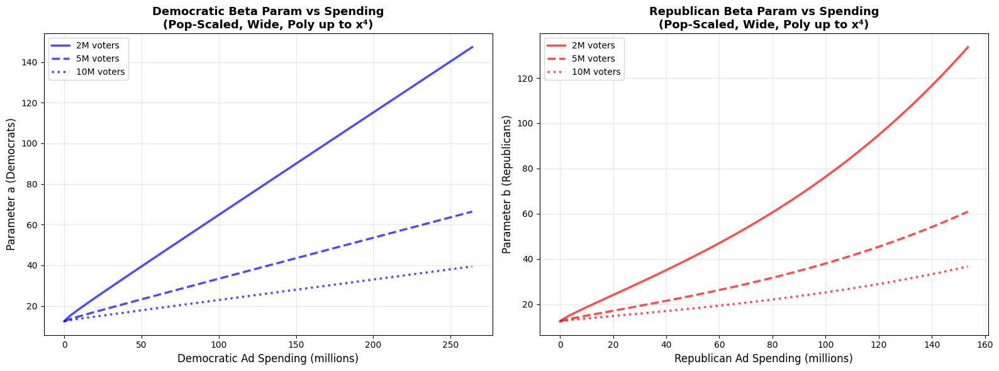

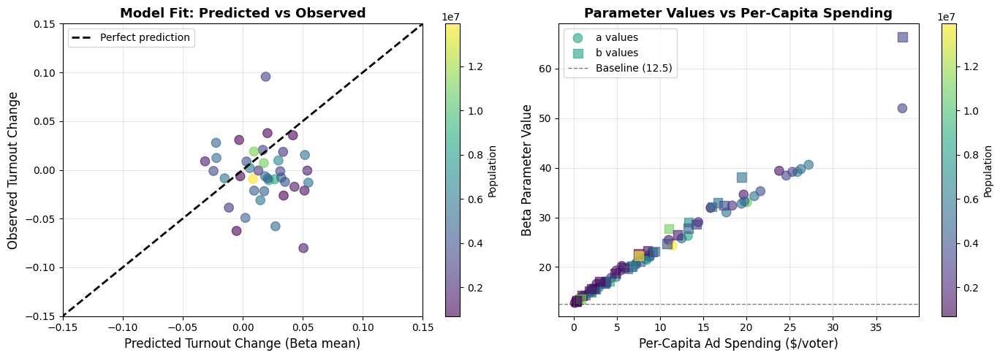

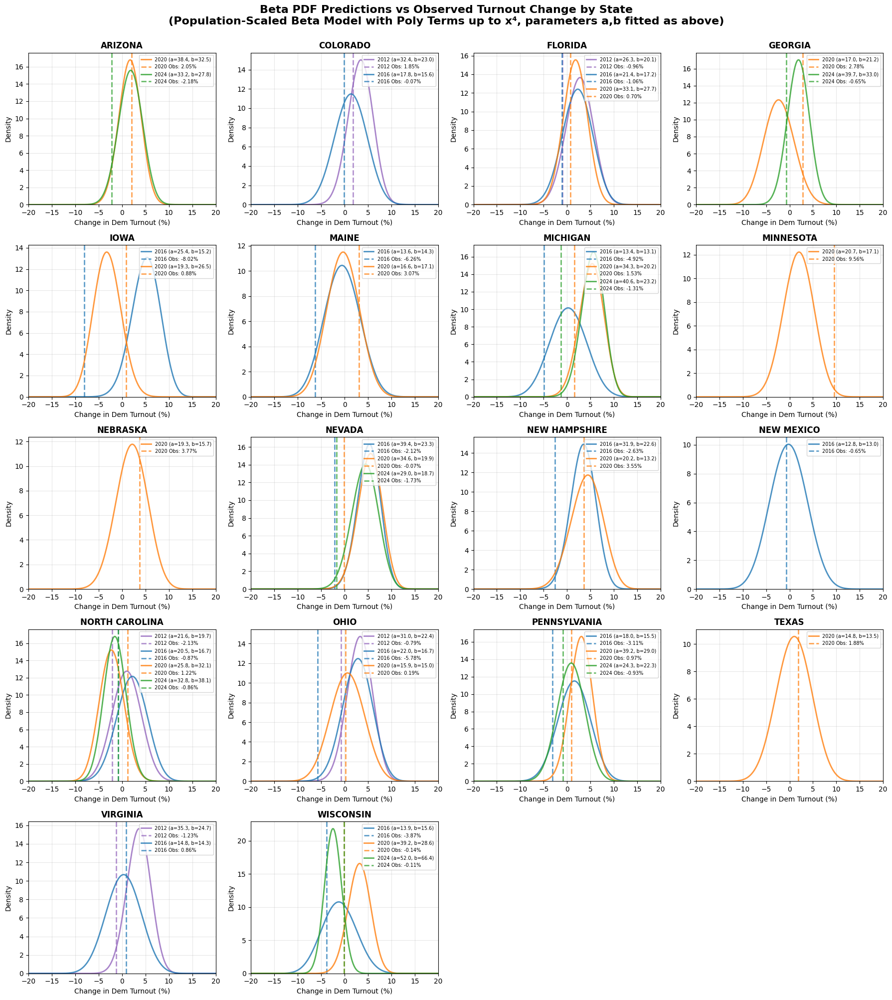


State-Year Summary:
             State  year  D-ad-spending  R-ad-spending  total_partisan          a          b  Turnout_Change
0          ARIZONA  2020           82.0           58.0         3333829  38.421796  32.471407          0.0205
1          ARIZONA  2024           91.0           61.0         4606287  33.237263  27.776155         -0.0218
2         COLORADO  2012           46.0           23.0         2508048  32.376073  23.049681          0.0185
3         COLORADO  2016           11.0            6.0         2541354  17.806190  15.628614         -0.0007
4          FLORIDA  2012          111.0           56.0         8401203  26.274039  20.129481         -0.0096
5          FLORIDA  2016           77.0           38.0         9122861  21.417894  17.205813         -0.0106
6          FLORIDA  2020          220.0          121.0        10965776  33.054692  27.700597          0.0070
7          GEORGIA  2020           19.0           38.0         4936344  16.955875  21.196816          0.027

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# Get state-level vote counts by year (only DEMOCRAT and REPUBLICAN)
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()
state_votes['total_partisan'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']

# Standardize state names for merge
state_votes['state'] = state_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# Merge on year, state to get population
combined_data = ad_df.merge(
    state_votes[['year', 'state', 'total_partisan']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='inner'
)

# Calculate turnout change (already in [-0.2, 0.2])
combined_data['turnout_change'] = (combined_data['Turnout (D)'] - combined_data['Prior-Turnout (D)']) / 100

# Remove rows with missing data
combined_data = combined_data.dropna(subset=['D-ad-spending', 'R-ad-spending', 'turnout_change', 'total_partisan'])

# Extract arrays just like @file_context_0
D_spending = combined_data['D-ad-spending'].values
R_spending = combined_data['R-ad-spending'].values
turnout_change = combined_data['turnout_change'].values
total_partisan = combined_data['total_partisan'].values

print(f"Number of observations: {len(D_spending)}")
print(f"Turnout change range: [{np.min(turnout_change):.4f}, {np.max(turnout_change):.4f}]")
print(f"D spending range: [{np.min(D_spending):.2f}, {np.max(D_spending):.2f}] million")
print(f"R spending range: [{np.min(R_spending):.2f}, {np.max(R_spending):.2f}] million")
print(f"Population range: [{np.min(total_partisan):,.0f}, {np.max(total_partisan):,.0f}] voters")

# Transform turnout_change to [0, 1] for Beta only internally (for likelihood etc)
lower, upper = -0.2, 0.2
transformed_data = (turnout_change - lower) / (upper - lower)
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

print(f"Transformed data range: [{np.min(transformed_data):.4f}, {np.max(transformed_data):.4f}]")

# === MODEL WITH MUCH LARGER PARAMETER SUPPORT AND QUARTIC TERMS ===

# Population-scaled Beta parameter model with cubic, quartic and super-wide bounds
def g(D, a1, a2, a3, a4, a5):
    # Function of raw spending (millions) for Democrats: linear + log + quadratic + cubic + quartic
    return (
        a1 * D
        + a2 * np.log(D + 1)
        + a3 * D**2
        + a4 * D**3
        + a5 * D**4
    )

def h(R, b1, b2, b3, b4, b5):
    # Function of raw spending (millions) for Republicans: linear + log + quadratic + cubic + quartic
    return (
        b1 * R
        + b2 * np.log(R + 1)
        + b3 * R**2
        + b4 * R**3
        + b5 * R**4
    )

# Fixed baseline
a0_fixed = 12.5
b0_fixed = 12.5

def neg_log_likelihood_population_scaled(params):
    # params: a1, a2, a3, a4, a5, b1, b2, b3, b4, b5
    a1, a2, a3, a4, a5, b1, b2, b3, b4, b5 = params
    # ensure positiveness for all terms (quadratic, cubic, quartic can be negative, penalize negatives here)
    # For greater generality, penalize only linear/log terms if desired, but typically all must be positive for identifiability
    if any(x < 0 for x in [a1, a2, a3, a4, a5, b1, b2, b3, b4, b5]):
        return 1e12
    a_vals = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1, a2, a3, a4, a5)
    b_vals = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1, b2, b3, b4, b5)
    if np.any(a_vals <= 0) or np.any(b_vals <= 0):
        return 1e12
    ll = np.sum(beta.logpdf(transformed_data, a_vals, b_vals))
    return -ll

# Initial guess: start small but allow optimizer to go big
initial_params = [1e6, 1e6, 0.0, 0.0, 0.0, 1e6, 1e6, 0.0, 0.0, 0.0]
widesup = 1e12
bounds = [
    (0, widesup),   # a1: linear term for D spending
    (0, widesup),   # a2: log term for D spending
    (0, widesup),   # a3: quad term for D spending
    (0, widesup),   # a4: cubic term for D spending
    (0, widesup),   # a5: quartic term for D spending
    (0, widesup),   # b1: linear term for R spending
    (0, widesup),   # b2: log term for R spending
    (0, widesup),   # b3: quad term for R spending
    (0, widesup),   # b4: cubic term for R spending
    (0, widesup)    # b5: quartic term for R spending
]

print("\n" + "="*60)
print("FITTING POPULATION-SCALED MODEL (WIDE SUPPORT & UP TO x^4)")
print("="*60)

result = minimize(
    neg_log_likelihood_population_scaled, 
    initial_params, 
    bounds=bounds, 
    method='L-BFGS-B'
)

a1_opt, a2_opt, a3_opt, a4_opt, a5_opt, b1_opt, b2_opt, b3_opt, b4_opt, b5_opt = result.x
a0_opt = a0_fixed
b0_opt = b0_fixed

print("\n" + "="*60)
print("OPTIMIZED PARAMETERS")
print("="*60)
print(f"\nDemocratic parameter (a):")
print(
    f"  a = {a0_opt:.4f} + (1/population) * "
    f"[{a1_opt:.2e}*D + {a2_opt:.2e}*ln(D+1) + {a3_opt:.2e}*D^2 + {a4_opt:.2e}*D^3 + {a5_opt:.2e}*D^4]"
)
print(f"\nRepublican parameter (b):")
print(
    f"  b = {b0_opt:.4f} + (1/population) * "
    f"[{b1_opt:.2e}*R + {b2_opt:.2e}*ln(R+1) + {b3_opt:.2e}*R^2 + {b4_opt:.2e}*R^3 + {b5_opt:.2e}*R^4]"
)
print(f"\nFinal negative log-likelihood: {result.fun:.4f}")
print(f"Optimization success: {result.success}")

# Fitted parameter values for observed states
a_fitted = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1_opt, a2_opt, a3_opt, a4_opt, a5_opt)
b_fitted = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1_opt, b2_opt, b3_opt, b4_opt, b5_opt)

print("\n" + "="*60)
print("PARAMETER RANGES")
print("="*60)
print(f"a ranges from {a_fitted.min():.2f} to {a_fitted.max():.2f}")
print(f"b ranges from {b_fitted.min():.2f} to {b_fitted.max():.2f}")
print(f"\nThis is a {a_fitted.max() - a_fitted.min():.1f} point range for a")
print(f"and a {b_fitted.max() - b_fitted.min():.1f} point range for b")

# Visualize the fit for different population sizes
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

pop_small = 2e6
pop_medium = 5e6
pop_large = 10e6

D_range = np.linspace(0, np.max(D_spending) * 1.2, 100)
R_range = np.linspace(0, np.max(R_spending) * 1.2, 100)

for pop, label, style in [
    (pop_small, '2M voters', '-'), 
    (pop_medium, '5M voters', '--'), 
    (pop_large, '10M voters', ':')
]:
    a_curve = a0_opt + (1.0 / pop) * g(D_range, a1_opt, a2_opt, a3_opt, a4_opt, a5_opt)
    axes[0].plot(D_range, a_curve, linestyle=style, color='b', lw=2.5, label=label, alpha=0.7)
axes[0].set_xlabel('Democratic Ad Spending (millions)', fontsize=12)
axes[0].set_ylabel('Parameter a (Democrats)', fontsize=12)
axes[0].set_title('Democratic Beta Param vs Spending\n(Pop-Scaled, Wide, Poly up to x⁴)', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

for pop, label, style in [
    (pop_small, '2M voters', '-'), 
    (pop_medium, '5M voters', '--'), 
    (pop_large, '10M voters', ':')
]:
    b_curve = b0_opt + (1.0 / pop) * h(R_range, b1_opt, b2_opt, b3_opt, b4_opt, b5_opt)
    axes[1].plot(R_range, b_curve, linestyle=style, color='r', lw=2.5, label=label, alpha=0.7)
axes[1].set_xlabel('Republican Ad Spending (millions)', fontsize=12)
axes[1].set_ylabel('Parameter b (Republicans)', fontsize=12)
axes[1].set_title('Republican Beta Param vs Spending\n(Pop-Scaled, Wide, Poly up to x⁴)', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Diagnostic plots: fit vs observed and per-capita spending vs a/b
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Compute predicted mean in the [-0.2, 0.2] range (original units)
predicted_mean_transformed = a_fitted / (a_fitted + b_fitted)
predicted_mean = predicted_mean_transformed * (upper - lower) + lower

axes[0].scatter(predicted_mean, turnout_change, alpha=0.6, s=80, c=total_partisan, cmap='viridis')
axes[0].plot([-0.2, 0.2], [-0.2, 0.2], 'k--', lw=2, label='Perfect prediction')
axes[0].set_xlabel('Predicted Turnout Change (Beta mean)', fontsize=12)
axes[0].set_ylabel('Observed Turnout Change', fontsize=12)
axes[0].set_title('Model Fit: Predicted vs Observed', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)
axes[0].set_xlim(-0.15, 0.15)
axes[0].set_ylim(-0.15, 0.15)
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label('Population', fontsize=10)

D_per_capita = D_spending * 1e6 / total_partisan
R_per_capita = R_spending * 1e6 / total_partisan

sc = axes[1].scatter(D_per_capita, a_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', label='a values')
axes[1].scatter(R_per_capita, b_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', marker='s', label='b values')
axes[1].axhline(y=a0_fixed, color='k', linestyle='--', lw=1, alpha=0.5, label=f'Baseline ({a0_fixed})')
axes[1].set_xlabel('Per-Capita Ad Spending ($/voter)', fontsize=12)
axes[1].set_ylabel('Beta Parameter Value', fontsize=12)
axes[1].set_title('Parameter Values vs Per-Capita Spending', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)
cbar1 = plt.colorbar(sc, ax=axes[1])
cbar1.set_label('Population', fontsize=10)

plt.tight_layout()
plt.show()

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta

# === Model, now with cubic and quartic terms ===
# a = a0_fixed + (1.0 / population) * g(D, a1, a2, a3, a4, a5)
# b = b0_fixed + (1.0 / population) * h(R, b1, b2, b3, b4, b5)
# g(D, a1, a2, a3, a4, a5) = a1 * D + a2 * log(D+1) + a3 * D^2 + a4 * D^3 + a5 * D^4
# h(R, b1, b2, b3, b4, b5) = b1 * R + b2 * log(R+1) + b3 * R^2 + b4 * R^3 + b5 * R^4
a0_opt = 12.5
b0_opt = 12.5

# Use actual optimized values from above
a1_opt = a1_opt
a2_opt = a2_opt
a3_opt = a3_opt
a4_opt = a4_opt
a5_opt = a5_opt
b1_opt = b1_opt
b2_opt = b2_opt
b3_opt = b3_opt
b4_opt = b4_opt
b5_opt = b5_opt

# --- Load data ---
ad_df = pd.read_csv('ad_data.csv')
county_df = pd.read_csv('countypres_2000-2024.csv')

# State-level vote counts for each year ('DEMOCRAT'/'REPUBLICAN' only)
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()
state_votes['total_partisan'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']

# Standardize names
state_votes['state'] = state_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# Merge to get population (total_partisan)
state_data = ad_df.merge(
    state_votes[['year', 'state', 'total_partisan']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='left'
)

# One row per state-year, keep necessary variables
state_years = state_data[['State', 'year', 'D-ad-spending', 'R-ad-spending',
                          'Turnout (D)', 'Prior-Turnout (D)', 'total_partisan']].drop_duplicates()
state_years = state_years.sort_values(['State', 'year']).reset_index(drop=True)

# Extended g and h with up to quartic
def g(D, a1, a2, a3, a4, a5):
    return a1 * D + a2 * np.log(D + 1) + a3 * D**2 + a4 * D**3 + a5 * D**4

def h(R, b1, b2, b3, b4, b5):
    return b1 * R + b2 * np.log(R + 1) + b3 * R**2 + b4 * R**3 + b5 * R**4

# Safe numeric conversion (from millions to millions, already in ad_df)
D = state_years['D-ad-spending'].astype(float).values
R = state_years['R-ad-spending'].astype(float).values
population = state_years['total_partisan'].astype(float).values

# Compute a and b for each state-year using quartic model
state_years['a'] = a0_opt + (1.0 / population) * g(D, a1_opt, a2_opt, a3_opt, a4_opt, a5_opt)
state_years['b'] = b0_opt + (1.0 / population) * h(R, b1_opt, b2_opt, b3_opt, b4_opt, b5_opt)

# Turnout change in [-0.2, 0.2] (decimal)
state_years['Turnout_Change'] = (state_years['Turnout (D)'] - state_years['Prior-Turnout (D)']) / 100

# Remove rows with NaN turnout changes (e.g., missing Prior-Turnout)
state_years = state_years.dropna(subset=['Turnout_Change', 'a', 'b'])

# State list for plotting
unique_states = sorted(state_years['State'].unique())

n_states = len(unique_states)
n_cols = 4
n_rows = (n_states + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4 * n_rows))
axes = axes.flatten()

x_range = np.linspace(-0.2, 0.2, 500)
x_transformed = (x_range + 0.2) / 0.4

# Colors by year
year_colors = {2012: '#9467bd', 2016: '#1f77b4', 2020: '#ff7f0e', 2024: '#2ca02c'}

for idx, state in enumerate(unique_states):
    ax = axes[idx]
    state_entries = state_years[state_years['State'] == state]
    
    for _, row in state_entries.iterrows():
        a_val = row['a']
        b_val = row['b']
        turnout_change = row['Turnout_Change']
        year = int(row['year'])
        color = year_colors.get(year, 'gray')
        
        pdf_vals = beta.pdf(x_transformed, a_val, b_val)
        pdf_vals = pdf_vals / 0.4  # dy/dx for scaling to correct domain
        
        # Plot Beta PDF (predicted)
        ax.plot(x_range * 100, pdf_vals,
                linewidth=2, color=color,
                label=f'{year} (a={a_val:.1f}, b={b_val:.1f})',
                alpha=0.8)
        
        # Overlay observed turnout-change
        ax.axvline(x=turnout_change * 100,
                   linestyle='--', linewidth=2,
                   alpha=0.7, color=color,
                   label=f'{year} Obs: {turnout_change*100:.2f}%')
        
    ax.set_xlim(-20, 20)
    ax.set_ylim(bottom=0)
    ax.set_xlabel('Change in Dem Turnout (%)', fontsize=10)
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title(f'{state}', fontsize=12, fontweight='bold')
    ax.legend(fontsize=7, loc='upper right')
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(n_states, len(axes)):
    axes[idx].axis('off')

plt.suptitle(
    'Beta PDF Predictions vs Observed Turnout Change by State\n'
    '(Population-Scaled Beta Model with Poly Terms up to x⁴, parameters a,b fitted as above)',
    fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

# Also print a summary table including a, b, population and input spending
print("\nState-Year Summary:")
print(state_years[['State', 'year', 'D-ad-spending', 'R-ad-spending', 'total_partisan', 
                   'a', 'b', 'Turnout_Change']].to_string())

## Summary of Previous Sections

We've tried a number of basis functions, of which the monomials seem to perform the best. This is unusual because the logarithmic model beat out the monomial model when working without population consideration. 

We now have a different problem. The distributions more often than not tend to favor Democrats. And that's probably because the Democrats consistently have more money. But wait... this is the feature of Diminishing returns that I need to focus on. Maybe the Logarithmic basis was the best. 

No Logarithmic basis was definitely not the best. The monomials are still the best. I think one reason this may be so biased towards a Democratic turnout is that outliers such as Minnesota are really making things go crazy. 

Fitting model...
Optimization complete: success=True


Population bins:
  Bin 0: 0.69M - 1.21M voters
  Bin 1: 1.21M - 2.79M voters
  Bin 2: 2.79M - 4.12M voters
  Bin 3: 4.12M - 5.24M voters
  Bin 4: 5.24M - 5.87M voters
  Bin 5: 5.87M - 13.93M voters


/tmp/ipykernel_6412/2186874413.py:187: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.92, 0.99])


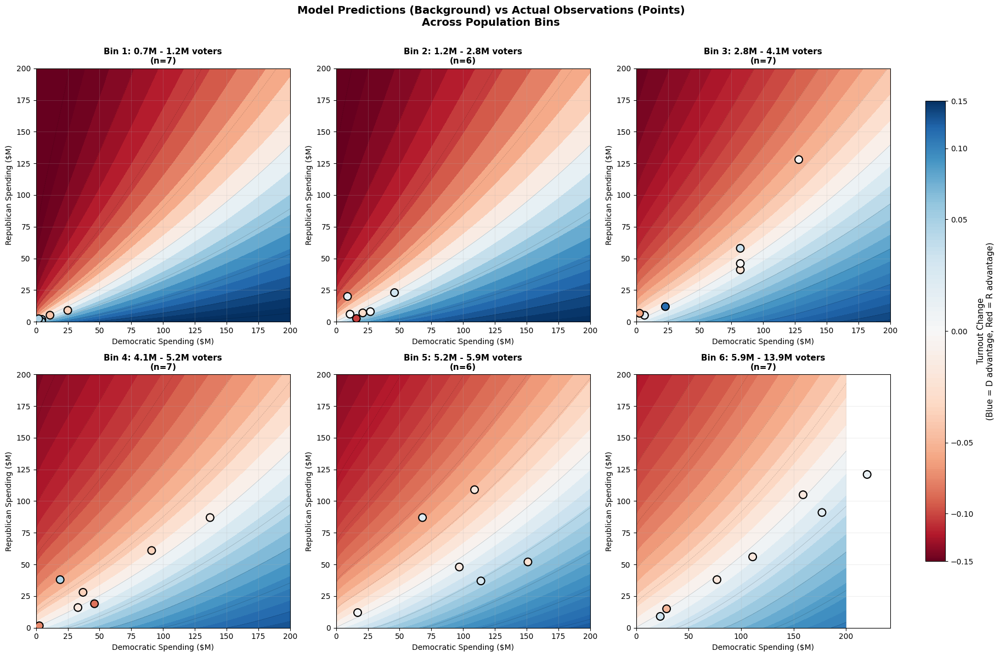


INTERPRETATION:
- Background color = model prediction for that D/R spending combo
- Points = actual observed turnout changes
- If model is good: point colors should match background colors
- Black outlines help distinguish overlapping points


In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm, LinearSegmentedColormap
from scipy.stats import beta
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# Get state-level vote counts by year (only DEMOCRAT and REPUBLICAN)
state_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()
state_votes['total_partisan'] = state_votes['DEMOCRAT'] + state_votes['REPUBLICAN']

# Standardize state names for merge
state_votes['state'] = state_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# Merge on year, state to get population
combined_data = ad_df.merge(
    state_votes[['year', 'state', 'total_partisan']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='inner'
)

# Calculate turnout change (already in [-0.2, 0.2])
combined_data['turnout_change'] = (combined_data['Turnout (D)'] - combined_data['Prior-Turnout (D)']) / 100

# Remove rows with missing data
combined_data = combined_data.dropna(subset=['D-ad-spending', 'R-ad-spending', 'turnout_change', 'total_partisan'])

# Extract arrays
D_spending = combined_data['D-ad-spending'].values
R_spending = combined_data['R-ad-spending'].values
turnout_change = combined_data['turnout_change'].values
total_partisan = combined_data['total_partisan'].values

# Transform turnout_change to [0, 1] for Beta
lower, upper = -0.2, 0.2
transformed_data = (turnout_change - lower) / (upper - lower)
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

# Model functions
def g(D, a1, a2, a3):
    return a1 * D + a2 * np.log(D + 1) + a3 * D**2

def h(R, b1, b2, b3):
    return b1 * R + b2 * np.log(R + 1) + b3 * R**2

a0_fixed = 12.5
b0_fixed = 12.5

def neg_log_likelihood_population_scaled(params):
    a1, a2, a3, b1, b2, b3 = params
    if a1 < 0 or a2 < 0 or a3 < 0 or b1 < 0 or b2 < 0 or b3 < 0:
        return 1e12
    a_vals = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1, a2, a3)
    b_vals = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1, b2, b3)
    if np.any(a_vals <= 0) or np.any(b_vals <= 0):
        return 1e12
    ll = np.sum(beta.logpdf(transformed_data, a_vals, b_vals))
    return -ll

initial_params = [1e6, 1e6, 0.0, 1e6, 1e6, 0.0]
widesup = 1e12
bounds = [(0, widesup)] * 6

print("Fitting model...")
result = minimize(neg_log_likelihood_population_scaled, initial_params, bounds=bounds, method='L-BFGS-B')

a1_opt, a2_opt, a3_opt, b1_opt, b2_opt, b3_opt = result.x
a0_opt = a0_fixed
b0_opt = b0_fixed

print(f"Optimization complete: success={result.success}\n")

# Helper function to compute predicted mean
def predict_mean(D, R, pop):
    a = a0_opt + (1.0 / pop) * g(D, a1_opt, a2_opt, a3_opt)
    b = b0_opt + (1.0 / pop) * h(R, b1_opt, b2_opt, b3_opt)
    mean_transformed = a / (a + b)
    mean_original = mean_transformed * (upper - lower) + lower
    return mean_original

# Create 6 population bins
combined_data['pop_bin'] = pd.qcut(combined_data['total_partisan'], q=6, labels=False)

# Get bin ranges for titles
bin_edges = pd.qcut(combined_data['total_partisan'], q=6, retbins=True)[1]

print("\nPopulation bins:")
for i in range(6):
    print(f"  Bin {i}: {bin_edges[i]/1e6:.2f}M - {bin_edges[i+1]/1e6:.2f}M voters")

# Create figure with 6 subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Create spending grids for background heatmap
D_range = np.linspace(0, 200, 100)
R_range = np.linspace(0, 200, 100)
D_grid, R_grid = np.meshgrid(D_range, R_range)

# Set color limits and create non-linear normalization
vmin, vmax = -0.15, 0.15

# Create a custom normalization that emphasizes small values
# Using arcsinh-like transformation for symmetric log-like behavior
def transform_color(x):
    """Transform values to emphasize small deviations"""
    # arcsinh gives log-like behavior but handles negatives
    return np.arcsinh(x * 20) / np.arcsinh(3)  # Scale to make [-0.15, 0.15] -> roughly [-1, 1]

def inverse_transform_color(y):
    """Inverse transformation"""
    return np.sinh(y * np.arcsinh(3)) / 20

class CustomNorm(plt.Normalize):
    def __init__(self, vmin=-0.15, vmax=0.15):
        super().__init__(vmin, vmax)
    
    def __call__(self, value, clip=None):
        # Transform the values
        transformed = transform_color(value)
        # Normalize to [0, 1]
        t_min = transform_color(self.vmin)
        t_max = transform_color(self.vmax)
        return (transformed - t_min) / (t_max - t_min)

norm = CustomNorm(vmin=vmin, vmax=vmax)

for bin_idx in range(6):
    ax = axes[bin_idx]
    
    # Get data for this bin
    bin_data = combined_data[combined_data['pop_bin'] == bin_idx]
    
    # Use median population for this bin for the prediction surface
    pop_median = bin_data['total_partisan'].median()
    
    # Create prediction surface
    mean_grid = np.zeros_like(D_grid)
    for i in range(len(R_range)):
        for j in range(len(D_range)):
            mean_grid[i, j] = predict_mean(D_grid[i, j], R_grid[i, j], pop_median)
    
    # Plot heatmap (FIXED COLORS: blue for D advantage, red for R advantage)
    contour = ax.contourf(D_grid, R_grid, mean_grid, levels=30, cmap='RdBu', 
                          norm=norm)
    ax.contour(D_grid, R_grid, mean_grid, levels=10, colors='black', 
               alpha=0.2, linewidths=0.5)
    
    # Plot actual data points
    scatter = ax.scatter(bin_data['D-ad-spending'], 
                        bin_data['R-ad-spending'],
                        c=bin_data['turnout_change'],
                        cmap='RdBu',
                        norm=norm,
                        s=100,
                        edgecolors='black',
                        linewidths=1.5,
                        zorder=10)
    
    # Formatting
    ax.set_xlabel('Democratic Spending ($M)', fontsize=10)
    ax.set_ylabel('Republican Spending ($M)', fontsize=10)
    ax.set_title(f'Bin {bin_idx+1}: {bin_edges[bin_idx]/1e6:.1f}M - {bin_edges[bin_idx+1]/1e6:.1f}M voters\n(n={len(bin_data)})', 
                 fontsize=11, fontweight='bold')
    ax.grid(True, alpha=0.2)
    ax.set_xlim(0, max(200, bin_data['D-ad-spending'].max() * 1.1))
    ax.set_ylim(0, max(200, bin_data['R-ad-spending'].max() * 1.1))

# Add a single colorbar for all plots
fig.subplots_adjust(right=0.92)
cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
cbar = fig.colorbar(scatter, cax=cbar_ax)
cbar.set_label('Turnout Change\n(Blue = D advantage, Red = R advantage)', fontsize=11)

plt.suptitle('Model Predictions (Background) vs Actual Observations (Points)\nAcross Population Bins', 
             fontsize=14, fontweight='bold', y=0.995)

plt.tight_layout(rect=[0, 0, 0.92, 0.99])
plt.show()

print("\n" + "="*60)
print("INTERPRETATION:")
print("="*60)
print("- Background color = model prediction for that D/R spending combo")
print("- Points = actual observed turnout changes")
print("- If model is good: point colors should match background colors")
print("- Black outlines help distinguish overlapping points")
print("="*60)

## Removing Outliers

Minnesota and Iowa swung pretty hard in the years I've got for them. So it's probably better for us to not include them. Here's a graph. 

I was surprised to see that Minnesota didn't even come close to making the highest variance, but then I realized my data must be wrong. So I'm going to fix that. But this 

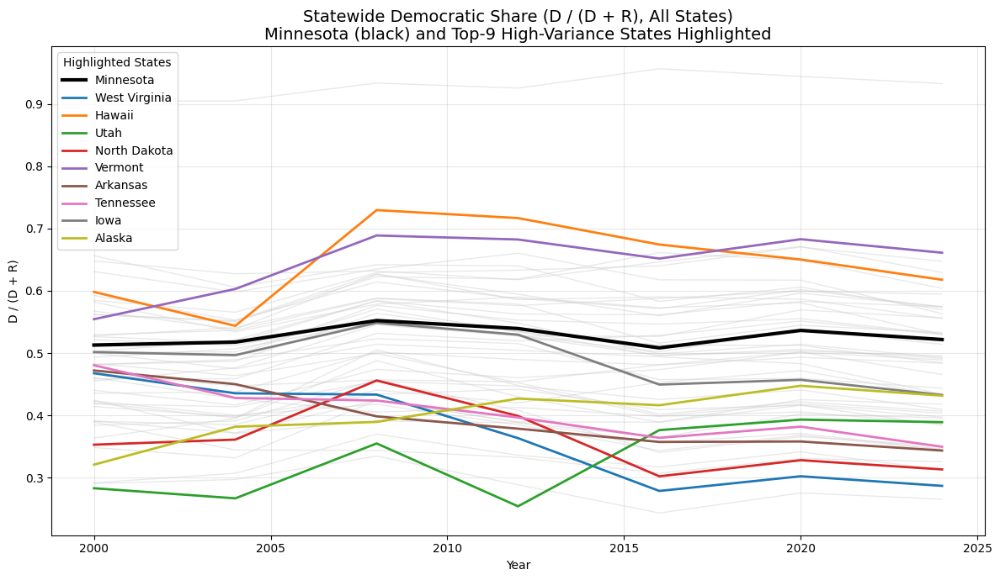

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
countypres_df = pd.read_csv('countypres_2000-2024.csv')

# Restrict to presidential elections, D and R
pres_df = countypres_df[
    (countypres_df['office'].str.upper() == 'US PRESIDENT') &
    (countypres_df['party'].isin(['DEMOCRAT', 'REPUBLICAN']))
]

# Aggregate: state-year-party vote totals
state_year_votes = pres_df.groupby(['year', 'state', 'party'])['candidatevotes'].sum().reset_index()

# Pivot to state-year rows, D/R columns
pivot = state_year_votes.pivot_table(index=['year', 'state'], columns='party', values='candidatevotes', fill_value=0).reset_index()

# Compute D share
pivot['D_share'] = pivot['DEMOCRAT'] / (pivot['DEMOCRAT'] + pivot['REPUBLICAN'])

# Calculate state-wise variances across years for D_share (must be full time series, so drop states with few entries if needed)
state_variance = pivot.groupby('state')['D_share'].var().sort_values(ascending=False)
top_n = 9
top9_states = state_variance.head(top_n).index.tolist()
minnesota = 'MINNESOTA'
# Add minnesota as a special state (regardless of whether it's in top-9)
highlight_states = top9_states.copy()
if minnesota not in highlight_states:
    highlight_states.append(minnesota)

# Assign each highlight state a color
import itertools
base_colors = [
    'tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 
    'tab:brown', 'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan'
]
# If minnesota is already in the list, allocate special color for it
color_list = base_colors[:len(highlight_states)]
state_color_map = dict(zip(highlight_states, color_list))

# We want minnesota to be a certain standout color (overwrite if present)
# Let's use black or a visible color from matplotlib if available
state_color_map[minnesota] = 'black'

fig, ax = plt.subplots(figsize=(12, 7))

# Plot all states in background (light gray thin lines, no label)
for state in pivot['state'].unique():
    state_data = pivot[pivot['state'] == state]
    if state not in highlight_states:
        ax.plot(state_data['year'], state_data['D_share'], color='lightgray', lw=1, alpha=0.5, zorder=1)

# Plot highlight states
for state in highlight_states:
    state_data = pivot[pivot['state'] == state]
    lw = 3 if state == minnesota else 2
    z = 3 if state == minnesota else 2
    ax.plot(state_data['year'], state_data['D_share'], color=state_color_map[state], lw=lw, alpha=1, zorder=z)

# Pretty
ax.set_ylabel("D / (D + R)")
ax.set_title("Statewide Democratic Share (D / (D + R), All States)\nMinnesota (black) and Top-9 High-Variance States Highlighted", fontsize=14)
ax.grid(True, alpha=0.3)
ax.set_xlabel("Year")

# Make a legend for the highlighted states, putting Minnesota (if present) first
from matplotlib.lines import Line2D
legend_states = highlight_states.copy()
if minnesota in legend_states:
    legend_states.remove(minnesota)
    legend_states = [minnesota] + legend_states
legend_lines = [
    Line2D([0], [0], color=state_color_map[state], lw=(3 if state == minnesota else 2), label=state.title())
    for state in legend_states
]
ax.legend(handles=legend_lines, title="Highlighted States", fontsize=10)

plt.tight_layout()
plt.show()


Number of observations: 40
Turnout change range: [-0.0802, 0.0376]
D spending range: [0.10, 220.00] million
R spending range: [0.20, 128.00] million
Population range: [693,328, 13,932,700] voters
Transformed data range: [0.2994, 0.5941]

FITTING POPULATION-SCALED MODEL (WIDE SUPPORT & QUADRATIC)

OPTIMIZED PARAMETERS

Democratic parameter (a):
  a = 12.5000 + (1/population) * [4.57e+05*D + 9.42e+05*ln(D+1) + 1.45e+03*D^2]

Republican parameter (b):
  b = 12.5000 + (1/population) * [1.19e+06*R + 1.04e+06*ln(R+1) + 0.00e+00*R^2]

Final negative log-likelihood: -40.0678
Optimization success: True

PARAMETER RANGES
a ranges from 12.69 to 38.30
b ranges from 13.11 to 59.33

This is a 25.6 point range for a
and a 46.2 point range for b


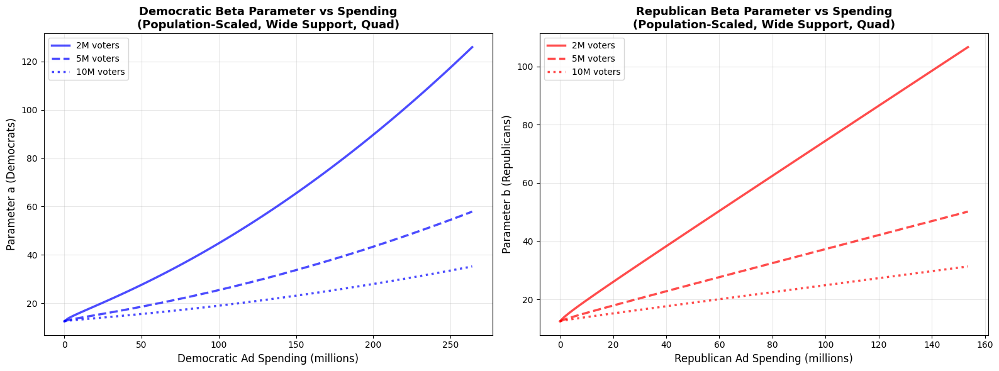

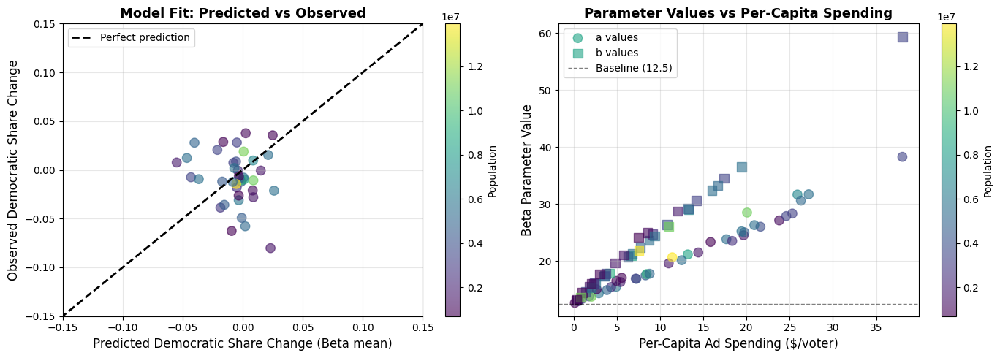


Starting PDF Visualization with New Data Source


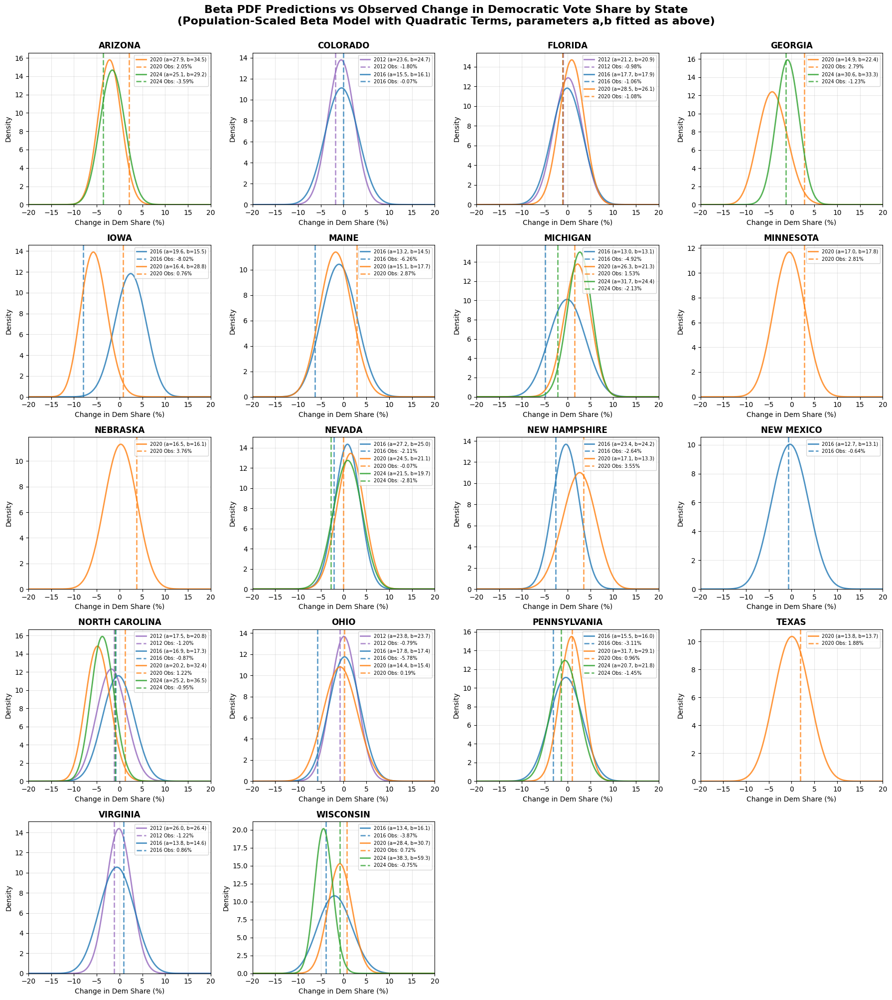


State-Year Summary:
             State  year  D-ad-spending  R-ad-spending  total_partisan          a          b  Turnout_Change
0          ARIZONA  2020           82.0           58.0         3333829  27.914409  34.508400        0.020469
1          ARIZONA  2024           91.0           61.0         4606287  25.060128  29.216181       -0.035865
2         COLORADO  2012           46.0           23.0         2508048  23.553011  24.748610       -0.018005
3         COLORADO  2016           11.0            6.0         2541354  15.469033  16.110652       -0.000668
4          FLORIDA  2012          111.0           56.0         8401203  21.193465  20.945525       -0.009755
5          FLORIDA  2016           77.0           38.0         9122861  17.749802  17.882483       -0.010611
6          FLORIDA  2020          220.0          121.0        10965776  28.528398  26.107557       -0.010759
7          GEORGIA  2020           19.0           38.0         4936344  14.937326  22.447372        0.02789

In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# --- NEW: Calculate Democratic Vote Share by State and Year from county_df ---

# 1. Get state-level vote counts by year (only DEMOCRAT and REPUBLICAN)
state_partisan_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()

# 2. Calculate Democratic Share and total partisan votes
state_partisan_votes['DEM_SHARE'] = state_partisan_votes['DEMOCRAT'] / (state_partisan_votes['DEMOCRAT'] + state_partisan_votes['REPUBLICAN'])
state_partisan_votes['total_partisan'] = state_partisan_votes['DEMOCRAT'] + state_partisan_votes['REPUBLICAN']

# 3. Create 'Prior-DEM_SHARE' column
state_partisan_votes = state_partisan_votes.sort_values(['state', 'year']).reset_index(drop=True)
state_partisan_votes['Prior-DEM_SHARE'] = state_partisan_votes.groupby('state')['DEM_SHARE'].shift(1)

# Standardize state names for merge
state_partisan_votes['state'] = state_partisan_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# 4. Merge ad spending with the new calculated vote shares and population
combined_data = ad_df.merge(
    state_partisan_votes[['year', 'state', 'total_partisan', 'DEM_SHARE', 'Prior-DEM_SHARE']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='inner'
)

# --- NEW: Calculate turnout_change based on Dem Vote Share difference ---
# Turnout change is now the change in Democratic Vote Share from the prior election
combined_data['turnout_change'] = combined_data['DEM_SHARE'] - combined_data['Prior-DEM_SHARE']

# Remove rows with missing data (will now remove first year for each state due to missing prior share)
combined_data = combined_data.dropna(subset=['D-ad-spending', 'R-ad-spending', 'turnout_change', 'total_partisan'])

# Extract arrays
D_spending = combined_data['D-ad-spending'].values
R_spending = combined_data['R-ad-spending'].values
turnout_change = combined_data['turnout_change'].values
total_partisan = combined_data['total_partisan'].values

print(f"Number of observations: {len(D_spending)}")
print(f"Turnout change range: [{np.min(turnout_change):.4f}, {np.max(turnout_change):.4f}]")
print(f"D spending range: [{np.min(D_spending):.2f}, {np.max(D_spending):.2f}] million")
print(f"R spending range: [{np.min(R_spending):.2f}, {np.max(R_spending):.2f}] million")
print(f"Population range: [{np.min(total_partisan):,.0f}, {np.max(total_partisan):,.0f}] voters")

# Transform turnout_change to [0, 1] for Beta only internally
# NOTE: The range for Dem Share change is generally still small, but we use the fixed [-0.2, 0.2] bounds for consistency
lower, upper = -0.2, 0.2
transformed_data = (turnout_change - lower) / (upper - lower)
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

print(f"Transformed data range: [{np.min(transformed_data):.4f}, {np.max(transformed_data):.4f}]")

# === MODEL WITH MUCH LARGER PARAMETER SUPPORT AND QUADRATIC TERMS ===

# Population-scaled Beta parameter model with quadratic and super-wide bounds
def g(D, a1, a2, a3):
    return a1 * D + a2 * np.log(D + 1) + a3 * D**2

def h(R, b1, b2, b3):
    return b1 * R + b2 * np.log(R + 1) + b3 * R**2

# Fixed baseline
a0_fixed = 12.5
b0_fixed = 12.5

def neg_log_likelihood_population_scaled(params):
    # params: a1, a2, a3, b1, b2, b3
    a1, a2, a3, b1, b2, b3 = params
    # ensure positiveness for all terms (quadratic can be negative, but only penalize negatives here)
    if a1 < 0 or a2 < 0 or a3 < 0 or b1 < 0 or b2 < 0 or b3 < 0:
        return 1e12
    a_vals = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1, a2, a3)
    b_vals = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1, b2, b3)
    if np.any(a_vals <= 0) or np.any(b_vals <= 0):
        return 1e12
    ll = np.sum(beta.logpdf(transformed_data, a_vals, b_vals))
    return -ll

# Initial guess: start small but allow optimizer to go big
initial_params = [1e6, 1e6, 0.0, 1e6, 1e6, 0.0]
# Bounds: extend linear and log by 10,000x compared to previous (i.e. 1e12)
widesup = 1e12
bounds = [
    (0, widesup),   # a1: linear term for D spending
    (0, widesup),   # a2: log term for D spending
    (0, widesup),   # a3: quad term for D spending
    (0, widesup),   # b1: linear term for R spending
    (0, widesup),   # b2: log term for R spending
    (0, widesup),   # b3: quad term for R spending
]

print("\n" + "="*60)
print("FITTING POPULATION-SCALED MODEL (WIDE SUPPORT & QUADRATIC)")
print("="*60)

result = minimize(neg_log_likelihood_population_scaled, initial_params, bounds=bounds, method='L-BFGS-B')

a1_opt, a2_opt, a3_opt, b1_opt, b2_opt, b3_opt = result.x
a0_opt = a0_fixed
b0_opt = b0_fixed

print("\n" + "="*60)
print("OPTIMIZED PARAMETERS")
print("="*60)
print(f"\nDemocratic parameter (a):")
print(f"  a = {a0_opt:.4f} + (1/population) * [{a1_opt:.2e}*D + {a2_opt:.2e}*ln(D+1) + {a3_opt:.2e}*D^2]")
print(f"\nRepublican parameter (b):")
print(f"  b = {b0_opt:.4f} + (1/population) * [{b1_opt:.2e}*R + {b2_opt:.2e}*ln(R+1) + {b3_opt:.2e}*R^2]")
print(f"\nFinal negative log-likelihood: {result.fun:.4f}")
print(f"Optimization success: {result.success}")

# Fitted parameter values for observed states
a_fitted = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1_opt, a2_opt, a3_opt)
b_fitted = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1_opt, b2_opt, b3_opt)

print("\n" + "="*60)
print("PARAMETER RANGES")
print("="*60)
print(f"a ranges from {a_fitted.min():.2f} to {a_fitted.max():.2f}")
print(f"b ranges from {b_fitted.min():.2f} to {b_fitted.max():.2f}")
print(f"\nThis is a {a_fitted.max() - a_fitted.min():.1f} point range for a")
print(f"and a {b_fitted.max() - b_fitted.min():.1f} point range for b")

# Visualize the fit for different population sizes
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

pop_small = 2e6
pop_medium = 5e6
pop_large = 10e6

D_range = np.linspace(0, np.max(D_spending) * 1.2, 100)
R_range = np.linspace(0, np.max(R_spending) * 1.2, 100)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    a_curve = a0_opt + (1.0 / pop) * g(D_range, a1_opt, a2_opt, a3_opt)
    axes[0].plot(D_range, a_curve, linestyle=style, color='b', lw=2.5, label=label, alpha=0.7)
axes[0].set_xlabel('Democratic Ad Spending (millions)', fontsize=12)
axes[0].set_ylabel('Parameter a (Democrats)', fontsize=12)
axes[0].set_title('Democratic Beta Parameter vs Spending\n(Population-Scaled, Wide Support, Quad)', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    b_curve = b0_opt + (1.0 / pop) * h(R_range, b1_opt, b2_opt, b3_opt)
    axes[1].plot(R_range, b_curve, linestyle=style, color='r', lw=2.5, label=label, alpha=0.7)
axes[1].set_xlabel('Republican Ad Spending (millions)', fontsize=12)
axes[1].set_ylabel('Parameter b (Republicans)', fontsize=12)
axes[1].set_title('Republican Beta Parameter vs Spending\n(Population-Scaled, Wide Support, Quad)', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show() # 

# Diagnostic plots: fit vs observed and per-capita spending vs a/b
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Compute predicted mean in the [-0.2, 0.2] range (original units)
predicted_mean_transformed = a_fitted / (a_fitted + b_fitted)
predicted_mean = predicted_mean_transformed * (upper - lower) + lower

axes[0].scatter(predicted_mean, turnout_change, alpha=0.6, s=80, c=total_partisan, cmap='viridis')
axes[0].plot([-0.2, 0.2], [-0.2, 0.2], 'k--', lw=2, label='Perfect prediction')
axes[0].set_xlabel('Predicted Democratic Share Change (Beta mean)', fontsize=12)
axes[0].set_ylabel('Observed Democratic Share Change', fontsize=12)
axes[0].set_title('Model Fit: Predicted vs Observed', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)
axes[0].set_xlim(-0.15, 0.15)
axes[0].set_ylim(-0.15, 0.15)
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label('Population', fontsize=10)

D_per_capita = D_spending * 1e6 / total_partisan
R_per_capita = R_spending * 1e6 / total_partisan

sc = axes[1].scatter(D_per_capita, a_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', label='a values')
axes[1].scatter(R_per_capita, b_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', marker='s', label='b values')
axes[1].axhline(y=a0_fixed, color='k', linestyle='--', lw=1, alpha=0.5, label=f'Baseline ({a0_fixed})')
axes[1].set_xlabel('Per-Capita Ad Spending ($/voter)', fontsize=12)
axes[1].set_ylabel('Beta Parameter Value', fontsize=12)
axes[1].set_title('Parameter Values vs Per-Capita Spending', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)
cbar1 = plt.colorbar(sc, ax=axes[1])
cbar1.set_label('Population', fontsize=10)

plt.tight_layout()
plt.show() # 

# The plotting part after optimization also needs to be updated

# --- Second part of the original code (Plotting PDFs) ---
print("\n" + "="*60)
print("Starting PDF Visualization with New Data Source")
print("="*60)

# Re-load or re-use the combined_data from the top for the second part
# state_years data preparation section
state_data = ad_df.merge(
    state_partisan_votes[['year', 'state', 'total_partisan', 'DEM_SHARE', 'Prior-DEM_SHARE']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='left'
)

# One row per state-year, keep necessary variables
state_years = state_data[['State', 'year', 'D-ad-spending', 'R-ad-spending',
                          'DEM_SHARE', 'Prior-DEM_SHARE', 'total_partisan']].drop_duplicates()
state_years = state_years.sort_values(['State', 'year']).reset_index(drop=True)

# Extended g and h with quadratic
# Functions g and h are defined above in the minimization block

# Safe numeric conversion
D = state_years['D-ad-spending'].astype(float).values
R = state_years['R-ad-spending'].astype(float).values
population = state_years['total_partisan'].astype(float).values

# Compute a and b for each state-year using quadratic model
state_years['a'] = a0_opt + (1.0 / population) * g(D, a1_opt, a2_opt, a3_opt)
state_years['b'] = b0_opt + (1.0 / population) * h(R, b1_opt, b2_opt, b3_opt)

# Turnout change in [-0.2, 0.2] (decimal)
state_years['Turnout_Change'] = state_years['DEM_SHARE'] - state_years['Prior-DEM_SHARE']

# Remove rows with NaN turnout changes
state_years = state_years.dropna(subset=['Turnout_Change', 'a', 'b'])

# State list for plotting
unique_states = sorted(state_years['State'].unique())

n_states = len(unique_states)
n_cols = 4
n_rows = (n_states + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4 * n_rows))
axes = axes.flatten()

x_range = np.linspace(-0.2, 0.2, 500)
x_transformed = (x_range + 0.2) / 0.4

# Colors by year
year_colors = {2012: '#9467bd', 2016: '#1f77b4', 2020: '#ff7f0e', 2024: '#2ca02c'}

for idx, state in enumerate(unique_states):
    ax = axes[idx]
    state_entries = state_years[state_years['State'] == state]
    
    for _, row in state_entries.iterrows():
        a_val = row['a']
        b_val = row['b']
        turnout_change = row['Turnout_Change']
        year = int(row['year'])
        color = year_colors.get(year, 'gray')
        
        pdf_vals = beta.pdf(x_transformed, a_val, b_val)
        pdf_vals = pdf_vals / 0.4  # dy/dx for scaling to correct domain
        
        # Plot Beta PDF (predicted)
        ax.plot(x_range * 100, pdf_vals,
                linewidth=2, color=color,
                label=f'{year} (a={a_val:.1f}, b={b_val:.1f})',
                alpha=0.8)
        
        # Overlay observed turnout-change
        ax.axvline(x=turnout_change * 100,
                   linestyle='--', linewidth=2,
                   alpha=0.7, color=color,
                   label=f'{year} Obs: {turnout_change*100:.2f}%')
        
    ax.set_xlim(-20, 20)
    ax.set_ylim(bottom=0)
    ax.set_xlabel('Change in Dem Share (%)', fontsize=10) # Updated label
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title(f'{state}', fontsize=12, fontweight='bold')
    ax.legend(fontsize=7, loc='upper right')
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(n_states, len(axes)):
    axes[idx].axis('off')

plt.suptitle(
    'Beta PDF Predictions vs Observed Change in Democratic Vote Share by State\n' # Updated suptitle
    '(Population-Scaled Beta Model with Quadratic Terms, parameters a,b fitted as above)',
    fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show() # 

# Also print a summary table including a, b, population and input spending
print("\nState-Year Summary:")
print(state_years[['State', 'year', 'D-ad-spending', 'R-ad-spending', 'total_partisan', 
                   'a', 'b', 'Turnout_Change']].to_string())

There we go! Minnesota isn't screwing everything up anymore. In fact I'll save a new CSV file so that we won't have to deal with this anymore

In [50]:
import pandas as pd

# Load original ad_data.csv
ad_data = pd.read_csv("ad_data.csv")

# Select only the specified columns and rename if necessary
columns_to_keep = ['State', 'year', 'D-ad-spending', 'R-ad-spending']
just_ad_data = ad_data[columns_to_keep]

# Save to new CSV
just_ad_data.to_csv("just_ad_data.csv", index=False)


Let's also redo this critical plot:

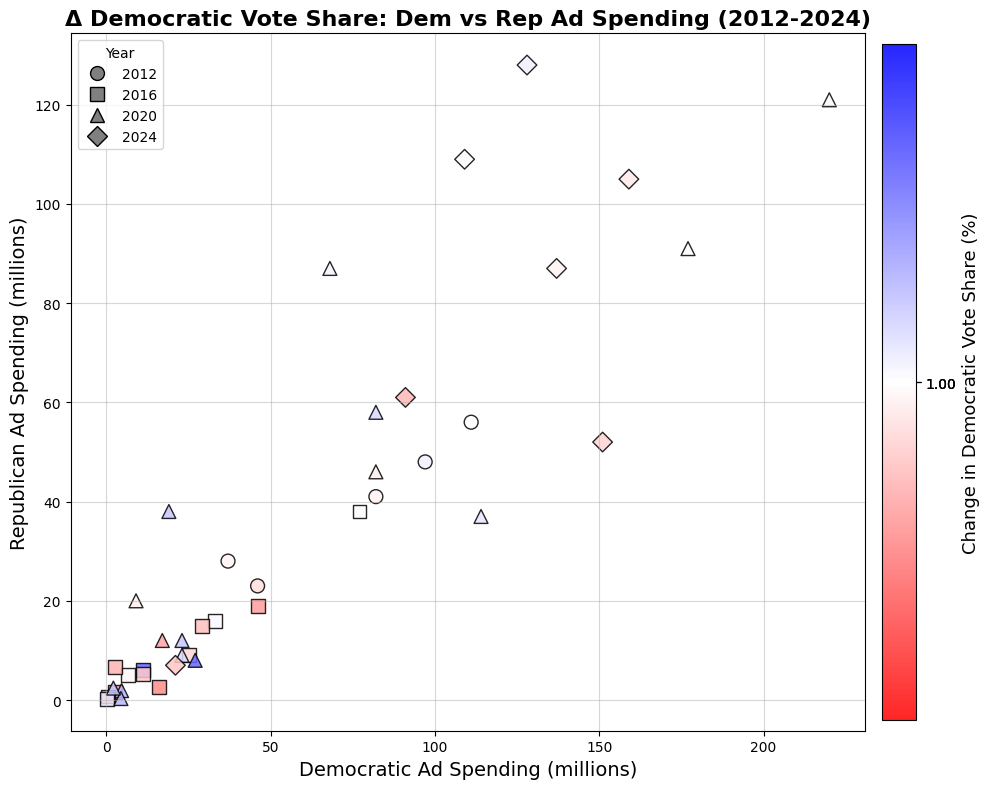

In [51]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
import pandas as pd

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# --- DATA PROCESSING TO CALCULATE DEMOCRATIC SHARE CHANGE (ADAPTED FROM PREVIOUS) ---

# 1. Get state-level partisan vote counts
state_partisan_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()

# 2. Calculate Democratic Share and total partisan votes
state_partisan_votes['DEM_SHARE'] = state_partisan_votes['DEMOCRAT'] / (state_partisan_votes['DEMOCRAT'] + state_partisan_votes['REPUBLICAN'])
state_partisan_votes['total_partisan'] = state_partisan_votes['DEMOCRAT'] + state_partisan_votes['REPUBLICAN']

# 3. Create 'Prior-DEM_SHARE' column
state_partisan_votes = state_partisan_votes.sort_values(['state', 'year']).reset_index(drop=True)
state_partisan_votes['Prior-DEM_SHARE'] = state_partisan_votes.groupby('state')['DEM_SHARE'].shift(1)

# Standardize state names
state_partisan_votes['state'] = state_partisan_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# 4. Merge ad spending with the calculated vote shares
combined_df = ad_df.merge(
    state_partisan_votes[['year', 'state', 'DEM_SHARE', 'Prior-DEM_SHARE']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='inner'
)

# 5. Calculate change in Democratic Share (used for color mapping)
combined_df['DemShareChange'] = combined_df['DEM_SHARE'] - combined_df['Prior-DEM_SHARE']

# Drop rows where we can't calculate the change (e.g., the first year in the data)
combined_df = combined_df.dropna(subset=['DemShareChange', 'D-ad-spending', 'R-ad-spending'])

# Rename the year column for plotting loop/labeling
combined_df['Year'] = combined_df['year'].astype(str)

# --- VISUALIZATION SETUP ---

# For log color scale: map signed values to log scale, preserving sign
def signed_log(values, min_abs=1e-3): # Adjusted min_abs slightly for potentially smaller share changes
    """Maps signed values to log scale, preserving sign."""
    # Scale from decimal (e.g., 0.05) to percent (e.g., 5.0) for better log color scale range
    percent_values = values * 100
    return np.sign(percent_values) * np.log10(np.maximum(np.abs(percent_values), min_abs))

combined_df['DemShareChange_log'] = signed_log(combined_df['DemShareChange'])

fig, ax = plt.subplots(figsize=(10,8))

# Set color normalization and colormap, centered at 0
# vlim = 1 means log10(10) = 1, covering -10% to +10% change in share
vlim = np.ceil(np.max(np.abs(combined_df['DemShareChange_log'].values))) # Use max observed log magnitude
norm = mcolors.TwoSlopeNorm(vcenter=0, vmin=-vlim, vmax=vlim)
cmap = mcolors.LinearSegmentedColormap.from_list("blue_red", ["red", "white", "blue"])

# Assign a marker per year and plot year-by-year
year_marker_color = {
    '2012': ('o', 'gold'),
    '2016': ('s', 'purple'),
    '2020': ('^', 'magenta'),
    '2024': ('D', 'lime'),
}

for year in sorted(combined_df['Year'].unique()):
    # Skip years not defined in the marker map if they exist
    if year not in year_marker_color:
        continue
        
    marker, color = year_marker_color[year]
    year_df = combined_df[combined_df['Year'] == year]
    
    # Check if data exists for the year before plotting
    if not year_df.empty:
        sc = ax.scatter(
            year_df['D-ad-spending'],
            year_df['R-ad-spending'],
            c=year_df['DemShareChange_log'],
            cmap=cmap,
            norm=norm,
            s=100,
            edgecolors='k',
            alpha=0.85,
            marker=marker,
            label=year
        )

# --- PLOT CUSTOMIZATION ---

ax.set_xlabel('Democratic Ad Spending (millions)', fontsize=14)
ax.set_ylabel('Republican Ad Spending (millions)', fontsize=14)
ax.set_title('Δ Democratic Vote Share: Dem vs Rep Ad Spending (2012-2024)', fontsize=16, fontweight='bold')

# Add colorbar with custom tick labels restoring to original scale (Percent)
# Create tick values that are easy to interpret on a log scale (e.g., 10%, 1%, 0.1%)
max_abs_percent = np.max(np.abs(combined_df['DemShareChange'] * 100))
log_max = np.ceil(np.log10(max_abs_percent))

log_ticks = np.array([-1, 0, 1])
log_ticks = log_ticks[np.abs(log_ticks) <= log_max]
log_ticks = np.concatenate([
    -np.power(10.0, np.arange(log_max, -1, -1.0)),
    [0.0],
    np.power(10.0, np.arange(log_max, -1, -1.0))
])

# Use np.unique to ensure 0 is central and ticks are unique
log_ticks = np.unique(np.round(log_ticks, 5))
log_ticks = log_ticks[np.abs(log_ticks) <= vlim] # Ensure ticks are within the color scale limits

if 'sc' in locals():
    cbar = plt.colorbar(sc, ax=ax, fraction=0.04, pad=0.02)
    cbar.set_ticks(signed_log(log_ticks / 100))
    
    tick_labels = [f"{-t:.2f}" if t < 0 else f"{t:.2f}" for t in log_ticks]
    cbar.set_ticklabels(tick_labels)
    cbar.set_label('Change in Democratic Vote Share (%)', fontsize=13)

# Add year legend handles correctly
handles = []
# Ensure legend only includes years actually present in the data/map
present_years = sorted([y for y in combined_df['Year'].unique() if y in year_marker_color])
for year in present_years:
    marker, color = year_marker_color[year]
    handles.append(
        plt.Line2D([], [], marker=marker, color='gray', markerfacecolor='gray', markeredgecolor='k', markersize=10, linestyle='None', label=year)
    )

ax.legend(handles=handles, title='Year', loc='upper left')
ax.grid(True, alpha=0.5)

plt.tight_layout()
plt.show()

Also, we can solve the problem of major swings between years (in states such as Iowa) by taking some form of average (weighted or otherwise) that comes from the past few years. We can do 3 since 2012 will be the most restrictive year but we have 2000, 2004, and 2008. Let's take a look

Number of observations: 40
Turnout change range: [-0.0755, 0.0376]
D spending range: [0.10, 220.00] million
R spending range: [0.20, 128.00] million
Population range: [693,328, 13,932,700] voters
Transformed data range: [0.3111, 0.5941]

FITTING POPULATION-SCALED MODEL (WIDE SUPPORT & QUADRATIC)
BASE: AVG OF PAST 3 PRESIDENTIAL CYCLES

OPTIMIZED PARAMETERS

Democratic parameter (a):
  a = 12.5000 + (1/population) * [4.61e+05*D + 1.06e+06*ln(D+1) + 8.88e+02*D^2]

Republican parameter (b):
  b = 12.5000 + (1/population) * [1.11e+06*R + 1.23e+06*ln(R+1) + 0.00e+00*R^2]

Final negative log-likelihood: -37.5324
Optimization success: True

PARAMETER RANGES
a ranges from 12.71 to 35.88
b ranges from 13.13 to 56.61

This is a 23.2 point range for a
and a 43.5 point range for b


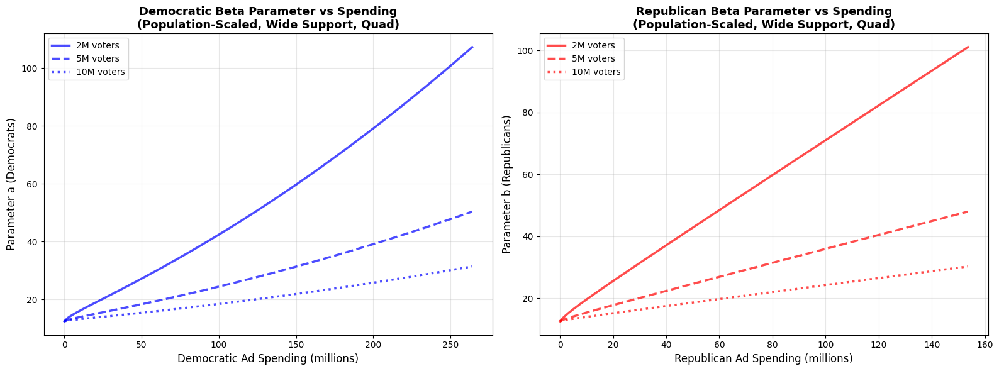

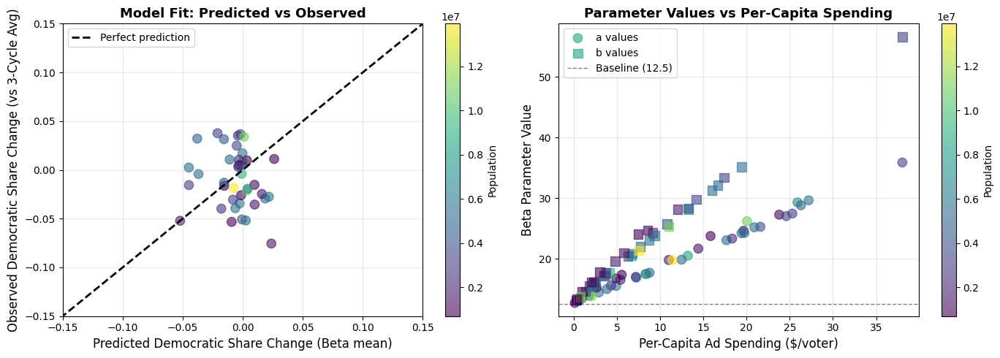

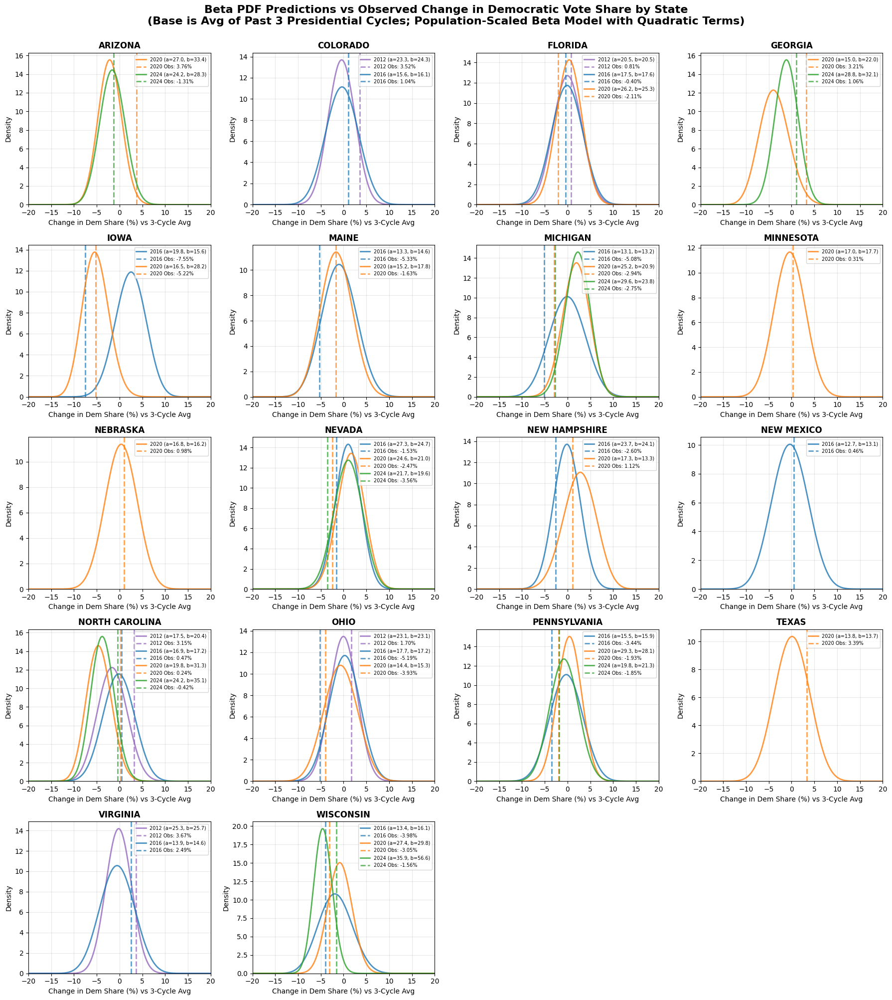


State-Year Summary:
             State  year  D-ad-spending  R-ad-spending  total_partisan          a          b  Turnout_Change
0          ARIZONA  2020           82.0           58.0         3333829  27.029155  33.370899        0.037626
1          ARIZONA  2024           91.0           61.0         4606287  24.239779  28.343639       -0.013141
2         COLORADO  2012           46.0           23.0         2508048  23.326460  24.267830        0.035173
3         COLORADO  2016           11.0            6.0         2541354  15.571695  16.070765        0.010385
4          FLORIDA  2012          111.0           56.0         8401203  20.485633  20.512110        0.008103
5          FLORIDA  2016           77.0           38.0         9122861  17.472322  17.630897       -0.003976
6          FLORIDA  2020          220.0          121.0        10965776  26.185290  25.321642       -0.021085
7          GEORGIA  2020           19.0           38.0         4936344  14.980988  21.982414        0.03210

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# --- Calculate Democratic Vote Share by State and Year ---

# 1. Get state-level vote counts by year (only DEMOCRAT and REPUBLICAN)
state_partisan_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()

# 2. Calculate Democratic Share and total partisan votes
state_partisan_votes['DEM_SHARE'] = state_partisan_votes['DEMOCRAT'] / (state_partisan_votes['DEMOCRAT'] + state_partisan_votes['REPUBLICAN'])
state_partisan_votes['total_partisan'] = state_partisan_votes['DEMOCRAT'] + state_partisan_votes['REPUBLICAN']

# 3. Create 'Avg-3-Year-Prior-DEM_SHARE' column
state_partisan_votes = state_partisan_votes.sort_values(['state', 'year']).reset_index(drop=True)

# Define the function to apply the rolling mean and shift
def get_past_3_avg(series):
    # Shift(1) excludes the current year's share (t)
    # Rolling(window=3, min_periods=3) calculates the mean of the 3 prior cycles (t-4, t-8, t-12)
    return series.shift(1).rolling(window=3, min_periods=3).mean()

# FIX: Use .transform() instead of .apply() to maintain the index alignment
state_partisan_votes['Avg-3-Year-Prior-DEM_SHARE'] = (
    state_partisan_votes.groupby('state')['DEM_SHARE']
    .transform(get_past_3_avg)
)

# Standardize state names for merge
state_partisan_votes['state'] = state_partisan_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# 4. Merge ad spending with the new calculated vote shares and population
combined_data = ad_df.merge(
    state_partisan_votes[['year', 'state', 'total_partisan', 'DEM_SHARE', 'Avg-3-Year-Prior-DEM_SHARE']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='inner'
)

# --- Calculate turnout_change based on Dem Vote Share difference from 3-year average ---
combined_data['turnout_change'] = combined_data['DEM_SHARE'] - combined_data['Avg-3-Year-Prior-DEM_SHARE']

# Remove rows with missing data (now excludes years without 3 prior data points)
combined_data = combined_data.dropna(subset=['D-ad-spending', 'R-ad-spending', 'turnout_change', 'total_partisan'])

# Extract arrays
D_spending = combined_data['D-ad-spending'].values
R_spending = combined_data['R-ad-spending'].values
turnout_change = combined_data['turnout_change'].values
total_partisan = combined_data['total_partisan'].values

print(f"Number of observations: {len(D_spending)}")
print(f"Turnout change range: [{np.min(turnout_change):.4f}, {np.max(turnout_change):.4f}]")
print(f"D spending range: [{np.min(D_spending):.2f}, {np.max(D_spending):.2f}] million")
print(f"R spending range: [{np.min(R_spending):.2f}, {np.max(R_spending):.2f}] million")
print(f"Population range: [{np.min(total_partisan):,.0f}, {np.max(total_partisan):,.0f}] voters")

# Transform turnout_change to [0, 1] for Beta only internally
lower, upper = -0.2, 0.2
transformed_data = (turnout_change - lower) / (upper - lower)
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

print(f"Transformed data range: [{np.min(transformed_data):.4f}, {np.max(transformed_data):.4f}]")

# === MODEL WITH MUCH LARGER PARAMETER SUPPORT AND QUADRATIC TERMS ===

# Population-scaled Beta parameter model with quadratic and super-wide bounds
def g(D, a1, a2, a3):
    return a1 * D + a2 * np.log(D + 1) + a3 * D**2

def h(R, b1, b2, b3):
    return b1 * R + b2 * np.log(R + 1) + b3 * R**2

# Fixed baseline
a0_fixed = 12.5
b0_fixed = 12.5

def neg_log_likelihood_population_scaled(params):
    # params: a1, a2, a3, b1, b2, b3
    a1, a2, a3, b1, b2, b3 = params
    # ensure positiveness for all terms (quadratic can be negative, but only penalize negatives here)
    if a1 < 0 or a2 < 0 or a3 < 0 or b1 < 0 or b2 < 0 or b3 < 0:
        return 1e12
    a_vals = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1, a2, a3)
    b_vals = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1, b2, b3)
    if np.any(a_vals <= 0) or np.any(b_vals <= 0):
        return 1e12
    ll = np.sum(beta.logpdf(transformed_data, a_vals, b_vals))
    return -ll

# Initial guess: start small but allow optimizer to go big
initial_params = [1e6, 1e6, 0.0, 1e6, 1e6, 0.0]
widesup = 1e12
bounds = [
    (0, widesup),   # a1: linear term for D spending
    (0, widesup),   # a2: log term for D spending
    (0, widesup),   # a3: quad term for D spending
    (0, widesup),   # b1: linear term for R spending
    (0, widesup),   # b2: log term for R spending
    (0, widesup),   # b3: quad term for R spending
]

print("\n" + "="*60)
print("FITTING POPULATION-SCALED MODEL (WIDE SUPPORT & QUADRATIC)")
print("BASE: AVG OF PAST 3 PRESIDENTIAL CYCLES")
print("="*60)

result = minimize(neg_log_likelihood_population_scaled, initial_params, bounds=bounds, method='L-BFGS-B')

a1_opt, a2_opt, a3_opt, b1_opt, b2_opt, b3_opt = result.x
a0_opt = a0_fixed
b0_opt = b0_fixed

print("\n" + "="*60)
print("OPTIMIZED PARAMETERS")
print("="*60)
print(f"\nDemocratic parameter (a):")
print(f"  a = {a0_opt:.4f} + (1/population) * [{a1_opt:.2e}*D + {a2_opt:.2e}*ln(D+1) + {a3_opt:.2e}*D^2]")
print(f"\nRepublican parameter (b):")
print(f"  b = {b0_opt:.4f} + (1/population) * [{b1_opt:.2e}*R + {b2_opt:.2e}*ln(R+1) + {b3_opt:.2e}*R^2]")
print(f"\nFinal negative log-likelihood: {result.fun:.4f}")
print(f"Optimization success: {result.success}")

# Fitted parameter values for observed states
a_fitted = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1_opt, a2_opt, a3_opt)
b_fitted = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1_opt, b2_opt, b3_opt)

print("\n" + "="*60)
print("PARAMETER RANGES")
print("="*60)
print(f"a ranges from {a_fitted.min():.2f} to {a_fitted.max():.2f}")
print(f"b ranges from {b_fitted.min():.2f} to {b_fitted.max():.2f}")
print(f"\nThis is a {a_fitted.max() - a_fitted.min():.1f} point range for a")
print(f"and a {b_fitted.max() - b_fitted.min():.1f} point range for b")

# Visualize the fit for different population sizes
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

pop_small = 2e6
pop_medium = 5e6
pop_large = 10e6

D_range = np.linspace(0, np.max(D_spending) * 1.2, 100)
R_range = np.linspace(0, np.max(R_spending) * 1.2, 100)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    a_curve = a0_opt + (1.0 / pop) * g(D_range, a1_opt, a2_opt, a3_opt)
    axes[0].plot(D_range, a_curve, linestyle=style, color='b', lw=2.5, label=label, alpha=0.7)
axes[0].set_xlabel('Democratic Ad Spending (millions)', fontsize=12)
axes[0].set_ylabel('Parameter a (Democrats)', fontsize=12)
axes[0].set_title('Democratic Beta Parameter vs Spending\n(Population-Scaled, Wide Support, Quad)', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    b_curve = b0_opt + (1.0 / pop) * h(R_range, b1_opt, b2_opt, b3_opt)
    axes[1].plot(R_range, b_curve, linestyle=style, color='r', lw=2.5, label=label, alpha=0.7)
axes[1].set_xlabel('Republican Ad Spending (millions)', fontsize=12)
axes[1].set_ylabel('Parameter b (Republicans)', fontsize=12)
axes[1].set_title('Republican Beta Parameter vs Spending\n(Population-Scaled, Wide Support, Quad)', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show() # 

# Diagnostic plots: fit vs observed and per-capita spending vs a/b
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Compute predicted mean in the [-0.2, 0.2] range (original units)
predicted_mean_transformed = a_fitted / (a_fitted + b_fitted)
predicted_mean = predicted_mean_transformed * (upper - lower) + lower

axes[0].scatter(predicted_mean, turnout_change, alpha=0.6, s=80, c=total_partisan, cmap='viridis')
axes[0].plot([-0.2, 0.2], [-0.2, 0.2], 'k--', lw=2, label='Perfect prediction')
axes[0].set_xlabel('Predicted Democratic Share Change (Beta mean)', fontsize=12)
axes[0].set_ylabel('Observed Democratic Share Change (vs 3-Cycle Avg)', fontsize=12)
axes[0].set_title('Model Fit: Predicted vs Observed', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)
axes[0].set_xlim(-0.15, 0.15)
axes[0].set_ylim(-0.15, 0.15)
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label('Population', fontsize=10)

D_per_capita = D_spending * 1e6 / total_partisan
R_per_capita = R_spending * 1e6 / total_partisan

sc = axes[1].scatter(D_per_capita, a_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', label='a values')
axes[1].scatter(R_per_capita, b_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', marker='s', label='b values')
axes[1].axhline(y=a0_fixed, color='k', linestyle='--', lw=1, alpha=0.5, label=f'Baseline ({a0_fixed})')
axes[1].set_xlabel('Per-Capita Ad Spending ($/voter)', fontsize=12)
axes[1].set_ylabel('Beta Parameter Value', fontsize=12)
axes[1].set_title('Parameter Values vs Per-Capita Spending', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)
cbar1 = plt.colorbar(sc, ax=axes[1])
cbar1.set_label('Population', fontsize=10)

plt.tight_layout()
plt.show() # 

# --- Second part of the original code (Plotting PDFs) ---

# Re-run data merge to get the full state-year data including the new average
state_data = ad_df.merge(
    state_partisan_votes[['year', 'state', 'total_partisan', 'DEM_SHARE', 'Avg-3-Year-Prior-DEM_SHARE']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='left'
)

# One row per state-year, keep necessary variables
state_years = state_data[['State', 'year', 'D-ad-spending', 'R-ad-spending',
                          'DEM_SHARE', 'Avg-3-Year-Prior-DEM_SHARE', 'total_partisan']].drop_duplicates()
state_years = state_years.sort_values(['State', 'year']).reset_index(drop=True)

# Safe numeric conversion
D_state_years = state_years['D-ad-spending'].astype(float).values
R_state_years = state_years['R-ad-spending'].astype(float).values
population_state_years = state_years['total_partisan'].astype(float).values

# Compute a and b for each state-year using quadratic model
state_years['a'] = a0_opt + (1.0 / population_state_years) * g(D_state_years, a1_opt, a2_opt, a3_opt)
state_years['b'] = b0_opt + (1.0 / population_state_years) * h(R_state_years, b1_opt, b2_opt, b3_opt)

# Turnout change in [-0.2, 0.2] (decimal)
state_years['Turnout_Change'] = state_years['DEM_SHARE'] - state_years['Avg-3-Year-Prior-DEM_SHARE']

# Remove rows with NaN turnout changes
state_years = state_years.dropna(subset=['Turnout_Change', 'a', 'b'])

# State list for plotting
unique_states = sorted(state_years['State'].unique())

n_states = len(unique_states)
n_cols = 4
n_rows = (n_states + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4 * n_rows))
axes = axes.flatten()

x_range = np.linspace(-0.2, 0.2, 500)
x_transformed = (x_range + 0.2) / 0.4

# Colors by year
year_colors = {2012: '#9467bd', 2016: '#1f77b4', 2020: '#ff7f0e', 2024: '#2ca02c'}

for idx, state in enumerate(unique_states):
    ax = axes[idx]
    state_entries = state_years[state_years['State'] == state]
    
    for _, row in state_entries.iterrows():
        a_val = row['a']
        b_val = row['b']
        turnout_change = row['Turnout_Change']
        year = int(row['year'])
        color = year_colors.get(year, 'gray')
        
        pdf_vals = beta.pdf(x_transformed, a_val, b_val)
        pdf_vals = pdf_vals / 0.4  # dy/dx for scaling to correct domain
        
        # Plot Beta PDF (predicted)
        ax.plot(x_range * 100, pdf_vals,
                linewidth=2, color=color,
                label=f'{year} (a={a_val:.1f}, b={b_val:.1f})',
                alpha=0.8)
        
        # Overlay observed turnout-change
        ax.axvline(x=turnout_change * 100,
                   linestyle='--', linewidth=2,
                   alpha=0.7, color=color,
                   label=f'{year} Obs: {turnout_change*100:.2f}%')
        
    ax.set_xlim(-20, 20)
    ax.set_ylim(bottom=0)
    ax.set_xlabel('Change in Dem Share (%) vs 3-Cycle Avg', fontsize=10) # Updated label
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title(f'{state}', fontsize=12, fontweight='bold')
    ax.legend(fontsize=7, loc='upper right')
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(n_states, len(axes)):
    axes[idx].axis('off')

plt.suptitle(
    'Beta PDF Predictions vs Observed Change in Democratic Vote Share by State\n'
    '(Base is Avg of Past 3 Presidential Cycles; Population-Scaled Beta Model with Quadratic Terms)',
    fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show() # 

# Also print a summary table including a, b, population and input spending
print("\nState-Year Summary:")
print(state_years[['State', 'year', 'D-ad-spending', 'R-ad-spending', 'total_partisan', 
                   'a', 'b', 'Turnout_Change']].to_string())

Okay so now our only issue is that Iowa is still skewing everything because it is still a major outlier. While outliers do exist, I intend to use this model to generate a simulation of alternative voting systems. It would be better if I ignore the cultural shift that took over Iowa in 2016. I want as generalizable a model as possible. 

Number of observations: 39
Turnout change range: [-0.0533, 0.0376]
D spending range: [0.10, 220.00] million
R spending range: [0.20, 128.00] million
Population range: [693,328, 13,932,700] voters
Transformed data range: [0.3667, 0.5941]

FITTING POPULATION-SCALED MODEL (WIDE SUPPORT & QUADRATIC)
BASE: AVG OF PAST 3 PRESIDENTIAL CYCLES

OPTIMIZED PARAMETERS

Democratic parameter (a):
  a = 12.5000 + (1/population) * [7.08e+05*D + 1.18e+06*ln(D+1) + 0.00e+00*D^2]

Republican parameter (b):
  b = 12.5000 + (1/population) * [1.29e+06*R + 1.18e+06*ln(R+1) + 0.00e+00*R^2]

Final negative log-likelihood: -38.2161
Optimization success: True

PARAMETER RANGES
a ranges from 12.76 to 41.14
b ranges from 13.17 to 63.24

This is a 28.4 point range for a
and a 50.1 point range for b


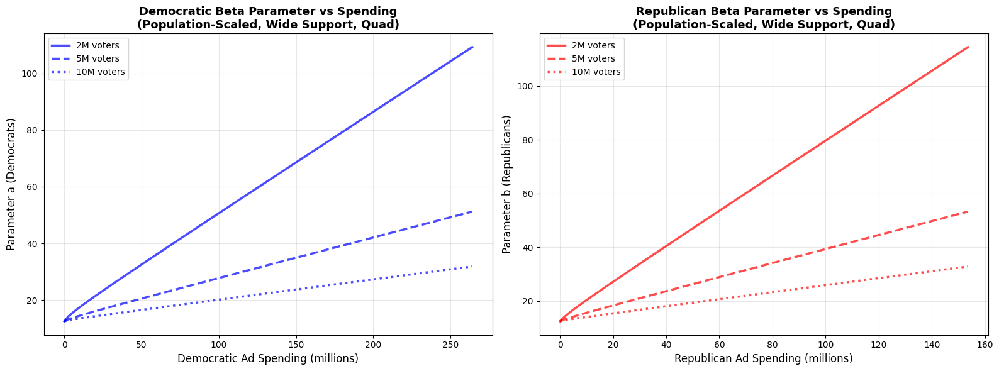

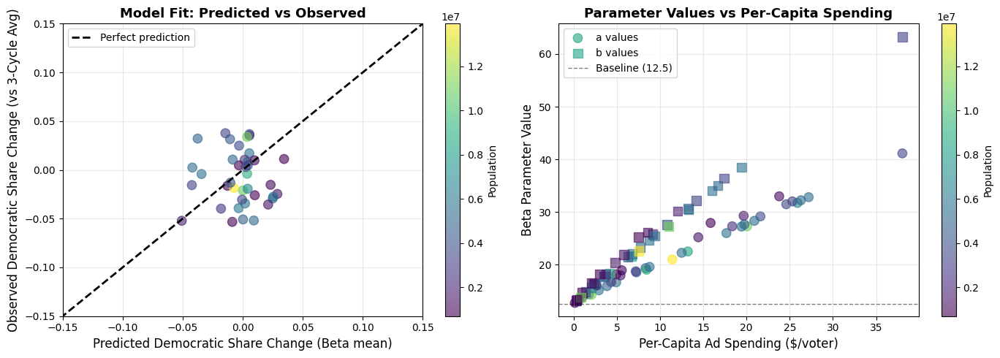

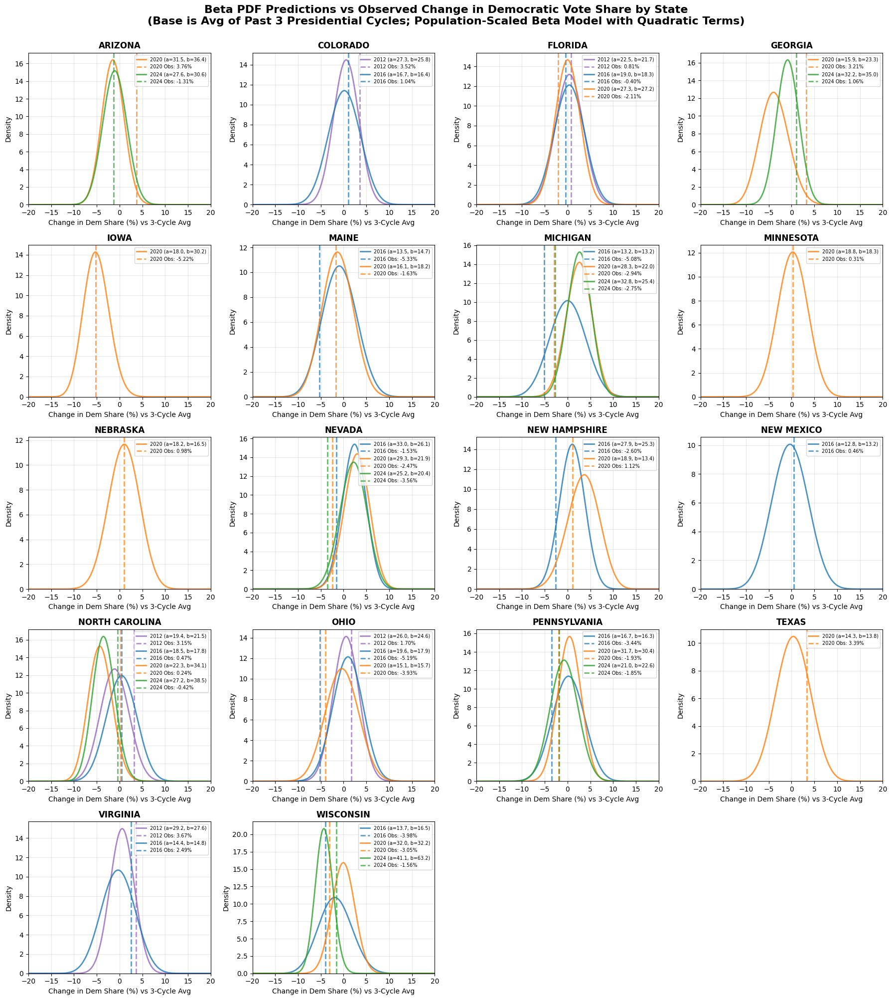


State-Year Summary:
             State  year  D-ad-spending  R-ad-spending  total_partisan          a          b  Turnout_Change
0          ARIZONA  2020           82.0           58.0         3333829  31.481217  36.377197        0.037626
1          ARIZONA  2024           91.0           61.0         4606287  27.648117  30.633802       -0.013141
2         COLORADO  2012           46.0           23.0         2508048  27.296364  25.820634        0.035173
3         COLORADO  2016           11.0            6.0         2541354  16.715163  16.448036        0.010385
4          FLORIDA  2012          111.0           56.0         8401203  22.519450  21.663308        0.008103
5          FLORIDA  2016           77.0           38.0         9122861  19.040185  18.345109       -0.003976
6          FLORIDA  2020          220.0          121.0        10965776  27.290392  27.245677       -0.021085
7          GEORGIA  2020           19.0           38.0         4936344  15.939706  23.302351        0.03210

In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# --- Calculate Democratic Vote Share by State and Year ---

# 1. Get state-level vote counts by year (only DEMOCRAT and REPUBLICAN)
state_partisan_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()

# 2. Calculate Democratic Share and total partisan votes
state_partisan_votes['DEM_SHARE'] = state_partisan_votes['DEMOCRAT'] / (state_partisan_votes['DEMOCRAT'] + state_partisan_votes['REPUBLICAN'])
state_partisan_votes['total_partisan'] = state_partisan_votes['DEMOCRAT'] + state_partisan_votes['REPUBLICAN']

# 3. Create 'Avg-3-Year-Prior-DEM_SHARE' column
state_partisan_votes = state_partisan_votes.sort_values(['state', 'year']).reset_index(drop=True)

# Define the function to apply the rolling mean and shift
def get_past_3_avg(series):
    # Shift(1) excludes the current year's share (t)
    # Rolling(window=3, min_periods=3) calculates the mean of the 3 prior cycles (t-4, t-8, t-12)
    return series.shift(1).rolling(window=3, min_periods=3).mean()

# FIX: Use .transform() instead of .apply() to maintain the index alignment
state_partisan_votes['Avg-3-Year-Prior-DEM_SHARE'] = (
    state_partisan_votes.groupby('state')['DEM_SHARE']
    .transform(get_past_3_avg)
)

# Standardize state names for merge
state_partisan_votes['state'] = state_partisan_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# 4. Merge ad spending with the new calculated vote shares and population
combined_data = ad_df.merge(
    state_partisan_votes[['year', 'state', 'total_partisan', 'DEM_SHARE', 'Avg-3-Year-Prior-DEM_SHARE']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='inner'
)

# --- FILTER: Throw out Iowa in 2016 ---
# Remove Iowa 2016 from combined_data before modeling
combined_data = combined_data[~((combined_data['State'] == 'IOWA') & (combined_data['year'] == 2016))]

# --- Calculate turnout_change based on Dem Vote Share difference from 3-year average ---
combined_data['turnout_change'] = combined_data['DEM_SHARE'] - combined_data['Avg-3-Year-Prior-DEM_SHARE']

# Remove rows with missing data (now excludes years without 3 prior data points)
combined_data = combined_data.dropna(subset=['D-ad-spending', 'R-ad-spending', 'turnout_change', 'total_partisan'])

# Extract arrays
D_spending = combined_data['D-ad-spending'].values
R_spending = combined_data['R-ad-spending'].values
turnout_change = combined_data['turnout_change'].values
total_partisan = combined_data['total_partisan'].values

print(f"Number of observations: {len(D_spending)}")
print(f"Turnout change range: [{np.min(turnout_change):.4f}, {np.max(turnout_change):.4f}]")
print(f"D spending range: [{np.min(D_spending):.2f}, {np.max(D_spending):.2f}] million")
print(f"R spending range: [{np.min(R_spending):.2f}, {np.max(R_spending):.2f}] million")
print(f"Population range: [{np.min(total_partisan):,.0f}, {np.max(total_partisan):,.0f}] voters")

# Transform turnout_change to [0, 1] for Beta only internally
lower, upper = -0.2, 0.2
transformed_data = (turnout_change - lower) / (upper - lower)
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

print(f"Transformed data range: [{np.min(transformed_data):.4f}, {np.max(transformed_data):.4f}]")

# === MODEL WITH MUCH LARGER PARAMETER SUPPORT AND QUADRATIC TERMS ===

# Population-scaled Beta parameter model with quadratic and super-wide bounds
def g(D, a1, a2, a3):
    return a1 * D + a2 * np.log(D + 1) + a3 * D**2

def h(R, b1, b2, b3):
    return b1 * R + b2 * np.log(R + 1) + b3 * R**2

# Fixed baseline
a0_fixed = 12.5
b0_fixed = 12.5

def neg_log_likelihood_population_scaled(params):
    # params: a1, a2, a3, b1, b2, b3
    a1, a2, a3, b1, b2, b3 = params
    # ensure positiveness for all terms (quadratic can be negative, but only penalize negatives here)
    if a1 < 0 or a2 < 0 or a3 < 0 or b1 < 0 or b2 < 0 or b3 < 0:
        return 1e12
    a_vals = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1, a2, a3)
    b_vals = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1, b2, b3)
    if np.any(a_vals <= 0) or np.any(b_vals <= 0):
        return 1e12
    ll = np.sum(beta.logpdf(transformed_data, a_vals, b_vals))
    return -ll

# Initial guess: start small but allow optimizer to go big
initial_params = [1e6, 1e6, 0.0, 1e6, 1e6, 0.0]
widesup = 1e12
bounds = [
    (0, widesup),   # a1: linear term for D spending
    (0, widesup),   # a2: log term for D spending
    (0, widesup),   # a3: quad term for D spending
    (0, widesup),   # b1: linear term for R spending
    (0, widesup),   # b2: log term for R spending
    (0, widesup),   # b3: quad term for R spending
]

print("\n" + "="*60)
print("FITTING POPULATION-SCALED MODEL (WIDE SUPPORT & QUADRATIC)")
print("BASE: AVG OF PAST 3 PRESIDENTIAL CYCLES")
print("="*60)

result = minimize(neg_log_likelihood_population_scaled, initial_params, bounds=bounds, method='L-BFGS-B')

a1_opt, a2_opt, a3_opt, b1_opt, b2_opt, b3_opt = result.x
a0_opt = a0_fixed
b0_opt = b0_fixed

print("\n" + "="*60)
print("OPTIMIZED PARAMETERS")
print("="*60)
print(f"\nDemocratic parameter (a):")
print(f"  a = {a0_opt:.4f} + (1/population) * [{a1_opt:.2e}*D + {a2_opt:.2e}*ln(D+1) + {a3_opt:.2e}*D^2]")
print(f"\nRepublican parameter (b):")
print(f"  b = {b0_opt:.4f} + (1/population) * [{b1_opt:.2e}*R + {b2_opt:.2e}*ln(R+1) + {b3_opt:.2e}*R^2]")
print(f"\nFinal negative log-likelihood: {result.fun:.4f}")
print(f"Optimization success: {result.success}")

# Fitted parameter values for observed states
a_fitted = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1_opt, a2_opt, a3_opt)
b_fitted = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1_opt, b2_opt, b3_opt)

print("\n" + "="*60)
print("PARAMETER RANGES")
print("="*60)
print(f"a ranges from {a_fitted.min():.2f} to {a_fitted.max():.2f}")
print(f"b ranges from {b_fitted.min():.2f} to {b_fitted.max():.2f}")
print(f"\nThis is a {a_fitted.max() - a_fitted.min():.1f} point range for a")
print(f"and a {b_fitted.max() - b_fitted.min():.1f} point range for b")

# Visualize the fit for different population sizes
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

pop_small = 2e6
pop_medium = 5e6
pop_large = 10e6

D_range = np.linspace(0, np.max(D_spending) * 1.2, 100)
R_range = np.linspace(0, np.max(R_spending) * 1.2, 100)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    a_curve = a0_opt + (1.0 / pop) * g(D_range, a1_opt, a2_opt, a3_opt)
    axes[0].plot(D_range, a_curve, linestyle=style, color='b', lw=2.5, label=label, alpha=0.7)
axes[0].set_xlabel('Democratic Ad Spending (millions)', fontsize=12)
axes[0].set_ylabel('Parameter a (Democrats)', fontsize=12)
axes[0].set_title('Democratic Beta Parameter vs Spending\n(Population-Scaled, Wide Support, Quad)', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    b_curve = b0_opt + (1.0 / pop) * h(R_range, b1_opt, b2_opt, b3_opt)
    axes[1].plot(R_range, b_curve, linestyle=style, color='r', lw=2.5, label=label, alpha=0.7)
axes[1].set_xlabel('Republican Ad Spending (millions)', fontsize=12)
axes[1].set_ylabel('Parameter b (Republicans)', fontsize=12)
axes[1].set_title('Republican Beta Parameter vs Spending\n(Population-Scaled, Wide Support, Quad)', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show() # 

# Diagnostic plots: fit vs observed and per-capita spending vs a/b
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Compute predicted mean in the [-0.2, 0.2] range (original units)
predicted_mean_transformed = a_fitted / (a_fitted + b_fitted)
predicted_mean = predicted_mean_transformed * (upper - lower) + lower

axes[0].scatter(predicted_mean, turnout_change, alpha=0.6, s=80, c=total_partisan, cmap='viridis')
axes[0].plot([-0.2, 0.2], [-0.2, 0.2], 'k--', lw=2, label='Perfect prediction')
axes[0].set_xlabel('Predicted Democratic Share Change (Beta mean)', fontsize=12)
axes[0].set_ylabel('Observed Democratic Share Change (vs 3-Cycle Avg)', fontsize=12)
axes[0].set_title('Model Fit: Predicted vs Observed', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)
axes[0].set_xlim(-0.15, 0.15)
axes[0].set_ylim(-0.15, 0.15)
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label('Population', fontsize=10)

D_per_capita = D_spending * 1e6 / total_partisan
R_per_capita = R_spending * 1e6 / total_partisan

sc = axes[1].scatter(D_per_capita, a_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', label='a values')
axes[1].scatter(R_per_capita, b_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', marker='s', label='b values')
axes[1].axhline(y=a0_fixed, color='k', linestyle='--', lw=1, alpha=0.5, label=f'Baseline ({a0_fixed})')
axes[1].set_xlabel('Per-Capita Ad Spending ($/voter)', fontsize=12)
axes[1].set_ylabel('Beta Parameter Value', fontsize=12)
axes[1].set_title('Parameter Values vs Per-Capita Spending', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)
cbar1 = plt.colorbar(sc, ax=axes[1])
cbar1.set_label('Population', fontsize=10)

plt.tight_layout()
plt.show() # 

# --- Second part of the original code (Plotting PDFs) ---

# Re-run data merge to get the full state-year data including the new average
state_data = ad_df.merge(
    state_partisan_votes[['year', 'state', 'total_partisan', 'DEM_SHARE', 'Avg-3-Year-Prior-DEM_SHARE']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='left'
)

# One row per state-year, keep necessary variables
state_years = state_data[['State', 'year', 'D-ad-spending', 'R-ad-spending',
                          'DEM_SHARE', 'Avg-3-Year-Prior-DEM_SHARE', 'total_partisan']].drop_duplicates()
state_years = state_years.sort_values(['State', 'year']).reset_index(drop=True)

# --- FILTER: Throw out Iowa in 2016 for plotting/summaries too ---
state_years = state_years[~((state_years['State'] == 'IOWA') & (state_years['year'] == 2016))]

# Safe numeric conversion
D_state_years = state_years['D-ad-spending'].astype(float).values
R_state_years = state_years['R-ad-spending'].astype(float).values
population_state_years = state_years['total_partisan'].astype(float).values

# Compute a and b for each state-year using quadratic model
state_years['a'] = a0_opt + (1.0 / population_state_years) * g(D_state_years, a1_opt, a2_opt, a3_opt)
state_years['b'] = b0_opt + (1.0 / population_state_years) * h(R_state_years, b1_opt, b2_opt, b3_opt)

# Turnout change in [-0.2, 0.2] (decimal)
state_years['Turnout_Change'] = state_years['DEM_SHARE'] - state_years['Avg-3-Year-Prior-DEM_SHARE']

# Remove rows with NaN turnout changes
state_years = state_years.dropna(subset=['Turnout_Change', 'a', 'b'])

# State list for plotting
unique_states = sorted(state_years['State'].unique())

n_states = len(unique_states)
n_cols = 4
n_rows = (n_states + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4 * n_rows))
axes = axes.flatten()

x_range = np.linspace(-0.2, 0.2, 500)
x_transformed = (x_range + 0.2) / 0.4

# Colors by year
year_colors = {2012: '#9467bd', 2016: '#1f77b4', 2020: '#ff7f0e', 2024: '#2ca02c'}

for idx, state in enumerate(unique_states):
    ax = axes[idx]
    state_entries = state_years[state_years['State'] == state]
    
    for _, row in state_entries.iterrows():
        a_val = row['a']
        b_val = row['b']
        turnout_change = row['Turnout_Change']
        year = int(row['year'])
        color = year_colors.get(year, 'gray')
        
        pdf_vals = beta.pdf(x_transformed, a_val, b_val)
        pdf_vals = pdf_vals / 0.4  # dy/dx for scaling to correct domain
        
        # Plot Beta PDF (predicted)
        ax.plot(x_range * 100, pdf_vals,
                linewidth=2, color=color,
                label=f'{year} (a={a_val:.1f}, b={b_val:.1f})',
                alpha=0.8)
        
        # Overlay observed turnout-change
        ax.axvline(x=turnout_change * 100,
                   linestyle='--', linewidth=2,
                   alpha=0.7, color=color,
                   label=f'{year} Obs: {turnout_change*100:.2f}%')
        
    ax.set_xlim(-20, 20)
    ax.set_ylim(bottom=0)
    ax.set_xlabel('Change in Dem Share (%) vs 3-Cycle Avg', fontsize=10) # Updated label
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title(f'{state}', fontsize=12, fontweight='bold')
    ax.legend(fontsize=7, loc='upper right')
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(n_states, len(axes)):
    axes[idx].axis('off')

plt.suptitle(
    'Beta PDF Predictions vs Observed Change in Democratic Vote Share by State\n'
    '(Base is Avg of Past 3 Presidential Cycles; Population-Scaled Beta Model with Quadratic Terms)',
    fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show() # 

# Also print a summary table including a, b, population and input spending
print("\nState-Year Summary:")
print(state_years[['State', 'year', 'D-ad-spending', 'R-ad-spending', 'total_partisan', 
                   'a', 'b', 'Turnout_Change']].to_string())

One more thing. Let's try the weighted average

Number of observations: 39
Turnout change range: [-0.0683, 0.0501]
D spending range: [0.10, 220.00] million
R spending range: [0.20, 128.00] million
Population range: [693,328, 13,932,700] voters
Transformed data range: [0.3291, 0.6254]

FITTING POPULATION-SCALED MODEL (WIDE SUPPORT & QUADRATIC)
BASE: WEIGHTED AVG OF LAST 3 PRESIDENTIAL CYCLES (weights: 1, 1/2, 1/3)

OPTIMIZED PARAMETERS

Democratic parameter (a):
  a = 12.5000 + (1/population) * [5.29e+05*D + 9.94e+05*ln(D+1) + 0.00e+00*D^2]

Republican parameter (b):
  b = 12.5000 + (1/population) * [1.07e+06*R + 9.28e+05*ln(R+1) + 0.00e+00*R^2]

Final negative log-likelihood: -35.6416
Optimization success: True

PARAMETER RANGES
a ranges from 12.71 to 34.05
b ranges from 13.05 to 54.71

This is a 21.3 point range for a
and a 41.7 point range for b


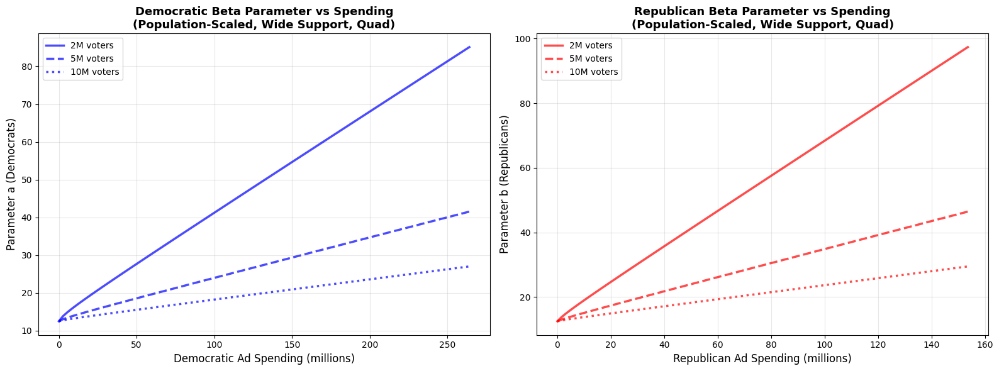

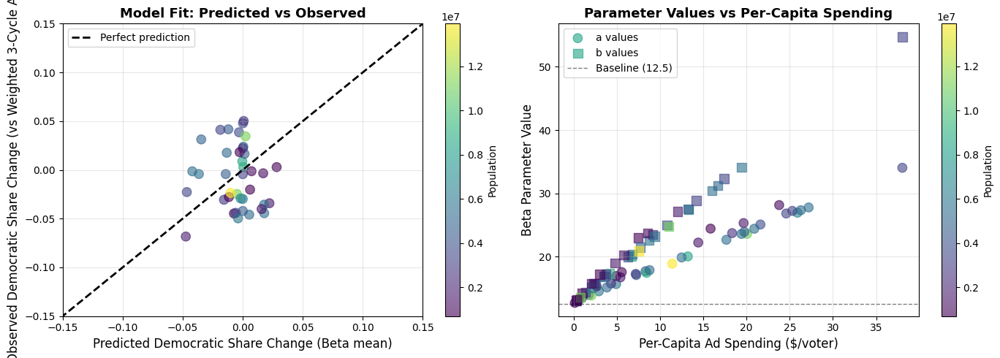

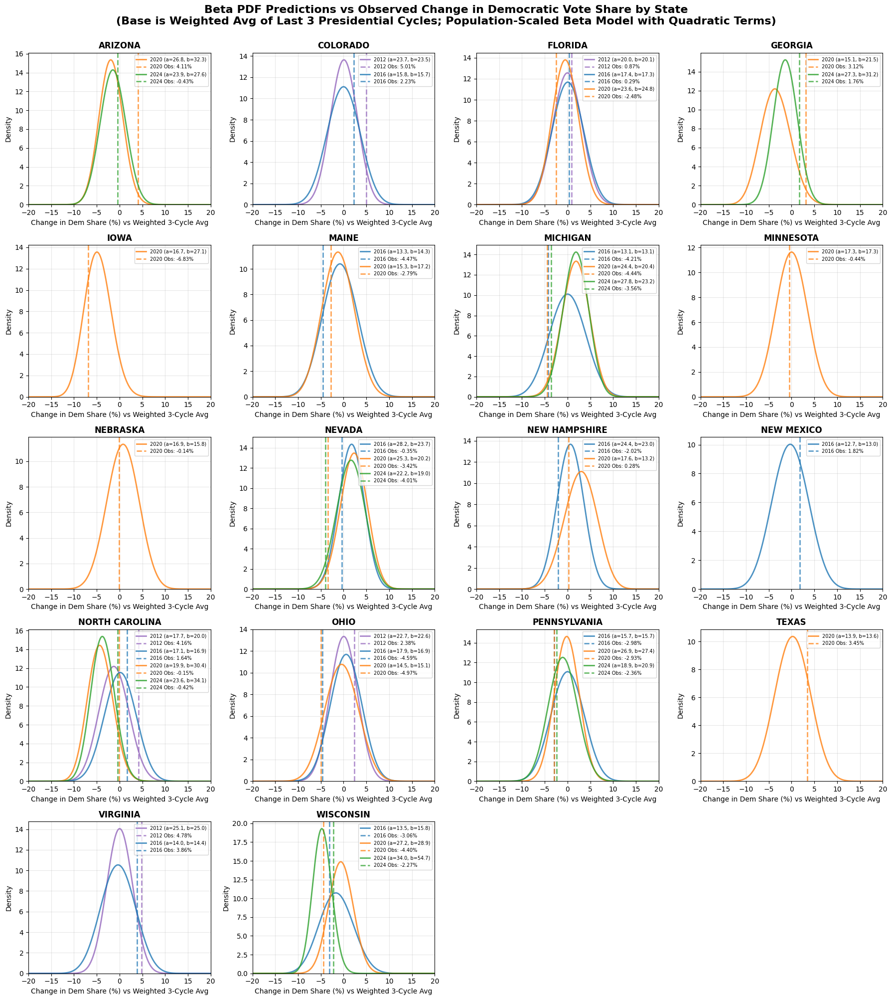


State-Year Summary:
             State  year  D-ad-spending  R-ad-spending  total_partisan          a          b  Turnout_Change
0          ARIZONA  2020           82.0           58.0         3333829  26.824143  32.333778        0.041117
1          ARIZONA  2024           91.0           61.0         4606287  23.922638  27.564800       -0.004263
2         COLORADO  2012           46.0           23.0         2508048  23.724473  23.532589        0.050149
3         COLORADO  2016           11.0            6.0         2541354  15.760523  15.748347        0.022329
4          FLORIDA  2012          111.0           56.0         8401203  20.045096  20.110917        0.008718
5          FLORIDA  2016           77.0           38.0         9122861  17.437967  17.349642        0.002907
6          FLORIDA  2020          220.0          121.0        10965776  23.598621  24.766131       -0.024762
7          GEORGIA  2020           19.0           38.0         4936344  15.138452  21.462628        0.03124

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta
from scipy.optimize import minimize

# Load data
county_df = pd.read_csv('countypres_2000-2024.csv')
ad_df = pd.read_csv('ad_data.csv')

# --- Calculate Democratic Vote Share by State and Year ---

# 1. Get state-level vote counts by year (only DEMOCRAT and REPUBLICAN)
state_partisan_votes = county_df[county_df['party'].isin(['DEMOCRAT', 'REPUBLICAN'])].groupby(
    ['year', 'state', 'party']
)['candidatevotes'].sum().unstack(fill_value=0).reset_index()

# 2. Calculate Democratic Share and total partisan votes
state_partisan_votes['DEM_SHARE'] = state_partisan_votes['DEMOCRAT'] / (state_partisan_votes['DEMOCRAT'] + state_partisan_votes['REPUBLICAN'])
state_partisan_votes['total_partisan'] = state_partisan_votes['DEMOCRAT'] + state_partisan_votes['REPUBLICAN']

# 3. Create 'Weighted-3-Year-Prior-DEM_SHARE' column with inverse distance weights: 1 (last), 1/2 (second), 1/3 (third)
state_partisan_votes = state_partisan_votes.sort_values(['state', 'year']).reset_index(drop=True)

def past_3_inverse_weights(series):
    # Shift(1) excludes current year
    s = series.shift(1)
    values = np.full(series.shape[0], np.nan)
    weights = np.array([1, 1/2, 1/3])
    for i in range(3, len(s)+1):
        window = s.iloc[i-3:i].values
        if np.isnan(window).any():
            continue
        weighted_avg = np.dot(window, weights) / np.sum(weights)
        values[i-1] = weighted_avg
    return pd.Series(values, index=series.index)

state_partisan_votes['Weighted-3-Year-Prior-DEM_SHARE'] = (
    state_partisan_votes.groupby('state')['DEM_SHARE'].transform(past_3_inverse_weights)
)

# Standardize state names for merge
state_partisan_votes['state'] = state_partisan_votes['state'].str.upper()
ad_df['State'] = ad_df['State'].str.upper()

# 4. Merge ad spending with the new calculated vote shares and population
combined_data = ad_df.merge(
    state_partisan_votes[['year', 'state', 'total_partisan', 'DEM_SHARE', 'Weighted-3-Year-Prior-DEM_SHARE']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='inner'
)

# --- FILTER: Throw out Iowa in 2016 ---
combined_data = combined_data[~((combined_data['State'] == 'IOWA') & (combined_data['year'] == 2016))]

# --- Calculate turnout_change based on Dem Vote Share difference from weighted 3-year average ---
combined_data['turnout_change'] = combined_data['DEM_SHARE'] - combined_data['Weighted-3-Year-Prior-DEM_SHARE']

# Remove rows with missing data (now excludes years without 3 prior data points)
combined_data = combined_data.dropna(subset=['D-ad-spending', 'R-ad-spending', 'turnout_change', 'total_partisan'])

# Extract arrays
D_spending = combined_data['D-ad-spending'].values
R_spending = combined_data['R-ad-spending'].values
turnout_change = combined_data['turnout_change'].values
total_partisan = combined_data['total_partisan'].values

print(f"Number of observations: {len(D_spending)}")
print(f"Turnout change range: [{np.min(turnout_change):.4f}, {np.max(turnout_change):.4f}]")
print(f"D spending range: [{np.min(D_spending):.2f}, {np.max(D_spending):.2f}] million")
print(f"R spending range: [{np.min(R_spending):.2f}, {np.max(R_spending):.2f}] million")
print(f"Population range: [{np.min(total_partisan):,.0f}, {np.max(total_partisan):,.0f}] voters")

# Transform turnout_change to [0, 1] for Beta only internally
lower, upper = -0.2, 0.2
transformed_data = (turnout_change - lower) / (upper - lower)
eps = 1e-7
transformed_data = np.clip(transformed_data, eps, 1 - eps)

print(f"Transformed data range: [{np.min(transformed_data):.4f}, {np.max(transformed_data):.4f}]")

# === MODEL WITH MUCH LARGER PARAMETER SUPPORT AND QUADRATIC TERMS ===

# Population-scaled Beta parameter model with quadratic and super-wide bounds
def g(D, a1, a2, a3):
    return a1 * D + a2 * np.log(D + 1) + a3 * D**2

def h(R, b1, b2, b3):
    return b1 * R + b2 * np.log(R + 1) + b3 * R**2

# Fixed baseline
a0_fixed = 12.5
b0_fixed = 12.5

def neg_log_likelihood_population_scaled(params):
    a1, a2, a3, b1, b2, b3 = params
    if a1 < 0 or a2 < 0 or a3 < 0 or b1 < 0 or b2 < 0 or b3 < 0:
        return 1e12
    a_vals = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1, a2, a3)
    b_vals = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1, b2, b3)
    if np.any(a_vals <= 0) or np.any(b_vals <= 0):
        return 1e12
    ll = np.sum(beta.logpdf(transformed_data, a_vals, b_vals))
    return -ll

initial_params = [1e6, 1e6, 0.0, 1e6, 1e6, 0.0]
widesup = 1e12
bounds = [
    (0, widesup),
    (0, widesup),
    (0, widesup),
    (0, widesup),
    (0, widesup),
    (0, widesup),
]

print("\n" + "="*60)
print("FITTING POPULATION-SCALED MODEL (WIDE SUPPORT & QUADRATIC)")
print("BASE: WEIGHTED AVG OF LAST 3 PRESIDENTIAL CYCLES (weights: 1, 1/2, 1/3)")
print("="*60)

result = minimize(neg_log_likelihood_population_scaled, initial_params, bounds=bounds, method='L-BFGS-B')

a1_opt, a2_opt, a3_opt, b1_opt, b2_opt, b3_opt = result.x
a0_opt = a0_fixed
b0_opt = b0_fixed

print("\n" + "="*60)
print("OPTIMIZED PARAMETERS")
print("="*60)
print(f"\nDemocratic parameter (a):")
print(f"  a = {a0_opt:.4f} + (1/population) * [{a1_opt:.2e}*D + {a2_opt:.2e}*ln(D+1) + {a3_opt:.2e}*D^2]")
print(f"\nRepublican parameter (b):")
print(f"  b = {b0_opt:.4f} + (1/population) * [{b1_opt:.2e}*R + {b2_opt:.2e}*ln(R+1) + {b3_opt:.2e}*R^2]")
print(f"\nFinal negative log-likelihood: {result.fun:.4f}")
print(f"Optimization success: {result.success}")

# Fitted parameter values for observed states
a_fitted = a0_fixed + (1.0 / total_partisan) * g(D_spending, a1_opt, a2_opt, a3_opt)
b_fitted = b0_fixed + (1.0 / total_partisan) * h(R_spending, b1_opt, b2_opt, b3_opt)

print("\n" + "="*60)
print("PARAMETER RANGES")
print("="*60)
print(f"a ranges from {a_fitted.min():.2f} to {a_fitted.max():.2f}")
print(f"b ranges from {b_fitted.min():.2f} to {b_fitted.max():.2f}")
print(f"\nThis is a {a_fitted.max() - a_fitted.min():.1f} point range for a")
print(f"and a {b_fitted.max() - b_fitted.min():.1f} point range for b")

# Visualize the fit for different population sizes
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

pop_small = 2e6
pop_medium = 5e6
pop_large = 10e6

D_range = np.linspace(0, np.max(D_spending) * 1.2, 100)
R_range = np.linspace(0, np.max(R_spending) * 1.2, 100)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    a_curve = a0_opt + (1.0 / pop) * g(D_range, a1_opt, a2_opt, a3_opt)
    axes[0].plot(D_range, a_curve, linestyle=style, color='b', lw=2.5, label=label, alpha=0.7)
axes[0].set_xlabel('Democratic Ad Spending (millions)', fontsize=12)
axes[0].set_ylabel('Parameter a (Democrats)', fontsize=12)
axes[0].set_title('Democratic Beta Parameter vs Spending\n(Population-Scaled, Wide Support, Quad)', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

for pop, label, style in [(pop_small, '2M voters', '-'), (pop_medium, '5M voters', '--'), (pop_large, '10M voters', ':')]:
    b_curve = b0_opt + (1.0 / pop) * h(R_range, b1_opt, b2_opt, b3_opt)
    axes[1].plot(R_range, b_curve, linestyle=style, color='r', lw=2.5, label=label, alpha=0.7)
axes[1].set_xlabel('Republican Ad Spending (millions)', fontsize=12)
axes[1].set_ylabel('Parameter b (Republicans)', fontsize=12)
axes[1].set_title('Republican Beta Parameter vs Spending\n(Population-Scaled, Wide Support, Quad)', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show() # 

# Diagnostic plots: fit vs observed and per-capita spending vs a/b
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Compute predicted mean in the [-0.2, 0.2] range (original units)
predicted_mean_transformed = a_fitted / (a_fitted + b_fitted)
predicted_mean = predicted_mean_transformed * (upper - lower) + lower

axes[0].scatter(predicted_mean, turnout_change, alpha=0.6, s=80, c=total_partisan, cmap='viridis')
axes[0].plot([-0.2, 0.2], [-0.2, 0.2], 'k--', lw=2, label='Perfect prediction')
axes[0].set_xlabel('Predicted Democratic Share Change (Beta mean)', fontsize=12)
axes[0].set_ylabel('Observed Democratic Share Change (vs Weighted 3-Cycle Avg)', fontsize=12)
axes[0].set_title('Model Fit: Predicted vs Observed', fontsize=13, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)
axes[0].set_xlim(-0.15, 0.15)
axes[0].set_ylim(-0.15, 0.15)
cbar0 = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar0.set_label('Population', fontsize=10)

D_per_capita = D_spending * 1e6 / total_partisan
R_per_capita = R_spending * 1e6 / total_partisan

sc = axes[1].scatter(D_per_capita, a_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', label='a values')
axes[1].scatter(R_per_capita, b_fitted, alpha=0.6, s=80, c=total_partisan, cmap='viridis', marker='s', label='b values')
axes[1].axhline(y=a0_fixed, color='k', linestyle='--', lw=1, alpha=0.5, label=f'Baseline ({a0_fixed})')
axes[1].set_xlabel('Per-Capita Ad Spending ($/voter)', fontsize=12)
axes[1].set_ylabel('Beta Parameter Value', fontsize=12)
axes[1].set_title('Parameter Values vs Per-Capita Spending', fontsize=13, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)
cbar1 = plt.colorbar(sc, ax=axes[1])
cbar1.set_label('Population', fontsize=10)

plt.tight_layout()
plt.show() # 

# --- Second part of the original code (Plotting PDFs) ---

# Re-run data merge to get the full state-year data including the new weighted average
state_data = ad_df.merge(
    state_partisan_votes[['year', 'state', 'total_partisan', 'DEM_SHARE', 'Weighted-3-Year-Prior-DEM_SHARE']],
    left_on=['year', 'State'],
    right_on=['year', 'state'],
    how='left'
)

# One row per state-year, keep necessary variables
state_years = state_data[['State', 'year', 'D-ad-spending', 'R-ad-spending',
                          'DEM_SHARE', 'Weighted-3-Year-Prior-DEM_SHARE', 'total_partisan']].drop_duplicates()
state_years = state_years.sort_values(['State', 'year']).reset_index(drop=True)

# --- FILTER: Throw out Iowa in 2016 for plotting/summaries too ---
state_years = state_years[~((state_years['State'] == 'IOWA') & (state_years['year'] == 2016))]

# Safe numeric conversion
D_state_years = state_years['D-ad-spending'].astype(float).values
R_state_years = state_years['R-ad-spending'].astype(float).values
population_state_years = state_years['total_partisan'].astype(float).values

# Compute a and b for each state-year using quadratic model
state_years['a'] = a0_opt + (1.0 / population_state_years) * g(D_state_years, a1_opt, a2_opt, a3_opt)
state_years['b'] = b0_opt + (1.0 / population_state_years) * h(R_state_years, b1_opt, b2_opt, b3_opt)

# Turnout change in [-0.2, 0.2] (decimal)
state_years['Turnout_Change'] = state_years['DEM_SHARE'] - state_years['Weighted-3-Year-Prior-DEM_SHARE']

# Remove rows with NaN turnout changes
state_years = state_years.dropna(subset=['Turnout_Change', 'a', 'b'])

# State list for plotting
unique_states = sorted(state_years['State'].unique())

n_states = len(unique_states)
n_cols = 4
n_rows = (n_states + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4 * n_rows))
axes = axes.flatten()

x_range = np.linspace(-0.2, 0.2, 500)
x_transformed = (x_range + 0.2) / 0.4

# Colors by year
year_colors = {2012: '#9467bd', 2016: '#1f77b4', 2020: '#ff7f0e', 2024: '#2ca02c'}

for idx, state in enumerate(unique_states):
    ax = axes[idx]
    state_entries = state_years[state_years['State'] == state]
    
    for _, row in state_entries.iterrows():
        a_val = row['a']
        b_val = row['b']
        turnout_change = row['Turnout_Change']
        year = int(row['year'])
        color = year_colors.get(year, 'gray')
        
        pdf_vals = beta.pdf(x_transformed, a_val, b_val)
        pdf_vals = pdf_vals / 0.4  # dy/dx for scaling to correct domain
        
        # Plot Beta PDF (predicted)
        ax.plot(x_range * 100, pdf_vals,
                linewidth=2, color=color,
                label=f'{year} (a={a_val:.1f}, b={b_val:.1f})',
                alpha=0.8)
        
        # Overlay observed turnout-change
        ax.axvline(x=turnout_change * 100,
                   linestyle='--', linewidth=2,
                   alpha=0.7, color=color,
                   label=f'{year} Obs: {turnout_change*100:.2f}%')
        
    ax.set_xlim(-20, 20)
    ax.set_ylim(bottom=0)
    ax.set_xlabel('Change in Dem Share (%) vs Weighted 3-Cycle Avg', fontsize=10)  # Update label
    ax.set_ylabel('Density', fontsize=10)
    ax.set_title(f'{state}', fontsize=12, fontweight='bold')
    ax.legend(fontsize=7, loc='upper right')
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for idx in range(n_states, len(axes)):
    axes[idx].axis('off')

plt.suptitle(
    'Beta PDF Predictions vs Observed Change in Democratic Vote Share by State\n'
    '(Base is Weighted Avg of Last 3 Presidential Cycles; Population-Scaled Beta Model with Quadratic Terms)',
    fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show() # 

# Also print a summary table including a, b, population and input spending
print("\nState-Year Summary:")
print(state_years[['State', 'year', 'D-ad-spending', 'R-ad-spending', 'total_partisan', 
                   'a', 'b', 'Turnout_Change']].to_string())

Now to select the best basis. What we've got is just linear but I have my doubts that that is the best